In [1]:
import numpy as np

# Import algorithms, operators and functions from CIL optimisation module
from cil.optimisation.algorithms import PDHG_2013 as PDHG
from cil.optimisation.operators import BlockOperator, GradientOperator,\
                                       GradientOperator
from cil.optimisation.functions import IndicatorBox, MixedL21Norm, L2NormSquared, \
                                       BlockFunction, L1Norm, LeastSquares, \
                                       OperatorCompositionFunction, TotalVariation

# Import CIL Processors for preprocessing
from cil.processors import CentreOfRotationCorrector, Slicer, TransmissionAbsorptionConverter

# Import CIL utilities
from cil.utilities.display import show2D
from cil.utilities import dataexample

# Import from CIL ASTRA plugin
from cil.plugins.tigre import ProjectionOperator


# Import FBP from CIL recon class
from cil.recon import FBP, FDK

from cil.framework import ImageData

#Import Total Variation from the regularisation toolkit plugin
from cil.plugins.ccpi_regularisation.functions import FGP_TV

# All external imports
import matplotlib.pyplot as plt
import math

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

New geometry:  3D Cone-beam tomography
System configuration:
	Source position: [     0., -20000.,      0.]
	Rotation axis position: [0., 0., 0.]
	Rotation axis direction: [0., 0., 1.]
	Detector position: [    0., 60000.,     0.]
	Detector direction x: [1., 0., 0.]
	Detector direction y: [0., 0., 1.]
Panel configuration:
	Number of pixels: [128 128]
	Pixel size: [64. 64.]
	Pixel origin: bottom-left
Channel configuration:
	Number of channels: 1
Acquisition description:
	Number of positions: 60
	Angles 0-9 in degrees: [ 0.,  6., 12., 18., 24., 30., 36., 42., 48., 54.]
	Angles 50-59 in degrees: [300., 306., 312., 318., 324., 330., 336., 342., 348., 354.]
	Full angular array can be accessed with acquisition_data.geometry.angles
Distances in units: units distance
Shape out:  (60, 128, 128)
New geometry shape:  (60, 128, 128)
FDK recon

Input Data:
	angle: 60
	vertical: 128
	horizontal: 128

Reconstruction Volume:
	vertical: 128
	horizontal_y: 128
	horizontal_x: 128

Reconstruction Options:
	

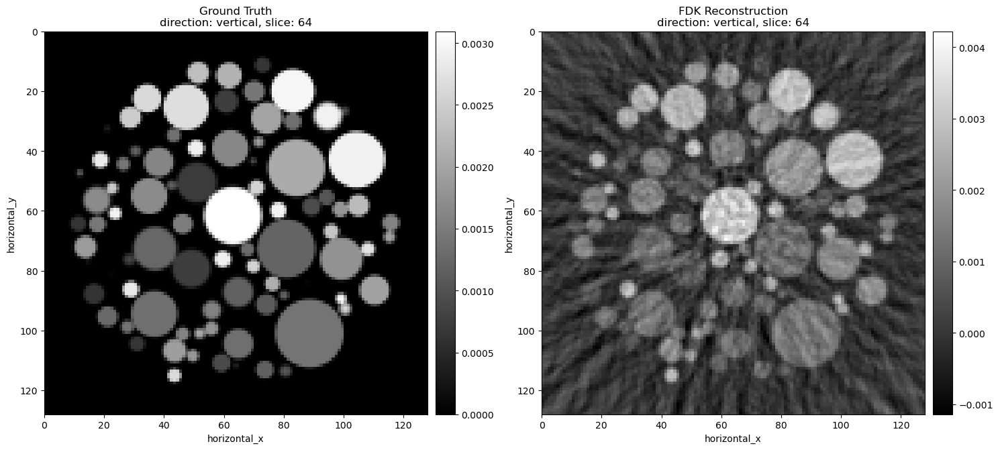

In [2]:
ground_truth = dataexample.SIMULATED_SPHERE_VOLUME.get()

data = dataexample.SIMULATED_CONE_BEAM_DATA.get()


absorption = TransmissionAbsorptionConverter()(data)
absorption = Slicer(roi={'angle':(0, -1, 5)})(absorption)

ig = ground_truth.geometry

recon = FDK(absorption, image_geometry=ig).run()
show2D([ground_truth, recon], title = ['Ground Truth', 'FDK Reconstruction'], origin = 'upper', num_cols = 2);

In [3]:
from cil.optimisation.utilities.callbacks import Callback, ProgressCallback

class SaveStepSizes(Callback):
    def __init__(self):
        super().__init__()
        self.tau = []
        self.sigma = []

    def __call__(self, algorithm):
        self.tau.append(algorithm.tau)
        self.sigma.append(algorithm.sigma)

In [4]:
A = ProjectionOperator(ig, absorption.geometry, device = "gpu")

In [5]:
# Test robustness to silly scaling
A*=100
absorption*=100

In [ ]:
from cil.optimisation.functions import Function
class ScaledArgFunction(Function):
    def __init__(self, function, scalar):
        self.function = function
        self.scalar = scalar
    def __call__(self, x):
        x *= self.scalar
        ret = self.function(x)
        x /= self.scalar
        return ret
    def gradient(self, x, out=None):
        x *= self.scalar
        if out is None:
            out = self.function.gradient(x)
        else:
            self.function.gradient(x, out=out)
        out *= self.scalar
        x /= self.scalar
        return out
    def proximal(self, x, tau, out=None):
        # eq 6.6 of https://archive.siam.org/books/mo25/mo25_ch6.pdf
        should_return = False
        if out is None:
            out = x * 0
        x *= self.scalar
        self.function.proximal( x, tau * self.scalar**2, out=out)
        x /= self.scalar
        out /= self.scalar
        return out
    def convex_conjugate(self, x):
        # https://en.wikipedia.org/wiki/Convex_conjugate#Table_of_selected_convex_conjugates
        x /= self.scalar
        ret = self.function.convex_conjugate(x)
        x *= self.scalar
        return ret

# PDHG with Explicit TV - adaptive vs non-adaptive

In [16]:
# Vanilla TV with reg parameter in front of Mixed L21 Norm
alpha = 0.5
G = IndicatorBox(lower=0)
rho = 1.0
f1 =  alpha *MixedL21Norm()
f2 = 0.5 * L2NormSquared(b=absorption)
F = BlockFunction(f1, f2)

# Define BlockOperator K
Grad =  GradientOperator(ig)
K = BlockOperator(Grad, A)



gamma_list = [0.01, 0.1, 1, 10, 100, 1000, 1/alpha]
results_vanilla = []
objective_vanilla = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/K.norm()
    tau =(rho/gamma)/K.norm() 
    pdhg_tv_explicit = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau)
    pdhg_tv_explicit.run(200, verbose=1)
    results_vanilla.append(pdhg_tv_explicit.solution)
    objective_vanilla.append(pdhg_tv_explicit.objective)



gamma =  0.01
Initial step sizes: tau = 0.0007297007443081006, sigma = 7.297007443081006e-08


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.7239248
x norm =  0.7239248
x_tmp norm =  0.7814491
x norm =  0.19123183
x_tmp norm =  0.8811971
x norm =  0.2028865
x_tmp norm =  0.99571663
x norm =  0.17862894
x_tmp norm =  1.0842422
x norm =  0.1573961
x_tmp norm =  1.1522797
x norm =  0.14954495
x_tmp norm =  1.2179871
x norm =  0.13658401
x_tmp norm =  1.2785538
x norm =  0.1194508
x_tmp norm =  1.326795
x norm =  0.10216366
x_tmp norm =  1.3603483
x norm =  0.08801609
x_tmp norm =  1.3810643
x norm =  0.078191854
x_tmp norm =  1.3923886
x norm =  0.07209464
x_tmp norm =  1.3977008
x norm =  0.06830281
x_tmp norm =  1.3995805
x norm =  0.06549947
x_tmp norm =  1.3995818
x norm =  0.06295885
x_tmp norm =  1.3985049
x norm =  0.060264267
x_tmp norm =  1.3967271
x norm =  0.057426214
x_tmp norm =  1.3944861
x norm =  0.054661077
x_tmp norm =  1.3920313
x norm =  0.05222395
x_tmp norm =  1.3896519
x norm =  0.050307315
x_tmp norm =  1.3876207
x norm =  0.048901953
x_tmp norm =  1.3861243
x norm =  0.047900386
x_tmp n

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.7239244
x norm =  0.7239244
x_tmp norm =  0.78144896
x norm =  0.19123168
x_tmp norm =  0.8811969
x norm =  0.20288633
x_tmp norm =  0.9957162
x norm =  0.17862877
x_tmp norm =  1.0842416
x norm =  0.15739587
x_tmp norm =  1.1522791
x norm =  0.14954472
x_tmp norm =  1.2179863
x norm =  0.13658379
x_tmp norm =  1.2785529
x norm =  0.119450614
x_tmp norm =  1.3267939
x norm =  0.102163486
x_tmp norm =  1.3603473
x norm =  0.08801593
x_tmp norm =  1.3810633
x norm =  0.07819169
x_tmp norm =  1.3923875
x norm =  0.072094455
x_tmp norm =  1.3976998
x norm =  0.0683026
x_tmp norm =  1.3995795
x norm =  0.065499246
x_tmp norm =  1.3995808
x norm =  0.06295861
x_tmp norm =  1.3985038
x norm =  0.060264014
x_tmp norm =  1.3967261
x norm =  0.05742596
x_tmp norm =  1.394485
x norm =  0.054660816
x_tmp norm =  1.3920302
x norm =  0.052223682
x_tmp norm =  1.3896507
x norm =  0.05030704
x_tmp norm =  1.3876195
x norm =  0.048901673
x_tmp norm =  1.3861231
x norm =  0.04790009
x_tm

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.72391963
x norm =  0.72391963
x_tmp norm =  0.78144795
x norm =  0.19123003
x_tmp norm =  0.8811942
x norm =  0.20288432
x_tmp norm =  0.9957117
x norm =  0.17862701
x_tmp norm =  1.0842364
x norm =  0.15739371
x_tmp norm =  1.1522726
x norm =  0.14954223
x_tmp norm =  1.2179781
x norm =  0.13658158
x_tmp norm =  1.2785432
x norm =  0.11944876
x_tmp norm =  1.3267835
x norm =  0.10216186
x_tmp norm =  1.3603364
x norm =  0.08801429
x_tmp norm =  1.3810526
x norm =  0.078189954
x_tmp norm =  1.3923769
x norm =  0.072092526
x_tmp norm =  1.3976893
x norm =  0.06830051
x_tmp norm =  1.3995689
x norm =  0.06549699
x_tmp norm =  1.3995702
x norm =  0.0629562
x_tmp norm =  1.3984929
x norm =  0.060261514
x_tmp norm =  1.396715
x norm =  0.057423398
x_tmp norm =  1.3944737
x norm =  0.05465819
x_tmp norm =  1.3920187
x norm =  0.05222098
x_tmp norm =  1.3896391
x norm =  0.05030427
x_tmp norm =  1.3876075
x norm =  0.048898816
x_tmp norm =  1.3861108
x norm =  0.047897138
x_tm

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.72387195
x norm =  0.72387195
x_tmp norm =  0.7814376
x norm =  0.19121355
x_tmp norm =  0.88116735
x norm =  0.20286423
x_tmp norm =  0.9956666
x norm =  0.17860949
x_tmp norm =  1.0841835
x norm =  0.15737191
x_tmp norm =  1.1522064
x norm =  0.1495172
x_tmp norm =  1.2178948
x norm =  0.13655959
x_tmp norm =  1.2784464
x norm =  0.119430035
x_tmp norm =  1.3266793
x norm =  0.10214546
x_tmp norm =  1.3602298
x norm =  0.08799807
x_tmp norm =  1.3809457
x norm =  0.07817268
x_tmp norm =  1.392271
x norm =  0.072073296
x_tmp norm =  1.3975843
x norm =  0.068279505
x_tmp norm =  1.3994634
x norm =  0.0654744
x_tmp norm =  1.3994638
x norm =  0.06293208
x_tmp norm =  1.3983846
x norm =  0.06023645
x_tmp norm =  1.3966047
x norm =  0.05739773
x_tmp norm =  1.3943603
x norm =  0.05463183
x_tmp norm =  1.3919035
x norm =  0.05219396
x_tmp norm =  1.3895217
x norm =  0.050276566
x_tmp norm =  1.3874875
x norm =  0.048870288
x_tmp norm =  1.3859879
x norm =  0.047867667
x_tmp

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.7233969
x norm =  0.7233969
x_tmp norm =  0.78133374
x norm =  0.1910501
x_tmp norm =  0.88089883
x norm =  0.20266348
x_tmp norm =  0.9952149
x norm =  0.17843518
x_tmp norm =  1.0836511
x norm =  0.15715441
x_tmp norm =  1.1515458
x norm =  0.14926758
x_tmp norm =  1.2170641
x norm =  0.13633971
x_tmp norm =  1.2774832
x norm =  0.11924343
x_tmp norm =  1.3256413
x norm =  0.10198168
x_tmp norm =  1.3591635
x norm =  0.08783625
x_tmp norm =  1.3798779
x norm =  0.078000635
x_tmp norm =  1.3912139
x norm =  0.07188148
x_tmp norm =  1.3965353
x norm =  0.0680699
x_tmp norm =  1.3984138
x norm =  0.06524888
x_tmp norm =  1.3984038
x norm =  0.06269167
x_tmp norm =  1.3973067
x norm =  0.05998646
x_tmp norm =  1.3955041
x norm =  0.057141982
x_tmp norm =  1.3932381
x norm =  0.054368846
x_tmp norm =  1.3907595
x norm =  0.05192507
x_tmp norm =  1.3883553
x norm =  0.050000817
x_tmp norm =  1.3862964
x norm =  0.04858629
x_tmp norm =  1.3847668
x norm =  0.047574315
x_tmp 

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.71868086
x norm =  0.71868086
x_tmp norm =  0.7802772
x norm =  0.18949102
x_tmp norm =  0.8782466
x norm =  0.20067053
x_tmp norm =  0.99074996
x norm =  0.17671326
x_tmp norm =  1.0783925
x norm =  0.15501906
x_tmp norm =  1.1450471
x norm =  0.146801
x_tmp norm =  1.2089013
x norm =  0.13416643
x_tmp norm =  1.2680104
x norm =  0.11740118
x_tmp norm =  1.3154383
x norm =  0.10036841
x_tmp norm =  1.3486931
x norm =  0.08625004
x_tmp norm =  1.3694167
x norm =  0.07633053
x_tmp norm =  1.3808889
x norm =  0.07001193
x_tmp norm =  1.3863283
x norm =  0.06603689
x_tmp norm =  1.3882457
x norm =  0.063065015
x_tmp norm =  1.3881844
x norm =  0.060364287
x_tmp norm =  1.3869617
x norm =  0.057577893
x_tmp norm =  1.3850036
x norm =  0.054667585
x_tmp norm =  1.3825755
x norm =  0.05183087
x_tmp norm =  1.3799382
x norm =  0.049334526
x_tmp norm =  1.3773719
x norm =  0.047340453
x_tmp norm =  1.3751248
x norm =  0.045847487
x_tmp norm =  1.373364
x norm =  0.044760097
x_t

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.7239143
x norm =  0.7239143
x_tmp norm =  0.78144675
x norm =  0.19122823
x_tmp norm =  0.88119113
x norm =  0.20288207
x_tmp norm =  0.9957066
x norm =  0.17862506
x_tmp norm =  1.0842304
x norm =  0.15739128
x_tmp norm =  1.1522652
x norm =  0.14953944
x_tmp norm =  1.2179688
x norm =  0.13657913
x_tmp norm =  1.2785325
x norm =  0.11944667
x_tmp norm =  1.326772
x norm =  0.10216003
x_tmp norm =  1.3603246
x norm =  0.08801249
x_tmp norm =  1.3810407
x norm =  0.07818804
x_tmp norm =  1.3923651
x norm =  0.07209039
x_tmp norm =  1.3976775
x norm =  0.06829816
x_tmp norm =  1.3995571
x norm =  0.06549448
x_tmp norm =  1.3995583
x norm =  0.06295352
x_tmp norm =  1.3984808
x norm =  0.06025872
x_tmp norm =  1.3967028
x norm =  0.057420544
x_tmp norm =  1.3944612
x norm =  0.054655254
x_tmp norm =  1.3920058
x norm =  0.05221798
x_tmp norm =  1.389626
x norm =  0.050301194
x_tmp norm =  1.387594
x norm =  0.04889564
x_tmp norm =  1.386097
x norm =  0.04789386
x_tmp norm

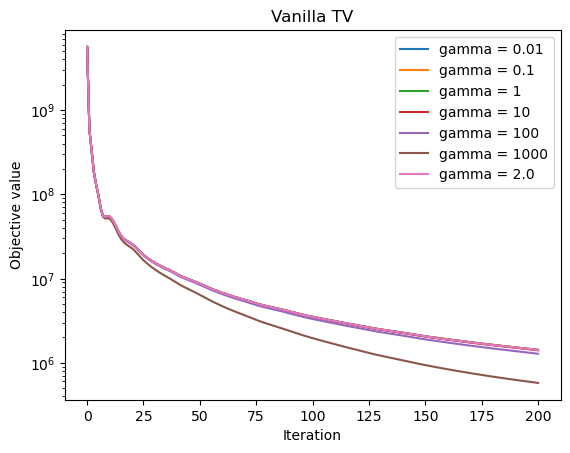

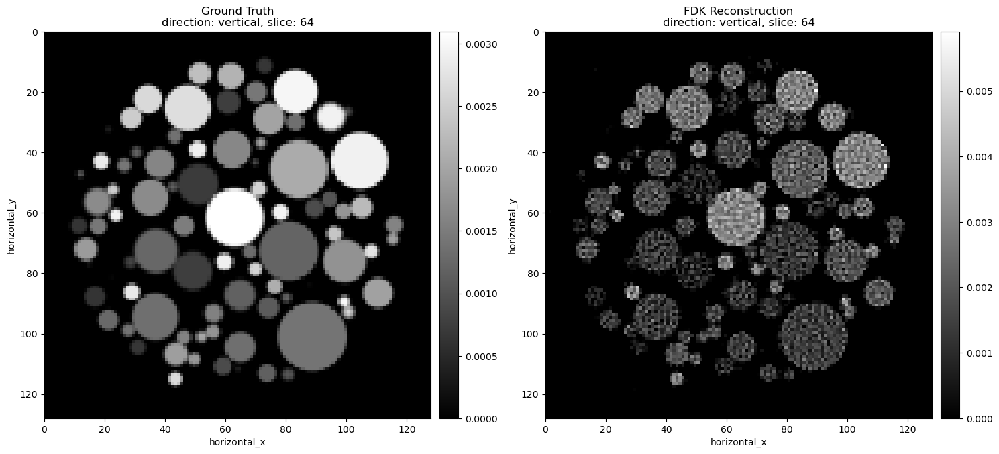

1418277.7752290359
0.0


In [17]:

    
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.legend()
plt.title('Vanilla TV')
plt.show()

show2D([ground_truth, pdhg_tv_explicit.solution], title = ['Ground Truth', 'FDK Reconstruction'], origin = 'upper', num_cols = 2);

print( F(K.direct(pdhg_tv_explicit.solution)) )
print( G(pdhg_tv_explicit.solution) )


In [18]:
#   Vanilla TV with reg parameter in front of gradient operator

alpha = 0.5
G = IndicatorBox(lower=0)
rho = 1.0
f1 =  MixedL21Norm()
f2 = 0.5 * L2NormSquared(b=absorption)
F = BlockFunction(f1, f2)

# Define BlockOperator K
Grad = alpha * GradientOperator(ig)
K = BlockOperator(Grad, A)



gamma_list = [0.01, 0.1, 1, 10, 100, 1000, 1/alpha]
results_vanilla = []
objective_vanilla = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/K.norm()
    tau =(rho/gamma)/K.norm() 
    pdhg_tv_explicit = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau)
    pdhg_tv_explicit.run(200, verbose=1)
    results_vanilla.append(pdhg_tv_explicit.solution)
    objective_vanilla.append(pdhg_tv_explicit.objective)
    


gamma =  0.01
Initial step sizes: tau = 0.0007297007443087836, sigma = 7.297007443087836e-08


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.7239248
x norm =  0.7239248
x_tmp norm =  0.7814491
x norm =  0.19123183
x_tmp norm =  0.8811971
x norm =  0.2028865
x_tmp norm =  0.99571663
x norm =  0.17862894
x_tmp norm =  1.0842422
x norm =  0.1573961
x_tmp norm =  1.1522797
x norm =  0.14954495
x_tmp norm =  1.2179871
x norm =  0.13658401
x_tmp norm =  1.2785538
x norm =  0.1194508
x_tmp norm =  1.326795
x norm =  0.10216366
x_tmp norm =  1.3603483
x norm =  0.08801609
x_tmp norm =  1.3810643
x norm =  0.078191854
x_tmp norm =  1.3923886
x norm =  0.07209464
x_tmp norm =  1.3977008
x norm =  0.06830281
x_tmp norm =  1.3995805
x norm =  0.06549947
x_tmp norm =  1.3995818
x norm =  0.06295885
x_tmp norm =  1.3985049
x norm =  0.060264267
x_tmp norm =  1.3967271
x norm =  0.057426214
x_tmp norm =  1.3944861
x norm =  0.054661077
x_tmp norm =  1.3920313
x norm =  0.05222395
x_tmp norm =  1.3896519
x norm =  0.050307315
x_tmp norm =  1.3876207
x norm =  0.048901953
x_tmp norm =  1.3861243
x norm =  0.047900386
x_tmp n

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.7239244
x norm =  0.7239244
x_tmp norm =  0.78144896
x norm =  0.19123168
x_tmp norm =  0.8811969
x norm =  0.20288633
x_tmp norm =  0.9957162
x norm =  0.17862877
x_tmp norm =  1.0842416
x norm =  0.15739587
x_tmp norm =  1.1522791
x norm =  0.14954472
x_tmp norm =  1.2179863
x norm =  0.13658379
x_tmp norm =  1.2785529
x norm =  0.119450614
x_tmp norm =  1.3267939
x norm =  0.102163486
x_tmp norm =  1.3603473
x norm =  0.08801593
x_tmp norm =  1.3810633
x norm =  0.07819169
x_tmp norm =  1.3923875
x norm =  0.072094455
x_tmp norm =  1.3976998
x norm =  0.0683026
x_tmp norm =  1.3995795
x norm =  0.065499246
x_tmp norm =  1.3995808
x norm =  0.06295861
x_tmp norm =  1.3985038
x norm =  0.060264014
x_tmp norm =  1.3967261
x norm =  0.05742596
x_tmp norm =  1.394485
x norm =  0.054660816
x_tmp norm =  1.3920302
x norm =  0.052223682
x_tmp norm =  1.3896507
x norm =  0.05030704
x_tmp norm =  1.3876195
x norm =  0.048901673
x_tmp norm =  1.3861231
x norm =  0.04790009
x_tm

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.72391963
x norm =  0.72391963
x_tmp norm =  0.78144795
x norm =  0.19123003
x_tmp norm =  0.8811942
x norm =  0.20288432
x_tmp norm =  0.9957117
x norm =  0.17862701
x_tmp norm =  1.0842364
x norm =  0.15739371
x_tmp norm =  1.1522726
x norm =  0.14954223
x_tmp norm =  1.2179781
x norm =  0.13658158
x_tmp norm =  1.2785432
x norm =  0.11944876
x_tmp norm =  1.3267835
x norm =  0.10216186
x_tmp norm =  1.3603364
x norm =  0.08801429
x_tmp norm =  1.3810526
x norm =  0.078189954
x_tmp norm =  1.3923769
x norm =  0.072092526
x_tmp norm =  1.3976893
x norm =  0.06830051
x_tmp norm =  1.3995689
x norm =  0.06549699
x_tmp norm =  1.3995702
x norm =  0.0629562
x_tmp norm =  1.3984929
x norm =  0.060261514
x_tmp norm =  1.396715
x norm =  0.057423398
x_tmp norm =  1.3944737
x norm =  0.05465819
x_tmp norm =  1.3920187
x norm =  0.05222098
x_tmp norm =  1.3896391
x norm =  0.05030427
x_tmp norm =  1.3876075
x norm =  0.048898816
x_tmp norm =  1.3861108
x norm =  0.047897138
x_tm

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.72387195
x norm =  0.72387195
x_tmp norm =  0.7814376
x norm =  0.19121355
x_tmp norm =  0.88116735
x norm =  0.20286423
x_tmp norm =  0.9956666
x norm =  0.17860949
x_tmp norm =  1.0841835
x norm =  0.15737191
x_tmp norm =  1.1522064
x norm =  0.1495172
x_tmp norm =  1.2178948
x norm =  0.13655959
x_tmp norm =  1.2784464
x norm =  0.119430035
x_tmp norm =  1.3266793
x norm =  0.10214546
x_tmp norm =  1.3602298
x norm =  0.08799807
x_tmp norm =  1.3809457
x norm =  0.07817268
x_tmp norm =  1.392271
x norm =  0.072073296
x_tmp norm =  1.3975843
x norm =  0.068279505
x_tmp norm =  1.3994634
x norm =  0.0654744
x_tmp norm =  1.3994638
x norm =  0.06293208
x_tmp norm =  1.3983846
x norm =  0.06023645
x_tmp norm =  1.3966047
x norm =  0.05739773
x_tmp norm =  1.3943603
x norm =  0.05463183
x_tmp norm =  1.3919035
x norm =  0.05219396
x_tmp norm =  1.3895217
x norm =  0.050276566
x_tmp norm =  1.3874875
x norm =  0.048870288
x_tmp norm =  1.3859879
x norm =  0.047867667
x_tmp

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.7233969
x norm =  0.7233969
x_tmp norm =  0.78133374
x norm =  0.1910501
x_tmp norm =  0.88089883
x norm =  0.20266348
x_tmp norm =  0.9952149
x norm =  0.17843518
x_tmp norm =  1.0836511
x norm =  0.15715441
x_tmp norm =  1.1515458
x norm =  0.14926758
x_tmp norm =  1.2170641
x norm =  0.13633971
x_tmp norm =  1.2774832
x norm =  0.11924343
x_tmp norm =  1.3256413
x norm =  0.10198168
x_tmp norm =  1.3591635
x norm =  0.08783625
x_tmp norm =  1.3798779
x norm =  0.078000635
x_tmp norm =  1.3912139
x norm =  0.07188148
x_tmp norm =  1.3965353
x norm =  0.0680699
x_tmp norm =  1.3984138
x norm =  0.06524888
x_tmp norm =  1.3984038
x norm =  0.06269167
x_tmp norm =  1.3973067
x norm =  0.05998646
x_tmp norm =  1.3955041
x norm =  0.057141982
x_tmp norm =  1.3932381
x norm =  0.054368846
x_tmp norm =  1.3907595
x norm =  0.05192507
x_tmp norm =  1.3883553
x norm =  0.050000817
x_tmp norm =  1.3862964
x norm =  0.04858629
x_tmp norm =  1.3847668
x norm =  0.047574315
x_tmp 

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.71868086
x norm =  0.71868086
x_tmp norm =  0.7802772
x norm =  0.18949102
x_tmp norm =  0.8782466
x norm =  0.20067053
x_tmp norm =  0.99074996
x norm =  0.17671326
x_tmp norm =  1.0783925
x norm =  0.15501906
x_tmp norm =  1.1450471
x norm =  0.146801
x_tmp norm =  1.2089013
x norm =  0.13416643
x_tmp norm =  1.2680104
x norm =  0.11740118
x_tmp norm =  1.3154383
x norm =  0.10036841
x_tmp norm =  1.3486931
x norm =  0.08625004
x_tmp norm =  1.3694167
x norm =  0.07633053
x_tmp norm =  1.3808889
x norm =  0.07001193
x_tmp norm =  1.3863283
x norm =  0.06603689
x_tmp norm =  1.3882457
x norm =  0.063065015
x_tmp norm =  1.3881844
x norm =  0.060364287
x_tmp norm =  1.3869617
x norm =  0.057577893
x_tmp norm =  1.3850036
x norm =  0.054667585
x_tmp norm =  1.3825755
x norm =  0.05183087
x_tmp norm =  1.3799382
x norm =  0.049334526
x_tmp norm =  1.3773719
x norm =  0.047340453
x_tmp norm =  1.3751248
x norm =  0.045847487
x_tmp norm =  1.373364
x norm =  0.044760097
x_t

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.7239143
x norm =  0.7239143
x_tmp norm =  0.78144675
x norm =  0.19122823
x_tmp norm =  0.88119113
x norm =  0.20288207
x_tmp norm =  0.9957066
x norm =  0.17862506
x_tmp norm =  1.0842304
x norm =  0.15739128
x_tmp norm =  1.1522652
x norm =  0.14953944
x_tmp norm =  1.2179688
x norm =  0.13657913
x_tmp norm =  1.2785325
x norm =  0.11944667
x_tmp norm =  1.326772
x norm =  0.10216003
x_tmp norm =  1.3603246
x norm =  0.08801249
x_tmp norm =  1.3810407
x norm =  0.07818804
x_tmp norm =  1.3923651
x norm =  0.07209039
x_tmp norm =  1.3976775
x norm =  0.06829816
x_tmp norm =  1.3995571
x norm =  0.06549448
x_tmp norm =  1.3995583
x norm =  0.06295352
x_tmp norm =  1.3984808
x norm =  0.06025872
x_tmp norm =  1.3967028
x norm =  0.057420544
x_tmp norm =  1.3944612
x norm =  0.054655254
x_tmp norm =  1.3920058
x norm =  0.05221798
x_tmp norm =  1.389626
x norm =  0.050301194
x_tmp norm =  1.387594
x norm =  0.04889564
x_tmp norm =  1.386097
x norm =  0.04789386
x_tmp norm

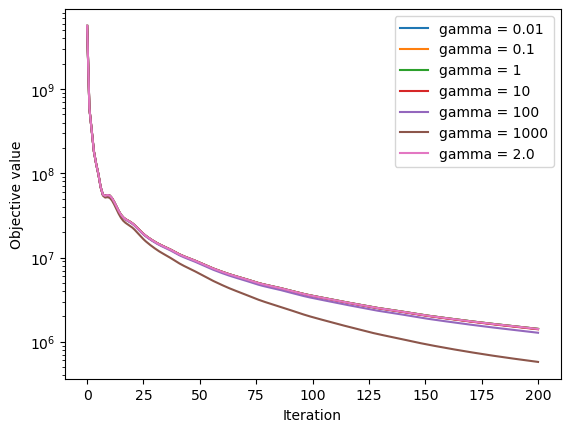

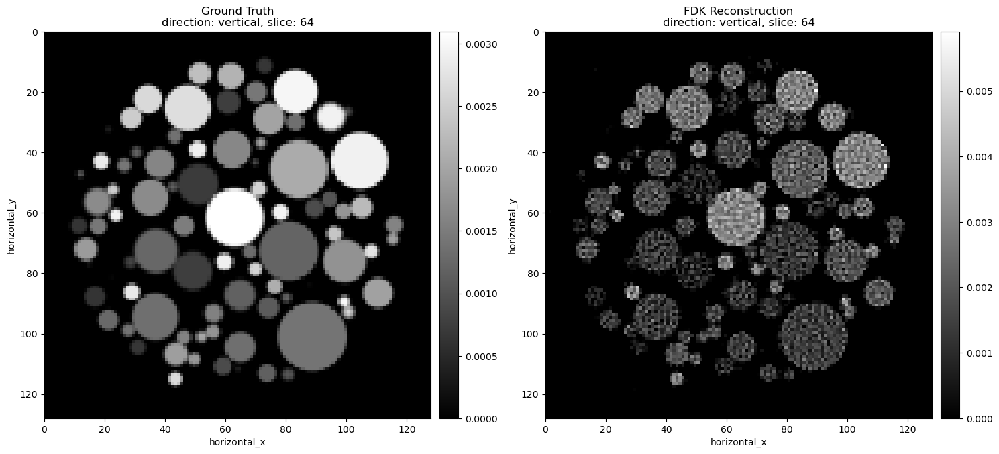

1418278.0252290696
0.0


In [19]:

for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.legend()
plt.show()

show2D([ground_truth, pdhg_tv_explicit.solution], title = ['Ground Truth', 'FDK Reconstruction'], origin = 'upper', num_cols = 2);

print( F(K.direct(pdhg_tv_explicit.solution)) )
print( G(pdhg_tv_explicit.solution) )


In [20]:
alpha = 0.5
G = IndicatorBox(lower=0)
rho = 1.0
f1 =  MixedL21Norm()
f2 = 0.5 * L2NormSquared(b=absorption)
F = BlockFunction(f1, f2)

# Define BlockOperator K
Grad = alpha * GradientOperator(ig)
K = BlockOperator(Grad, A)


gamma_list =  [ 100, 1000,  1/A.norm(), 0.01, 0.1, 1, 10]
results_adaptive = []
objective_adaptive = []
sigma_values = []
tau_values = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/A.norm()
    tau =(rho/gamma)/A.norm() 
    pdhg_tv_explicit = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau, adaptive=True)#, eta=.95, initial=[recon, None]) 
    callback=SaveStepSizes()
    pdhg_tv_explicit.run(200, verbose=1, callbacks=[ProgressCallback(), callback])
    results_adaptive.append(pdhg_tv_explicit.solution)
    objective_adaptive.append(pdhg_tv_explicit.objective)
    sigma_values.append(callback.sigma)
    tau_values.append(callback.tau)
    

gamma =  100
Initial step sizes: tau = 7.297007443090112e-08, sigma = 0.0007297007443090111


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.7233969
x norm =  0.7233969
self.x, self.x_old =  0.7233969 0.0
cross_term =  0.0007637115077178417 x_change_norm =  0.7233969 y_change_norm =  77.3665
1.0365807366153257
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0365807366153257
tau = 5.279623080964622e-08, sigma = 0.0005279623080964622
x_tmp norm =  0.3787735
x norm =  0.3787735
self.x, self.x_old =  0.3787735 0.0
cross_term =  0.00015149384835720647 x_change_norm =  0.3787735 y_change_norm =  55.988472
0.6977343981371164
After possible reduction 5.279623080964622e-08 0.0005279623080964622
2*self.p_norm < self.d_norm
After adaptive 2.6398115404823133e-09 0.010559246161929233 0.9025
x_tmp norm =  0.39277357
x norm =  0.05216168
self.x, self.x_old =  0.3927734 0.3787735
cross_term =  5.320750798810249e-05 x_change_norm =  0.05216168 y_change_norm =  358.7904
0.16040901500136567
After possible reduction 2.6398115404823133e-09 0.010559246161929233
2*self.p_norm < self.d_norm
After adaptive 2.5738162519702563e-1

x_tmp norm =  1.2683505
x norm =  0.00091638364
self.x, self.x_old =  1.2683498 1.2681518
cross_term =  1.8380516557060194e-09 x_change_norm =  0.00091638364 y_change_norm =  5.513812
0.01593696623161339
After possible reduction 1.9134975550350053e-10 0.14567261820485808
No change
After adaptive 1.9134975550350053e-10 0.14567261820485808 0.10467395472325498
x_tmp norm =  1.268546
x norm =  0.0009082033
self.x, self.x_old =  1.2685453 1.2683498
cross_term =  1.8306475128770747e-09 x_change_norm =  0.0009082033 y_change_norm =  5.56317
0.01613333039894556
After possible reduction 1.9134975550350053e-10 0.14567261820485808
No change
After adaptive 1.9134975550350053e-10 0.14567261820485808 0.10467395472325498
x_tmp norm =  1.2687399
x norm =  0.00090006326
self.x, self.x_old =  1.2687392 1.2685453
cross_term =  1.8177906408178818e-09 x_change_norm =  0.00090006326 y_change_norm =  5.5963
0.01628789366955609
After possible reduction 1.9134975550350053e-10 0.14567261820485808
No change
Afte

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.71868086
x norm =  0.71868086
self.x, self.x_old =  0.71868086 0.0
cross_term =  0.007537852013951178 x_change_norm =  0.71868086 y_change_norm =  768.62103
1.036579626908799
Multiplying step sizes by beta/b, beta = 0.75, b = 1.036579626908799
tau = 5.279628733045793e-09, sigma = 0.005279628733045794
x_tmp norm =  0.37698388
x norm =  0.37698388
self.x, self.x_old =  0.37698388 0.0
cross_term =  0.001500659066867408 x_change_norm =  0.37698388 y_change_norm =  557.239
0.6977353568896099
After possible reduction 5.279628733045793e-09 0.005279628733045794
2*self.p_norm < self.d_norm
After adaptive 2.639814366522899e-10 0.10559257466091579 0.9025
x_tmp norm =  0.39107612
x norm =  0.04781278
self.x, self.x_old =  0.39107597 0.37698388
cross_term =  0.00043780555153297103 x_change_norm =  0.04781278 y_change_norm =  3264.0024
0.1592949311462473
After possible reduction 2.639814366522899e-10 0.10559257466091579
2*self.p_norm < self.d_norm
After adaptive 2.5738190073598274e-1

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.72392493
x norm =  0.72392493
self.x, self.x_old =  0.72392493 0.0
cross_term =  5.580940753932826e-11 x_change_norm =  0.72392493 y_change_norm =  5.6495583e-06
1.0365799170005179
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0365799170005179
tau = 0.7235332150464818, sigma = 3.852547938024967e-11
x_tmp norm =  0.3789741
x norm =  0.3789741
self.x, self.x_old =  0.3789741 0.0
cross_term =  1.106623404529045e-11 x_change_norm =  0.3789741 y_change_norm =  4.087644e-06
0.6977347772267456
After possible reduction 0.7235332150464818 3.852547938024967e-11
2*self.p_norm < self.d_norm
After adaptive 0.036176660752324126 7.705095876049927e-10 0.9025
x_tmp norm =  0.39296493
x norm =  0.05269937
self.x, self.x_old =  0.39296475 0.3789741
cross_term =  3.97173516155545e-12 x_change_norm =  0.05269937 y_change_norm =  2.6471414e-05
0.16053160076390738
After possible reduction 0.036176660752324126 7.705095876049927e-10
2*self.p_norm < self.d_norm
After adaptive 0.0035272244

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.7239248
x norm =  0.7239248
self.x, self.x_old =  0.7239248 0.0
cross_term =  7.648261544833612e-08 x_change_norm =  0.7239248 y_change_norm =  0.0077422946
1.0365803627157752
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0365803627157752
tau = 0.0005279624985350204, sigma = 5.2796249853502044e-08
x_tmp norm =  0.3789738
x norm =  0.3789738
self.x, self.x_old =  0.3789738 0.0
cross_term =  1.5165408582393697e-08 x_change_norm =  0.3789738 y_change_norm =  0.005601805
0.6977344868735997
After possible reduction 0.0005279624985350204 5.2796249853502044e-08
2*self.p_norm < self.d_norm
After adaptive 2.6398124926751046e-05 1.05592499707004e-06 0.9025
x_tmp norm =  0.3929649
x norm =  0.05269929
self.x, self.x_old =  0.3929647 0.3789738
cross_term =  5.442931854623993e-09 x_change_norm =  0.05269929 y_change_norm =  0.03627701
0.16053133473569117
After possible reduction 2.6398124926751046e-05 1.05592499707004e-06
2*self.p_norm < self.d_norm
After adaptive 2.573817180

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.7239244
x norm =  0.7239244
self.x, self.x_old =  0.7239244 0.0
cross_term =  7.648250105195059e-07 x_change_norm =  0.7239244 y_change_norm =  0.0774229
1.0365799949961905
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0365799949961905
tau = 5.279626858260656e-05, sigma = 5.279626858260656e-07
x_tmp norm =  0.37897387
x norm =  0.37897387
self.x, self.x_old =  0.37897387 0.0
cross_term =  1.5165423765480457e-07 x_change_norm =  0.37897387 y_change_norm =  0.056018047
0.6977349485726467
After possible reduction 5.279626858260656e-05 5.279626858260656e-07
2*self.p_norm < self.d_norm
After adaptive 2.6398134291303304e-06 1.0559253716521303e-05 0.9025
x_tmp norm =  0.39296472
x norm =  0.052698817
self.x, self.x_old =  0.39296454 0.37897387
cross_term =  5.442835338311134e-08 x_change_norm =  0.052698817 y_change_norm =  0.3627668
0.16053135536958024
After possible reduction 2.6398134291303304e-06 1.0559253716521303e-05
2*self.p_norm < self.d_norm
After adaptive 2.57

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.72391963
x norm =  0.72391963
self.x, self.x_old =  0.72391963 0.0
cross_term =  7.648151308316654e-06 x_change_norm =  0.72391963 y_change_norm =  0.774224
1.036580170227451
Multiplying step sizes by beta/b, beta = 0.75, b = 1.036580170227451
tau = 5.279625965753065e-06, sigma = 5.279625965753065e-06
x_tmp norm =  0.37897196
x norm =  0.37897196
self.x, self.x_old =  0.37897196 0.0
cross_term =  1.5165265655304545e-06 x_change_norm =  0.37897196 y_change_norm =  0.5601778
0.6977345555961043
After possible reduction 5.279625965753065e-06 5.279625965753065e-06
2*self.p_norm < self.d_norm
After adaptive 2.639812982876535e-07 0.00010559251931506121 0.9025
x_tmp norm =  0.39296302
x norm =  0.052693926
self.x, self.x_old =  0.3929628 0.37897196
cross_term =  5.44170790385688e-07 x_change_norm =  0.052693926 y_change_norm =  3.6273043
0.16053013154560897
After possible reduction 2.639812982876535e-07 0.00010559251931506121
2*self.p_norm < self.d_norm
After adaptive 2.5738176

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.72387195
x norm =  0.72387195
self.x, self.x_old =  0.72387195 0.0
cross_term =  7.647146949650463e-05 x_change_norm =  0.72387195 y_change_norm =  7.741732
1.0365802753381013
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0365802753381013
tau = 5.27962543039181e-07, sigma = 5.27962543039181e-05
x_tmp norm =  0.37895387
x norm =  0.37895387
self.x, self.x_old =  0.37895387 0.0
cross_term =  1.5163812890854835e-05 x_change_norm =  0.37895387 y_change_norm =  5.6015115
0.6977342522798742
After possible reduction 5.27962543039181e-07 5.27962543039181e-05
2*self.p_norm < self.d_norm
After adaptive 2.6398127151959074e-08 0.0010559250860783611 0.9025
x_tmp norm =  0.3929459
x norm =  0.052645054
self.x, self.x_old =  0.39294568 0.37895387
cross_term =  5.430551142623996e-06 x_change_norm =  0.052645054 y_change_norm =  36.23688
0.16051918469884818
After possible reduction 2.6398127151959074e-08 0.0010559250860783611
2*self.p_norm < self.d_norm
After adaptive 2.573817397

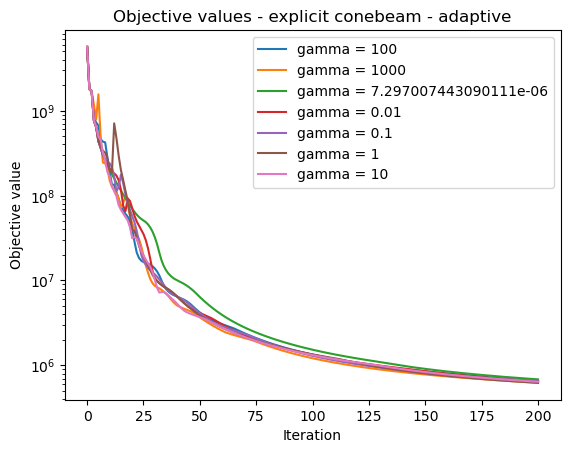

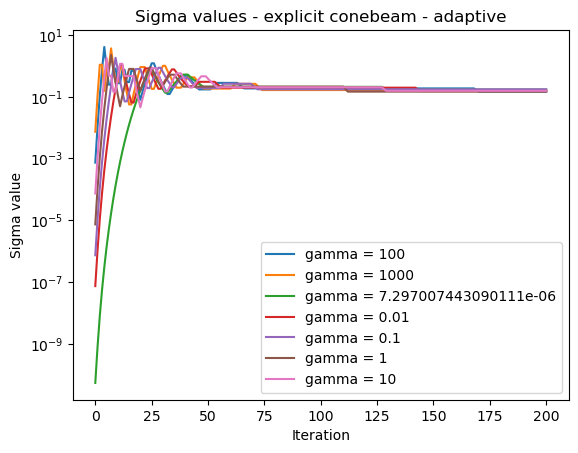

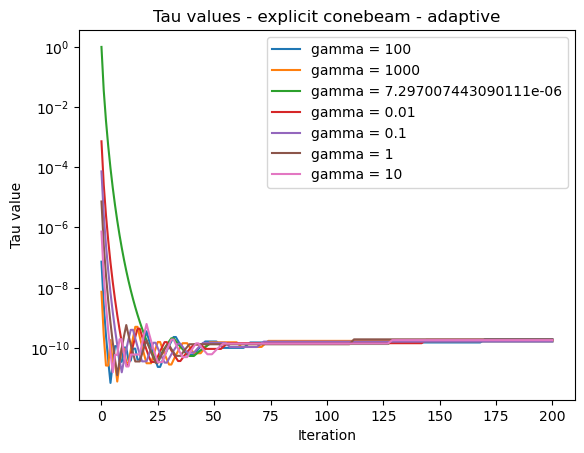

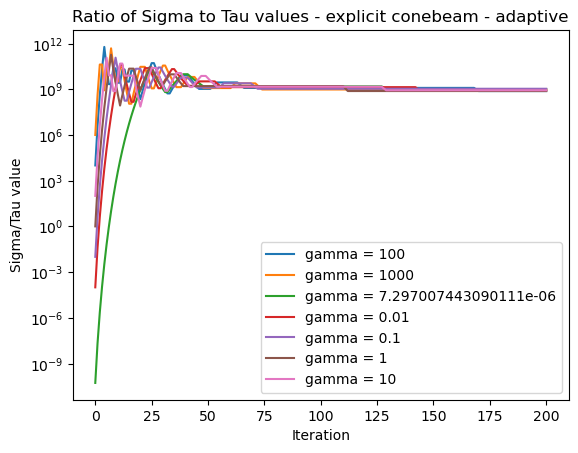

In [21]:
plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective values - explicit conebeam - adaptive')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), sigma_values[i], label='gamma = ' + str(gamma))
plt.title('Sigma values - explicit conebeam - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Sigma value')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), tau_values[i], label='gamma = ' + str(gamma))
plt.title('Tau values - explicit conebeam - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Tau value')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    #plt the ratio of sigma to tau
    plt.plot(range(0, 201, 1), np.array(sigma_values[i])/np.array(tau_values[i]), label='gamma = ' + str(gamma))
plt.title('Ratio of Sigma to Tau values - explicit conebeam - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Sigma/Tau value')
plt.yscale('log')
plt.legend()
plt.show()

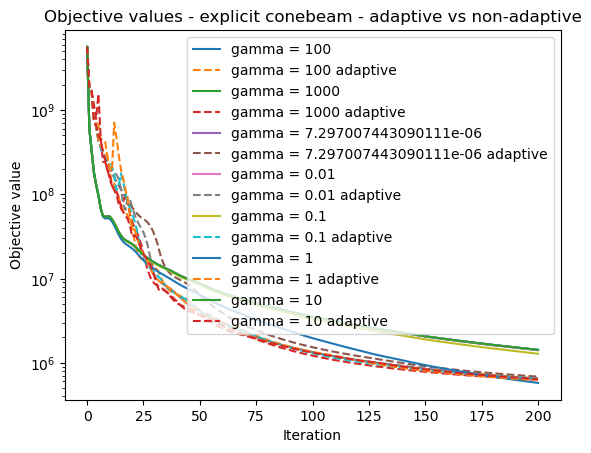

In [22]:
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma)+' adaptive', linestyle='dashed')
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective values - explicit conebeam - adaptive vs non-adaptive')
plt.legend()
plt.show()

# Single slice experiments 

New geometry:  2D Cone-beam tomography
System configuration:
	Source position: [     0., -20000.]
	Rotation axis position: [0., 0.]
	Detector position: [    0., 60000.]
	Detector direction x: [1., 0.]
Panel configuration:
	Number of pixels: [128   1]
	Pixel size: [64. 64.]
	Pixel origin: bottom-left
Channel configuration:
	Number of channels: 1
Acquisition description:
	Number of positions: 60
	Angles 0-9 in degrees: [ 0.,  6., 12., 18., 24., 30., 36., 42., 48., 54.]
	Angles 50-59 in degrees: [300., 306., 312., 318., 324., 330., 336., 342., 348., 354.]
	Full angular array can be accessed with acquisition_data.geometry.angles
Distances in units: units distance
Shape out:  (60, 128)
New geometry shape:  (60, 128)
FDK recon

Input Data:
	angle: 60
	horizontal: 128

Reconstruction Volume:
	horizontal_y: 128
	horizontal_x: 128

Reconstruction Options:
	Backend: tigre
	Filter: ram-lak
	Filter cut-off frequency: 1.0
	FFT order: 8
	Filter_inplace: False



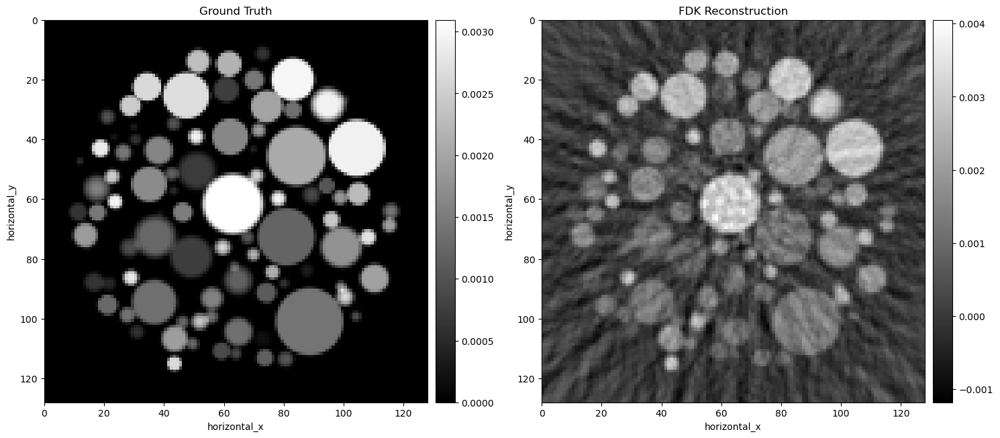

gamma =  100
Initial step sizes: tau = 7.284922274005562e-06, sigma = 0.07284922274005562


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.07439052
x norm =  0.074380614
self.x, self.x_old =  0.074380614 0.0
cross_term =  0.0008052316978200315 x_change_norm =  0.074380614 y_change_norm =  7.9193254
1.0404530702139896
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0404530702139896
tau = 5.2512620337411825e-06, sigma = 0.05251262033741182
x_tmp norm =  0.03940093
x norm =  0.039393846
self.x, self.x_old =  0.039393846 0.0
cross_term =  0.0001628232414902213 x_change_norm =  0.039393846 y_change_norm =  5.818866
0.6977135262000292
After possible reduction 5.2512620337411825e-06 0.05251262033741182
2*self.p_norm < self.d_norm
After adaptive 2.6256310168705936e-07 1.0502524067482355 0.9025
x_tmp norm =  0.041148864
x norm =  0.0030544037
self.x, self.x_old =  0.041148424 0.039393846
cross_term =  1.2649356290892726e-05 x_change_norm =  0.0030544037 y_change_norm =  17.789722
0.15130194724546994
After possible reduction 2.6256310168705936e-07 1.0502524067482355
No change
After adaptive 2.6256310168705936e-

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.04617308
x norm =  0.046172068
self.x, self.x_old =  0.046172068 0.0
cross_term =  0.003102508705546503 x_change_norm =  0.046172068 y_change_norm =  49.15406
1.040463597837116
Multiplying step sizes by beta/b, beta = 0.75, b = 1.040463597837116
tau = 5.251208900399714e-07, sigma = 0.5251208900399713
x_tmp norm =  0.027190724
x norm =  0.027189992
self.x, self.x_old =  0.027189992 0.0
cross_term =  0.0007755488562451283 x_change_norm =  0.027189992 y_change_norm =  40.156605
0.6977470318803974
After possible reduction 5.251208900399714e-07 0.5251208900399713
No change
After adaptive 5.251208900399714e-07 0.5251208900399713 0.95
x_tmp norm =  0.054159965
x norm =  0.027021302
self.x, self.x_old =  0.054159097 0.027189992
cross_term =  1.7844168199271353e-06 x_change_norm =  0.027021302 y_change_norm =  8.245805
0.004730567252198371
After possible reduction 5.251208900399714e-07 0.5251208900399713
No change
After adaptive 5.251208900399714e-07 0.5251208900399713 0.95
x_tm

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.07980977
x norm =  0.077406816
self.x, self.x_old =  0.077406816 0.0
cross_term =  6.474277842400586e-09 x_change_norm =  0.077406816 y_change_norm =  6.1894425e-05
1.0260827307724987
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0260827307724987
tau = 0.7309352136112393, sigma = 3.8790799425852273e-07
x_tmp norm =  0.042639676
x norm =  0.04135586
self.x, self.x_old =  0.04135586 0.0
cross_term =  1.3507839784194763e-09 x_change_norm =  0.04135586 y_change_norm =  4.524082e-05
0.6950182092886431
After possible reduction 0.7309352136112393 3.8790799425852273e-07
2*self.p_norm < self.d_norm
After adaptive 0.03654676068056199 7.758159885170447e-06 0.9025
x_tmp norm =  0.042421732
x norm =  0.002434269
self.x, self.x_old =  0.04108874 0.04135586
cross_term =  1.4255576089251757e-10 x_change_norm =  0.002434269 y_change_norm =  0.0003278682
0.03985127997049211
After possible reduction 0.03654676068056199 7.758159885170447e-06
2*self.p_norm < self.d_norm
After adaptiv

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079809226
x norm =  0.0774063
self.x, self.x_old =  0.0774063 0.0
cross_term =  8.88711108102394e-08 x_change_norm =  0.0774063 y_change_norm =  0.000849618
1.0260827138059232
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0260827138059232
tau = 0.053248063065387465, sigma = 5.324806306538747e-06
x_tmp norm =  0.042639468
x norm =  0.04135566
self.x, self.x_old =  0.04135566 0.0
cross_term =  1.8542009896159896e-08 x_change_norm =  0.04135566 y_change_norm =  0.00062101695
0.695018243276279
After possible reduction 0.053248063065387465 5.324806306538747e-06
2*self.p_norm < self.d_norm
After adaptive 0.0026624031532693757 0.00010649612613077484 0.9025
x_tmp norm =  0.042421572
x norm =  0.002463646
self.x, self.x_old =  0.041091807 0.04135566
cross_term =  2.0024885160265103e-09 x_change_norm =  0.002463646 y_change_norm =  0.004500175
0.04077739016937225
After possible reduction 0.0026624031532693757 0.00010649612613077484
2*self.p_norm < self.d_norm
After adaptiv

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079803996
x norm =  0.07740122
self.x, self.x_old =  0.07740122 0.0
cross_term =  8.885945432974805e-07 x_change_norm =  0.07740122 y_change_norm =  0.008495623
1.0260827041835978
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0260827041835978
tau = 0.005324806356473336, sigma = 5.324806356473337e-05
x_tmp norm =  0.042637426
x norm =  0.04135368
self.x, self.x_old =  0.04135368 0.0
cross_term =  1.8540231514677073e-07 x_change_norm =  0.04135368 y_change_norm =  0.006209872
0.6950181069885893
After possible reduction 0.005324806356473336 5.324806356473337e-05
2*self.p_norm < self.d_norm
After adaptive 0.000266240317823667 0.0010649612712946663 0.9025
x_tmp norm =  0.042420033
x norm =  0.005976622
self.x, self.x_old =  0.042150874 0.04135368
cross_term =  8.086033865351046e-08 x_change_norm =  0.005976622 y_change_norm =  0.04495651
0.1559439175642036
After possible reduction 0.000266240317823667 0.0010649612712946663
2*self.p_norm < self.d_norm
After adaptive 2.

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079751715
x norm =  0.07902172
self.x, self.x_old =  0.07902172 0.0
cross_term =  9.16107329456445e-06 x_change_norm =  0.07902172 y_change_norm =  0.08490057
1.0386629471842195
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0386629471842195
tau = 0.0005260312520357116, sigma = 0.0005260312520357116
x_tmp norm =  0.04159117
x norm =  0.0410868
self.x, self.x_old =  0.0410868 0.0
cross_term =  1.7926290125261335e-06 x_change_norm =  0.0410868 y_change_norm =  0.061317593
0.6950266686429787
After possible reduction 0.0005260312520357116 0.0005260312520357116
2*self.p_norm < self.d_norm
After adaptive 2.63015626017856e-05 0.010520625040714222 0.9025
x_tmp norm =  0.042916644
x norm =  0.005830366
self.x, self.x_old =  0.04287736 0.0410868
cross_term =  6.578907451608163e-07 x_change_norm =  0.005830366 y_change_norm =  0.39820492
0.16143076012869484
After possible reduction 2.63015626017856e-05 0.010520625040714222
2*self.p_norm < self.d_norm
After adaptive 2.5644023

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.07923261
x norm =  0.07914304
self.x, self.x_old =  0.07914304 0.0
cross_term =  9.124895324376446e-05 x_change_norm =  0.07914304 y_change_norm =  0.84347945
1.0403102639289104
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0403102639289104
tau = 5.251982889094646e-05, sigma = 0.005251982889094646
x_tmp norm =  0.041264646
x norm =  0.04120153
self.x, self.x_old =  0.04120153 0.0
cross_term =  1.7835517374477242e-05 x_change_norm =  0.04120153 y_change_norm =  0.60932684
0.6974192095580023
After possible reduction 5.251982889094646e-05 0.005251982889094646
2*self.p_norm < self.d_norm
After adaptive 2.6259914445473254e-06 0.10503965778189282 0.9025
x_tmp norm =  0.04297842
x norm =  0.005191525
self.x, self.x_old =  0.04297366 0.04120153
cross_term =  5.017691457136165e-06 x_change_norm =  0.005191525 y_change_norm =  3.477134
0.16122432730956196
After possible reduction 2.6259914445473254e-06 0.10503965778189282
2*self.p_norm < self.d_norm
After adaptive 2.560341

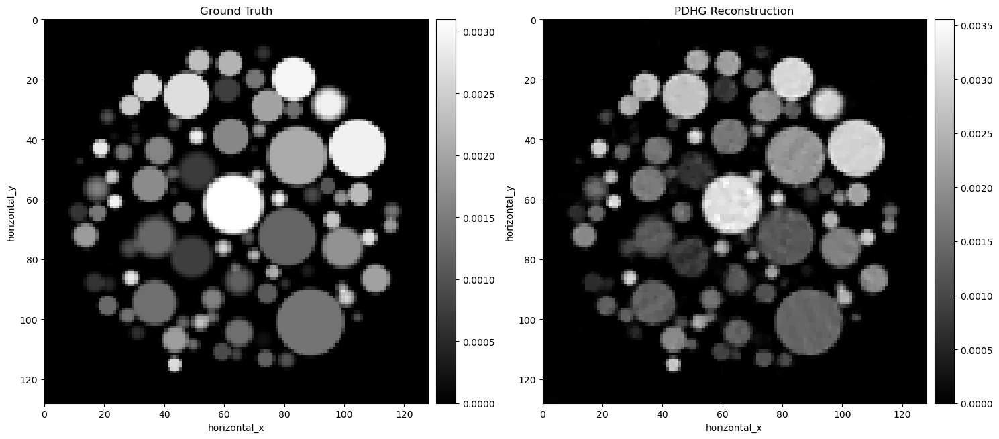

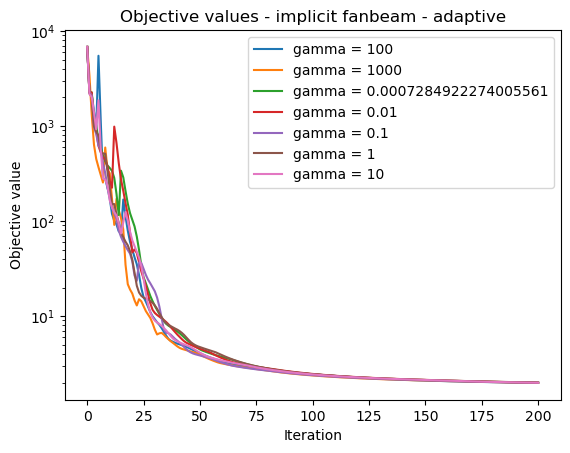

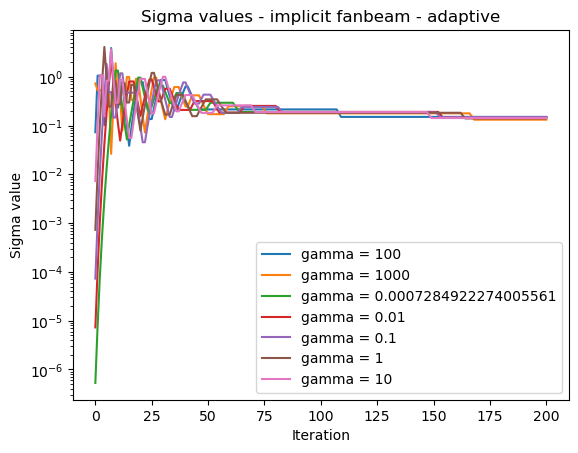

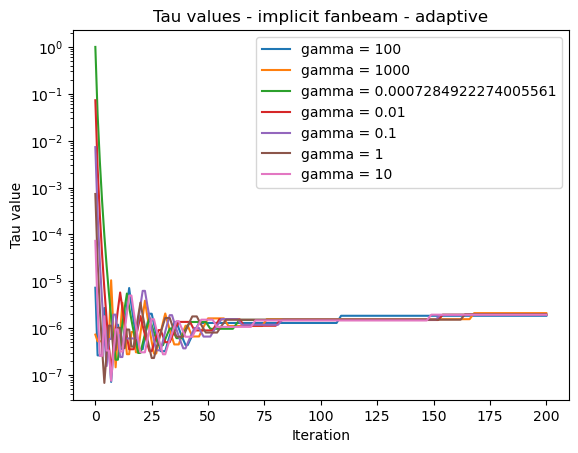

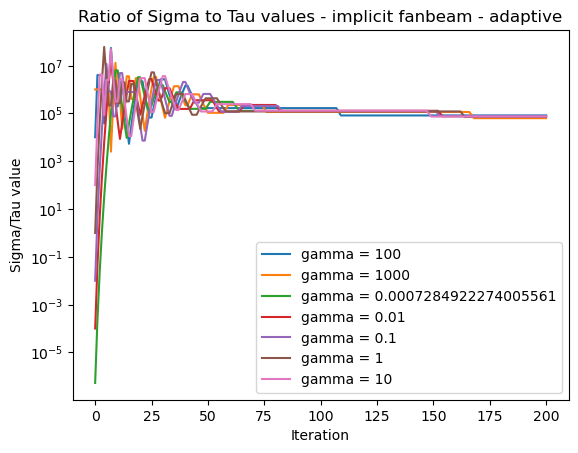

gamma =  0.01
Initial step sizes: tau = 0.07284922274005562, sigma = 7.284922274005562e-06


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079809226
x norm =  0.0774063
x_tmp norm =  0.0854796
x norm =  0.010625762
x_tmp norm =  0.09169788
x norm =  0.009451337
x_tmp norm =  0.098432355
x norm =  0.0070842844
x_tmp norm =  0.104422376
x norm =  0.0054321177
x_tmp norm =  0.10945388
x norm =  0.004483907
x_tmp norm =  0.113906674
x norm =  0.0034797362
x_tmp norm =  0.11810509
x norm =  0.0023898522
x_tmp norm =  0.12222591
x norm =  0.0019816202
x_tmp norm =  0.12644656
x norm =  0.0019741892
x_tmp norm =  0.13076904
x norm =  0.0021813756
x_tmp norm =  0.13519078
x norm =  0.0020425322
x_tmp norm =  0.13964902
x norm =  0.0018769072
x_tmp norm =  0.14418049
x norm =  0.0017568254
x_tmp norm =  0.14884192
x norm =  0.0018613571
x_tmp norm =  0.15364592
x norm =  0.0017887476
x_tmp norm =  0.15855679
x norm =  0.0017091148
x_tmp norm =  0.16357848
x norm =  0.0017599908
x_tmp norm =  0.16872078
x norm =  0.0016906076
x_tmp norm =  0.1739586
x norm =  0.0021311878
x_tmp norm =  0.17928766
x norm =  0.0017844

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079803996
x norm =  0.07740122
x_tmp norm =  0.08547841
x norm =  0.010829389
x_tmp norm =  0.091798425
x norm =  0.012334412
x_tmp norm =  0.099710695
x norm =  0.013995721
x_tmp norm =  0.107883915
x norm =  0.014396264
x_tmp norm =  0.115580276
x norm =  0.013101012
x_tmp norm =  0.12215609
x norm =  0.010215372
x_tmp norm =  0.1264947
x norm =  0.008665108
x_tmp norm =  0.12946387
x norm =  0.008086476
x_tmp norm =  0.13215616
x norm =  0.008185199
x_tmp norm =  0.13534121
x norm =  0.008235324
x_tmp norm =  0.13896157
x norm =  0.008105056
x_tmp norm =  0.14268002
x norm =  0.007346738
x_tmp norm =  0.14622872
x norm =  0.0064047356
x_tmp norm =  0.1494054
x norm =  0.0055876835
x_tmp norm =  0.1520499
x norm =  0.004939488
x_tmp norm =  0.15410373
x norm =  0.0044961832
x_tmp norm =  0.15557161
x norm =  0.004290061
x_tmp norm =  0.15650317
x norm =  0.0041755363
x_tmp norm =  0.15699051
x norm =  0.004160913
x_tmp norm =  0.15715654
x norm =  0.004133593
x_tmp no

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079751715
x norm =  0.07902172
x_tmp norm =  0.08574148
x norm =  0.018669719
x_tmp norm =  0.09480083
x norm =  0.019572757
x_tmp norm =  0.10500219
x norm =  0.018200444
x_tmp norm =  0.11448207
x norm =  0.01559479
x_tmp norm =  0.12068582
x norm =  0.014209799
x_tmp norm =  0.12549233
x norm =  0.014069895
x_tmp norm =  0.1311213
x norm =  0.012847336
x_tmp norm =  0.13699327
x norm =  0.011084985
x_tmp norm =  0.14202635
x norm =  0.009330157
x_tmp norm =  0.14549433
x norm =  0.008345396
x_tmp norm =  0.14746977
x norm =  0.007851237
x_tmp norm =  0.14813052
x norm =  0.00792688
x_tmp norm =  0.14776164
x norm =  0.0081858095
x_tmp norm =  0.14687398
x norm =  0.008186781
x_tmp norm =  0.14582732
x norm =  0.00786216
x_tmp norm =  0.14483817
x norm =  0.0072042467
x_tmp norm =  0.14398707
x norm =  0.006458444
x_tmp norm =  0.14333072
x norm =  0.005748197
x_tmp norm =  0.14295174
x norm =  0.0051753544
x_tmp norm =  0.14286077
x norm =  0.0048537636
x_tmp norm = 

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.07923261
x norm =  0.07914304
x_tmp norm =  0.0857565
x norm =  0.020188408
x_tmp norm =  0.09572515
x norm =  0.020943746
x_tmp norm =  0.106987946
x norm =  0.019060856
x_tmp norm =  0.11665514
x norm =  0.016658522
x_tmp norm =  0.123658694
x norm =  0.01574893
x_tmp norm =  0.13015027
x norm =  0.014654644
x_tmp norm =  0.13669813
x norm =  0.012276148
x_tmp norm =  0.14173946
x norm =  0.010030842
x_tmp norm =  0.14487474
x norm =  0.008177434
x_tmp norm =  0.14631996
x norm =  0.0073157456
x_tmp norm =  0.14666195
x norm =  0.0070678676
x_tmp norm =  0.14638463
x norm =  0.0071239984
x_tmp norm =  0.14580762
x norm =  0.0071210535
x_tmp norm =  0.14510319
x norm =  0.006975455
x_tmp norm =  0.14437027
x norm =  0.006592131
x_tmp norm =  0.14368021
x norm =  0.0060322084
x_tmp norm =  0.14308031
x norm =  0.0054009953
x_tmp norm =  0.1426012
x norm =  0.004835954
x_tmp norm =  0.14226477
x norm =  0.0044393283
x_tmp norm =  0.14207862
x norm =  0.004239617
x_tmp no

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.07439052
x norm =  0.074380614
x_tmp norm =  0.08450415
x norm =  0.019510312
x_tmp norm =  0.09353572
x norm =  0.01927653
x_tmp norm =  0.10335033
x norm =  0.017342627
x_tmp norm =  0.111936785
x norm =  0.015060442
x_tmp norm =  0.1184407
x norm =  0.01354475
x_tmp norm =  0.12381716
x norm =  0.012404262
x_tmp norm =  0.12892106
x norm =  0.010541569
x_tmp norm =  0.13318773
x norm =  0.008604235
x_tmp norm =  0.13614982
x norm =  0.006963846
x_tmp norm =  0.13789646
x norm =  0.005908713
x_tmp norm =  0.13873217
x norm =  0.0053788316
x_tmp norm =  0.13898888
x norm =  0.005117286
x_tmp norm =  0.13888429
x norm =  0.0049254773
x_tmp norm =  0.13855448
x norm =  0.0047044572
x_tmp norm =  0.13811041
x norm =  0.0043965243
x_tmp norm =  0.13764036
x norm =  0.0040044147
x_tmp norm =  0.13720421
x norm =  0.0035805043
x_tmp norm =  0.13684098
x norm =  0.003178835
x_tmp norm =  0.13656609
x norm =  0.0028573796
x_tmp norm =  0.1363774
x norm =  0.0026366166
x_tmp no

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.04617308
x norm =  0.046172068
x_tmp norm =  0.06720932
x norm =  0.02178567
x_tmp norm =  0.07801323
x norm =  0.0127856
x_tmp norm =  0.08450696
x norm =  0.0093114115
x_tmp norm =  0.08902396
x norm =  0.0075351223
x_tmp norm =  0.09251449
x norm =  0.006354191
x_tmp norm =  0.09539324
x norm =  0.0054644137
x_tmp norm =  0.09785257
x norm =  0.0047634467
x_tmp norm =  0.099999845
x norm =  0.0041938694
x_tmp norm =  0.101905115
x norm =  0.0037187897
x_tmp norm =  0.10361024
x norm =  0.0033226938
x_tmp norm =  0.105147526
x norm =  0.0029912302
x_tmp norm =  0.1065476
x norm =  0.0027097727
x_tmp norm =  0.10782965
x norm =  0.0024697897
x_tmp norm =  0.109010875
x norm =  0.002261375
x_tmp norm =  0.11010134
x norm =  0.0020799118
x_tmp norm =  0.11111093
x norm =  0.0019211204
x_tmp norm =  0.112047136
x norm =  0.0017824473
x_tmp norm =  0.112918705
x norm =  0.0016589524
x_tmp norm =  0.11373129
x norm =  0.001549102
x_tmp norm =  0.11448998
x norm =  0.0014512

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.0796937
x norm =  0.07929992
x_tmp norm =  0.08576828
x norm =  0.01946825
x_tmp norm =  0.09529111
x norm =  0.020231111
x_tmp norm =  0.10596673
x norm =  0.018586947
x_tmp norm =  0.115556344
x norm =  0.01610677
x_tmp norm =  0.122051045
x norm =  0.01510804
x_tmp norm =  0.12769327
x norm =  0.014652321
x_tmp norm =  0.1340132
x norm =  0.013047967
x_tmp norm =  0.14010364
x norm =  0.010856799
x_tmp norm =  0.14446293
x norm =  0.009207314
x_tmp norm =  0.14712994
x norm =  0.007851489
x_tmp norm =  0.14802736
x norm =  0.0076843225
x_tmp norm =  0.14777464
x norm =  0.007873283
x_tmp norm =  0.14705804
x norm =  0.007932517
x_tmp norm =  0.14620695
x norm =  0.0076906895
x_tmp norm =  0.14528327
x norm =  0.0072933794
x_tmp norm =  0.1444098
x norm =  0.0067216908
x_tmp norm =  0.14369665
x norm =  0.006053487
x_tmp norm =  0.14320357
x norm =  0.0054077036
x_tmp norm =  0.14293955
x norm =  0.0049412567
x_tmp norm =  0.14287241
x norm =  0.0047122086
x_tmp norm 

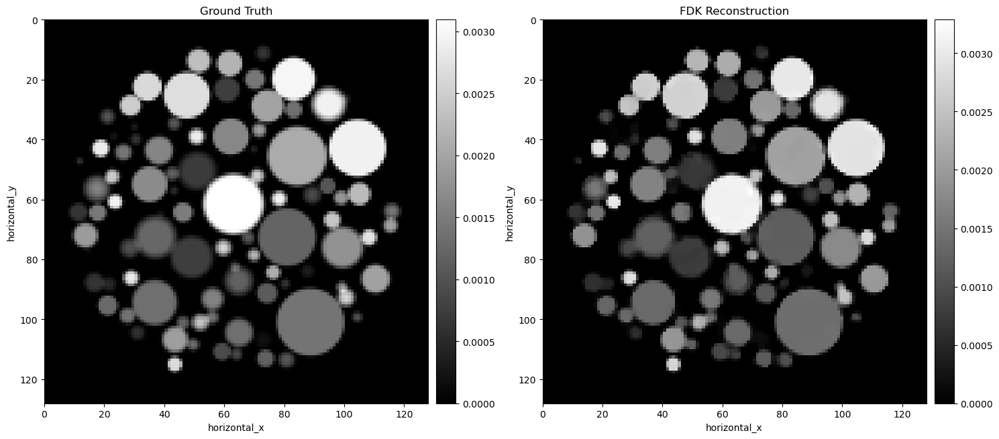

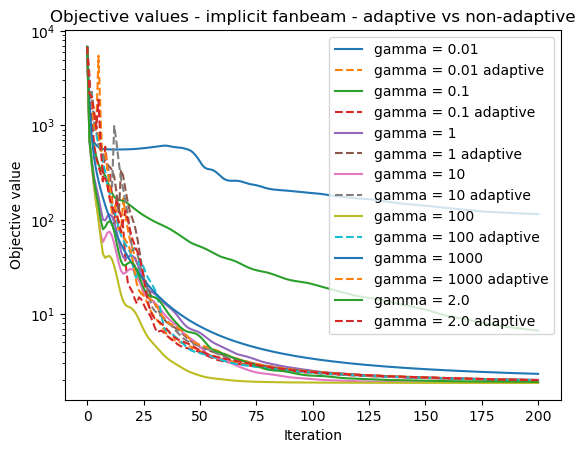

gamma =  0.01
Initial step sizes: tau = 0.0728492225890355, sigma = 7.284922258903551e-06


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079809226
x norm =  0.079809226
x_tmp norm =  0.08593968
x norm =  0.020735376
x_tmp norm =  0.09635762
x norm =  0.02145979
x_tmp norm =  0.10805259
x norm =  0.019374616
x_tmp norm =  0.117762774
x norm =  0.017153967
x_tmp norm =  0.12525624
x norm =  0.01628383
x_tmp norm =  0.13234015
x norm =  0.01464409
x_tmp norm =  0.13877203
x norm =  0.012205422
x_tmp norm =  0.14342104
x norm =  0.00980674
x_tmp norm =  0.14616978
x norm =  0.008120483
x_tmp norm =  0.14741383
x norm =  0.0072446396
x_tmp norm =  0.14764589
x norm =  0.007058284
x_tmp norm =  0.14731117
x norm =  0.0071850163
x_tmp norm =  0.14674117
x norm =  0.007297768
x_tmp norm =  0.1461298
x norm =  0.0071782037
x_tmp norm =  0.14552677
x norm =  0.006845293
x_tmp norm =  0.14496025
x norm =  0.006316676
x_tmp norm =  0.14445743
x norm =  0.005725968
x_tmp norm =  0.14406331
x norm =  0.0051865783
x_tmp norm =  0.14381121
x norm =  0.0048114257
x_tmp norm =  0.14370461
x norm =  0.004667393
x_tmp norm 

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079803996
x norm =  0.079803996
x_tmp norm =  0.08593857
x norm =  0.020733586
x_tmp norm =  0.096354805
x norm =  0.021457702
x_tmp norm =  0.10804791
x norm =  0.019372616
x_tmp norm =  0.11775697
x norm =  0.017151713
x_tmp norm =  0.1252492
x norm =  0.016281001
x_tmp norm =  0.13233119
x norm =  0.014641989
x_tmp norm =  0.13876185
x norm =  0.01220366
x_tmp norm =  0.14341043
x norm =  0.009805484
x_tmp norm =  0.14615935
x norm =  0.008119213
x_tmp norm =  0.14740385
x norm =  0.007243115
x_tmp norm =  0.14763647
x norm =  0.007056252
x_tmp norm =  0.14730215
x norm =  0.00718241
x_tmp norm =  0.14673224
x norm =  0.0072950437
x_tmp norm =  0.1461208
x norm =  0.007175307
x_tmp norm =  0.14551762
x norm =  0.006842392
x_tmp norm =  0.14495085
x norm =  0.0063138413
x_tmp norm =  0.14444773
x norm =  0.0057232524
x_tmp norm =  0.14405322
x norm =  0.0051841754
x_tmp norm =  0.14380078
x norm =  0.0048090047
x_tmp norm =  0.14369379
x norm =  0.0046648
x_tmp norm =

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079751715
x norm =  0.079751715
x_tmp norm =  0.085927516
x norm =  0.020715756
x_tmp norm =  0.09632675
x norm =  0.021436831
x_tmp norm =  0.10800118
x norm =  0.019352632
x_tmp norm =  0.117699035
x norm =  0.017129226
x_tmp norm =  0.12517892
x norm =  0.016252717
x_tmp norm =  0.13224177
x norm =  0.014621
x_tmp norm =  0.13866036
x norm =  0.012186133
x_tmp norm =  0.14330466
x norm =  0.009792776
x_tmp norm =  0.14605515
x norm =  0.008106614
x_tmp norm =  0.14730419
x norm =  0.0072280224
x_tmp norm =  0.14754239
x norm =  0.007036008
x_tmp norm =  0.14721225
x norm =  0.007156462
x_tmp norm =  0.1466434
x norm =  0.0072679194
x_tmp norm =  0.14603122
x norm =  0.007146694
x_tmp norm =  0.14542666
x norm =  0.0068135886
x_tmp norm =  0.14485757
x norm =  0.0062856306
x_tmp norm =  0.14435144
x norm =  0.005696118
x_tmp norm =  0.14395311
x norm =  0.005160406
x_tmp norm =  0.14369728
x norm =  0.004784802
x_tmp norm =  0.14358638
x norm =  0.004638914
x_tmp norm

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.07923261
x norm =  0.07923261
x_tmp norm =  0.08581493
x norm =  0.02054594
x_tmp norm =  0.09604973
x norm =  0.021229614
x_tmp norm =  0.10753926
x norm =  0.019154338
x_tmp norm =  0.117126025
x norm =  0.016909137
x_tmp norm =  0.1244877
x norm =  0.015973222
x_tmp norm =  0.13136274
x norm =  0.014411585
x_tmp norm =  0.13766122
x norm =  0.012016107
x_tmp norm =  0.14226595
x norm =  0.009668048
x_tmp norm =  0.14503212
x norm =  0.007981566
x_tmp norm =  0.14632587
x norm =  0.00708072
x_tmp norm =  0.14662036
x norm =  0.006843239
x_tmp norm =  0.14633752
x norm =  0.0069051753
x_tmp norm =  0.14578594
x norm =  0.007003492
x_tmp norm =  0.14517036
x norm =  0.006871643
x_tmp norm =  0.14455636
x norm =  0.006531821
x_tmp norm =  0.1439701
x norm =  0.0060148356
x_tmp norm =  0.14344339
x norm =  0.005439016
x_tmp norm =  0.14301597
x norm =  0.0049248873
x_tmp norm =  0.14272593
x norm =  0.004554506
x_tmp norm =  0.14258204
x norm =  0.004390618
x_tmp norm =  

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.07439052
x norm =  0.07439052
x_tmp norm =  0.08451267
x norm =  0.01955224
x_tmp norm =  0.093575485
x norm =  0.019316608
x_tmp norm =  0.10342237
x norm =  0.017346308
x_tmp norm =  0.11198743
x norm =  0.015071786
x_tmp norm =  0.118504904
x norm =  0.013579291
x_tmp norm =  0.123941295
x norm =  0.0124020735
x_tmp norm =  0.12906118
x norm =  0.010520045
x_tmp norm =  0.13329318
x norm =  0.008581501
x_tmp norm =  0.13622613
x norm =  0.006938145
x_tmp norm =  0.13795213
x norm =  0.0058979914
x_tmp norm =  0.13878472
x norm =  0.0053658066
x_tmp norm =  0.13904688
x norm =  0.0051028826
x_tmp norm =  0.13894805
x norm =  0.0049191094
x_tmp norm =  0.13862552
x norm =  0.0047026663
x_tmp norm =  0.13819219
x norm =  0.0044002603
x_tmp norm =  0.1377369
x norm =  0.0040124943
x_tmp norm =  0.1373128
x norm =  0.00359352
x_tmp norm =  0.13695958
x norm =  0.0031970942
x_tmp norm =  0.13669316
x norm =  0.0028804136
x_tmp norm =  0.13651302
x norm =  0.0026578244
x_tm

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.04617308
x norm =  0.04617308
x_tmp norm =  0.0672102
x norm =  0.02178755
x_tmp norm =  0.07801598
x norm =  0.012789467
x_tmp norm =  0.0845125
x norm =  0.009316636
x_tmp norm =  0.089032955
x norm =  0.007541058
x_tmp norm =  0.0925274
x norm =  0.0063599306
x_tmp norm =  0.09540983
x norm =  0.0054694563
x_tmp norm =  0.097871974
x norm =  0.0047685793
x_tmp norm =  0.10002201
x norm =  0.0041981437
x_tmp norm =  0.10192886
x norm =  0.0037224968
x_tmp norm =  0.10363457
x norm =  0.0033270149
x_tmp norm =  0.10517324
x norm =  0.002995996
x_tmp norm =  0.1065752
x norm =  0.00271459
x_tmp norm =  0.10785902
x norm =  0.0024749814
x_tmp norm =  0.109042294
x norm =  0.0022666233
x_tmp norm =  0.110135205
x norm =  0.0020850084
x_tmp norm =  0.11114688
x norm =  0.0019267434
x_tmp norm =  0.112085834
x norm =  0.0017878396
x_tmp norm =  0.11295977
x norm =  0.001664215
x_tmp norm =  0.11377457
x norm =  0.0015545519
x_tmp norm =  0.11453579
x norm =  0.0014562218
x_

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.0796937
x norm =  0.0796937
x_tmp norm =  0.08591519
x norm =  0.02069613
x_tmp norm =  0.096295655
x norm =  0.021413676
x_tmp norm =  0.107949376
x norm =  0.019330464
x_tmp norm =  0.117634796
x norm =  0.01710433
x_tmp norm =  0.12510104
x norm =  0.016221387
x_tmp norm =  0.13214277
x norm =  0.014597674
x_tmp norm =  0.13854794
x norm =  0.012166896
x_tmp norm =  0.1431876
x norm =  0.009778594
x_tmp norm =  0.14593972
x norm =  0.008092809
x_tmp norm =  0.14719391
x norm =  0.0072113783
x_tmp norm =  0.14743833
x norm =  0.0070138727
x_tmp norm =  0.14711303
x norm =  0.007127822
x_tmp norm =  0.14654547
x norm =  0.007238118
x_tmp norm =  0.14593261
x norm =  0.0071156165
x_tmp norm =  0.14532681
x norm =  0.0067818076
x_tmp norm =  0.14475518
x norm =  0.006254279
x_tmp norm =  0.14424571
x norm =  0.0056661675
x_tmp norm =  0.14384317
x norm =  0.0051341085
x_tmp norm =  0.14358355
x norm =  0.0047582104
x_tmp norm =  0.14346859
x norm =  0.0046105618
x_tmp no

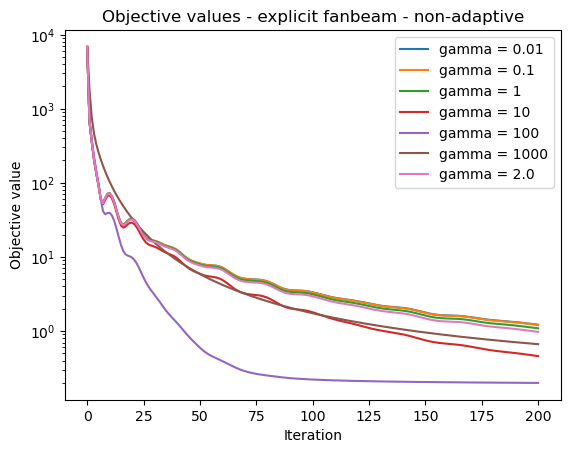

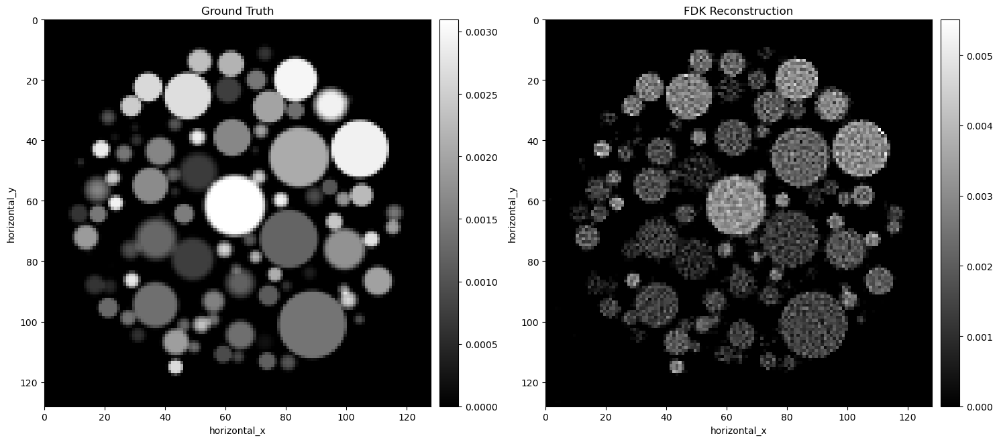

0.9741849544775918
0.0
gamma =  100
Initial step sizes: tau = 7.284922274005562e-06, sigma = 0.07284922274005562


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.07439052
x norm =  0.07439052
self.x, self.x_old =  0.07439052 0.0
cross_term =  0.0008053416342788175 x_change_norm =  0.07439052 y_change_norm =  7.9193254
1.0404651766671817
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0404651766671817
tau = 5.2512009320729696e-06, sigma = 0.0525120093207297
x_tmp norm =  0.03940004
x norm =  0.03940004
self.x, self.x_old =  0.03940004 0.0
cross_term =  0.00016284409228475516 x_change_norm =  0.03940004 y_change_norm =  5.8188014
0.6977526010799177
After possible reduction 5.2512009320729696e-06 0.0525120093207297
2*self.p_norm < self.d_norm
After adaptive 2.625600466036487e-07 1.050240186414593 0.9025
x_tmp norm =  0.041155465
x norm =  0.0030543061
self.x, self.x_old =  0.041155465 0.03940004
cross_term =  1.264189002403277e-05 x_change_norm =  0.0030543061 y_change_norm =  17.77381
0.15145769208852286
After possible reduction 2.625600466036487e-07 1.050240186414593
No change
After adaptive 2.625600466036487e-07 1.050240186

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.04617308
x norm =  0.04617308
self.x, self.x_old =  0.04617308 0.0
cross_term =  0.0031025776344752883 x_change_norm =  0.04617308 y_change_norm =  49.15406
1.040465307168633
Multiplying step sizes by beta/b, beta = 0.75, b = 1.040465307168633
tau = 5.251200273435591e-07, sigma = 0.5251200273435591
x_tmp norm =  0.027190648
x norm =  0.027190648
self.x, self.x_old =  0.027190648 0.0
cross_term =  0.0007755642156822573 x_change_norm =  0.027190648 y_change_norm =  40.15656
0.6977525094046033
After possible reduction 5.251200273435591e-07 0.5251200273435591
No change
After adaptive 5.251200273435591e-07 0.5251200273435591 0.95
x_tmp norm =  0.05416051
x norm =  0.027022056
self.x, self.x_old =  0.05416051 0.027190648
cross_term =  1.781860872333412e-06 x_change_norm =  0.027022056 y_change_norm =  8.244689
0.004723666698662128
After possible reduction 5.251200273435591e-07 0.5251200273435591
No change
After adaptive 5.251200273435591e-07 0.5251200273435591 0.95
x_tmp norm

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.07980977
x norm =  0.07980977
self.x, self.x_old =  0.07980977 0.0
cross_term =  6.752770061603103e-09 x_change_norm =  0.07980977 y_change_norm =  6.1894425e-05
1.0404652195027178
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0404652195027178
tau = 0.7208313992066516, sigma = 3.825458906041098e-07
x_tmp norm =  0.041468997
x norm =  0.041468997
self.x, self.x_old =  0.041468997 0.0
cross_term =  1.3141674072350498e-09 x_change_norm =  0.041468997 y_change_norm =  4.4615455e-05
0.69775267667842
After possible reduction 0.7208313992066516 3.825458906041098e-07
2*self.p_norm < self.d_norm
After adaptive 0.036041569960332615 7.650917812082189e-06 0.9025
x_tmp norm =  0.043260634
x norm =  0.005694624
self.x, self.x_old =  0.043260634 0.041468997
cross_term =  4.4985254952392554e-10 x_change_norm =  0.005694624 y_change_norm =  0.00027940475
0.16325086474954195
After possible reduction 0.036041569960332615 7.650917812082189e-06
2*self.p_norm < self.d_norm
After adapt

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079809226
x norm =  0.079809226
self.x, self.x_old =  0.079809226 0.0
cross_term =  9.269390657138923e-08 x_change_norm =  0.079809226 y_change_norm =  0.000849618
1.040465246681421
Multiplying step sizes by beta/b, beta = 0.75, b = 1.040465246681421
tau = 0.05251200578712932, sigma = 5.2512005787129315e-06
x_tmp norm =  0.04146879
x norm =  0.04146879
self.x, self.x_old =  0.04146879 0.0
cross_term =  1.803937284272312e-08 x_change_norm =  0.04146879 y_change_norm =  0.00061243254
0.6977526279663729
After possible reduction 0.05251200578712932 5.2512005787129315e-06
2*self.p_norm < self.d_norm
After adaptive 0.0026256002893564685 0.00010502401157425854 0.9025
x_tmp norm =  0.043260414
x norm =  0.0056940927
self.x, self.x_old =  0.043260414 0.04146879
cross_term =  6.17382685360733e-09 x_change_norm =  0.0056940927 y_change_norm =  0.0038349915
0.16324991133601074
After possible reduction 0.0026256002893564685 0.00010502401157425854
2*self.p_norm < self.d_norm
After ad

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079803996
x norm =  0.079803996
self.x, self.x_old =  0.079803996 0.0
cross_term =  9.268176769923575e-07 x_change_norm =  0.079803996 y_change_norm =  0.008495623
1.0404653475200907
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0404653475200907
tau = 0.005251200069782883, sigma = 5.2512000697828834e-05
x_tmp norm =  0.041466825
x norm =  0.041466825
self.x, self.x_old =  0.041466825 0.0
cross_term =  1.803765835414271e-07 x_change_norm =  0.041466825 y_change_norm =  0.0061240355
0.697752492358854
After possible reduction 0.005251200069782883 5.2512000697828834e-05
2*self.p_norm < self.d_norm
After adaptive 0.00026256000348914436 0.0010502400139565757 0.9025
x_tmp norm =  0.043258302
x norm =  0.005688942
self.x, self.x_old =  0.043258302 0.041466825
cross_term =  6.161327998980923e-08 x_change_norm =  0.005688942 y_change_norm =  0.03831189
0.16324067428365036
After possible reduction 0.00026256000348914436 0.0010502400139565757
2*self.p_norm < self.d_norm
Afte

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.079751715
x norm =  0.079751715
self.x, self.x_old =  0.079751715 0.0
cross_term =  9.256036822273902e-06 x_change_norm =  0.079751715 y_change_norm =  0.08490057
1.0404653375196524
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0404653375196524
tau = 0.000525120012025482, sigma = 0.000525120012025482
x_tmp norm =  0.041447237
x norm =  0.041447237
self.x, self.x_old =  0.041447237 0.0
cross_term =  1.8020622414613954e-06 x_change_norm =  0.041447237 y_change_norm =  0.06121143
0.6977524723426908
After possible reduction 0.000525120012025482 0.000525120012025482
2*self.p_norm < self.d_norm
After adaptive 2.625600060127412e-05 0.01050240024050963 0.9025
x_tmp norm =  0.043237228
x norm =  0.0056380043
self.x, self.x_old =  0.043237228 0.041447237
cross_term =  6.038352007478999e-07 x_change_norm =  0.0056380043 y_change_norm =  0.37935597
0.16314887312180607
After possible reduction 2.625600060127412e-05 0.01050240024050963
2*self.p_norm < self.d_norm
After adaptiv

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.07923261
x norm =  0.07923261
self.x, self.x_old =  0.07923261 0.0
cross_term =  9.135931888878469e-05 x_change_norm =  0.07923261 y_change_norm =  0.84347945
1.0404652408553423
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0404652408553423
tau = 5.251200608116997e-05, sigma = 0.005251200608116997
x_tmp norm =  0.041252382
x norm =  0.041252382
self.x, self.x_old =  0.041252382 0.0
cross_term =  1.7851583537791654e-05 x_change_norm =  0.041252382 y_change_norm =  0.60923654
0.6977525741152439
After possible reduction 5.251200608116997e-05 0.005251200608116997
2*self.p_norm < self.d_norm
After adaptive 2.625600304058501e-06 0.10502401216233985 0.9025
x_tmp norm =  0.04303098
x norm =  0.005179534
self.x, self.x_old =  0.04303098 0.041252382
cross_term =  4.981110447543956e-06 x_change_norm =  0.005179534 y_change_norm =  3.452757
0.16221500618932946
After possible reduction 2.625600304058501e-06 0.10502401216233985
2*self.p_norm < self.d_norm
After adaptive 2.5599

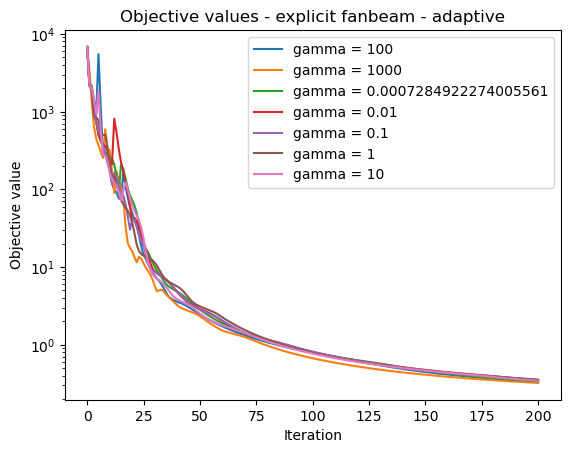

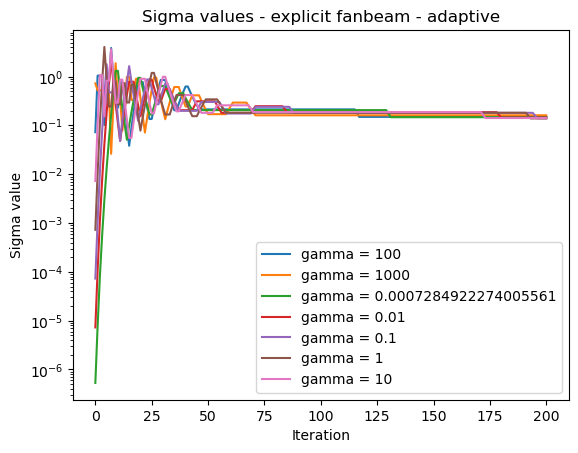

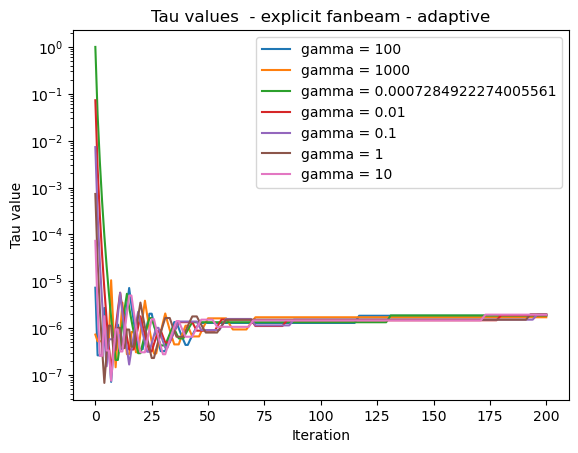

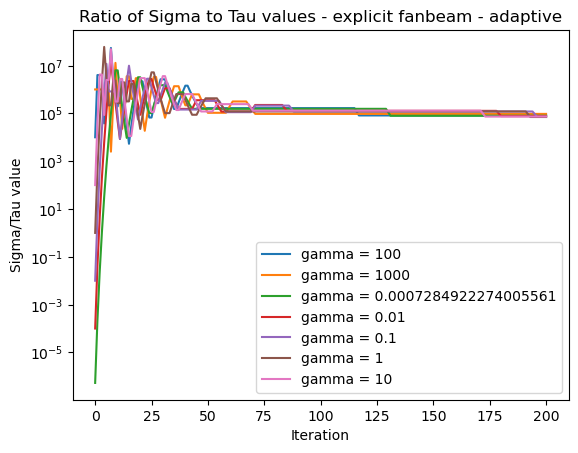

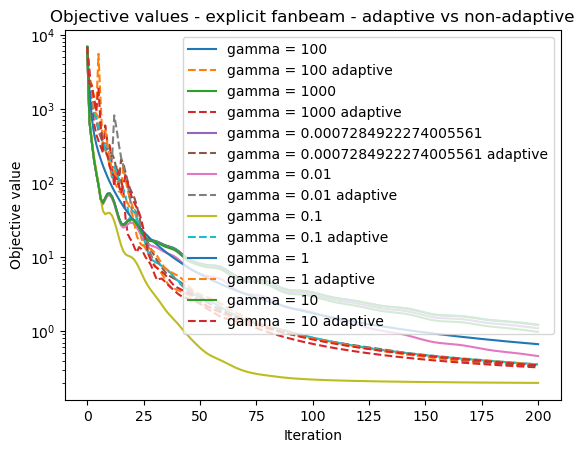

In [23]:
ground_truth = dataexample.SIMULATED_SPHERE_VOLUME.get()

data = dataexample.SIMULATED_CONE_BEAM_DATA.get()
data = data.get_slice(vertical='centre')
ground_truth = ground_truth.get_slice(vertical='centre')


absorption = TransmissionAbsorptionConverter()(data)
absorption = Slicer(roi={'angle':(0, -1, 5)})(absorption)

ig = ground_truth.geometry

recon = FDK(absorption, image_geometry=ig).run()
show2D([ground_truth, recon], title = ['Ground Truth', 'FDK Reconstruction'], origin = 'upper', num_cols = 2);
from cil.optimisation.utilities.callbacks import Callback, ProgressCallback

class SaveStepSizes(Callback):
    def __init__(self):
        super().__init__()
        self.tau = []
        self.sigma = []

    def __call__(self, algorithm):
        self.tau.append(algorithm.tau)
        self.sigma.append(algorithm.sigma)
A = ProjectionOperator(ig, absorption.geometry, device = "gpu")

#  PDHG with implicit TV regularisation - adaptive vs non-adaptive - changing gamma 
F = 0.5 * L2NormSquared(b=absorption)
alpha = 0.5
G = alpha *  FGP_TV( device='gpu', nonnegativity=True)
rho = 1.0

gamma_list =  [ 100, 1000,  1/A.norm(), 0.01, 0.1, 1, 10]
results_adaptive = []
objective_adaptive = []
sigma_values = []
tau_values = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/A.norm()
    tau =(rho/gamma)/A.norm() 
    pdhg_tv_implicit = PDHG(f = F, g = G, operator = A,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau, adaptive=True)#, eta=.95, initial=[recon, None]) 
    callback=SaveStepSizes()
    pdhg_tv_implicit.run(200, verbose=1, callbacks=[ProgressCallback(), callback])
    results_adaptive.append(pdhg_tv_implicit.solution)
    objective_adaptive.append(pdhg_tv_implicit.objective)
    sigma_values.append(callback.sigma)
    tau_values.append(callback.tau)
    

show2D([ground_truth, pdhg_tv_implicit.solution], title = ['Ground Truth', 'PDHG Reconstruction'], origin = 'upper', num_cols = 2);
plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective values - implicit fanbeam - adaptive')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), sigma_values[i], label='gamma = ' + str(gamma))
plt.title('Sigma values - implicit fanbeam - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Sigma value')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), tau_values[i], label='gamma = ' + str(gamma))
plt.title('Tau values - implicit fanbeam - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Tau value')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    #plt the ratio of sigma to tau
    plt.plot(range(0, 201, 1), np.array(sigma_values[i])/np.array(tau_values[i]), label='gamma = ' + str(gamma))
plt.title('Ratio of Sigma to Tau values - implicit fanbeam - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Sigma/Tau value')
plt.yscale('log')
plt.legend()
plt.show()
F = 0.5 * L2NormSquared(b=absorption)
alpha = 0.5
G = alpha *  FGP_TV( device='gpu', nonnegativity=True)
rho = 1.0

gamma_list = [0.01, 0.1, 1, 10, 100, 1000, 1/alpha]
results_vanilla = []
objective_vanilla = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/A.norm()
    tau =(rho/gamma)/A.norm() 
    pdhg_tv_implicit = PDHG(f = F, g = G, operator = A,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau)
    pdhg_tv_implicit.run(200, verbose=1)
    results_vanilla.append(pdhg_tv_implicit.solution)
    objective_vanilla.append(pdhg_tv_implicit.objective)
    
show2D([ground_truth, pdhg_tv_implicit.solution], title = ['Ground Truth', 'FDK Reconstruction'], origin = 'upper', num_cols = 2);
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma)+' adaptive', linestyle='dashed')
plt.title('Objective values - implicit fanbeam - adaptive vs non-adaptive')
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.legend()
plt.show()
# PDHG with Explicit TV - adaptive vs non-adaptive

#   Vanilla TV with reg parameter in front of gradient operator

alpha = 0.5
G = IndicatorBox(lower=0)
rho = 1.0
f1 =  MixedL21Norm()
f2 = 0.5 * L2NormSquared(b=absorption)
F = BlockFunction(f1, f2)

# Define BlockOperator K
Grad = alpha * GradientOperator(ig)
K = BlockOperator(Grad, A)



gamma_list = [0.01, 0.1, 1, 10, 100, 1000, 1/alpha]
results_vanilla = []
objective_vanilla = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/K.norm()
    tau =(rho/gamma)/K.norm() 
    pdhg_tv_explicit = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau)
    pdhg_tv_explicit.run(200, verbose=1)
    results_vanilla.append(pdhg_tv_explicit.solution)
    objective_vanilla.append(pdhg_tv_explicit.objective)
    


for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective values - explicit fanbeam - non-adaptive')
plt.legend()
plt.show()

show2D([ground_truth, pdhg_tv_explicit.solution], title = ['Ground Truth', 'FDK Reconstruction'], origin = 'upper', num_cols = 2);

print( F(K.direct(pdhg_tv_explicit.solution)) )
print( G(pdhg_tv_explicit.solution) )

alpha = 0.5
G = IndicatorBox(lower=0)
rho = 1.0
f1 =  MixedL21Norm()
f2 = 0.5 * L2NormSquared(b=absorption)
F = BlockFunction(f1, f2)

# Define BlockOperator K
Grad = alpha * GradientOperator(ig)
K = BlockOperator(Grad, A)


gamma_list =  [ 100, 1000,  1/A.norm(), 0.01, 0.1, 1, 10]
results_adaptive = []
objective_adaptive = []
sigma_values = []
tau_values = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/A.norm()
    tau =(rho/gamma)/A.norm() 
    pdhg_tv_explicit = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau, adaptive=True)#, eta=.95, initial=[recon, None]) 
    callback=SaveStepSizes()
    pdhg_tv_explicit.run(200, verbose=1, callbacks=[ProgressCallback(), callback])
    results_adaptive.append(pdhg_tv_explicit.solution)
    objective_adaptive.append(pdhg_tv_explicit.objective)
    sigma_values.append(callback.sigma)
    tau_values.append(callback.tau)
    
plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective values - explicit fanbeam - adaptive')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), sigma_values[i], label='gamma = ' + str(gamma))
plt.title('Sigma values - explicit fanbeam - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Sigma value')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), tau_values[i], label='gamma = ' + str(gamma))
plt.title('Tau values  - explicit fanbeam - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Tau value')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    #plt the ratio of sigma to tau
    plt.plot(range(0, 201, 1), np.array(sigma_values[i])/np.array(tau_values[i]), label='gamma = ' + str(gamma))
plt.title('Ratio of Sigma to Tau values - explicit fanbeam - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Sigma/Tau value')
plt.yscale('log')
plt.legend()
plt.show()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma)+' adaptive', linestyle='dashed')
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective values - explicit fanbeam - adaptive vs non-adaptive')
plt.legend()
plt.show()


In [24]:
# Walnut data

3D Cone-beam tomography
System configuration:
	Source position: [   0.        , -105.05081177,    0.        ]
	Rotation axis position: [0., 0., 0.]
	Rotation axis direction: [0., 0., 1.]
	Detector position: [ 0.        , 45.08757401,  0.        ]
	Detector direction x: [1., 0., 0.]
	Detector direction y: [0., 0., 1.]
Panel configuration:
	Number of pixels: [1024 1024]
	Pixel size: [0.0658543 0.0658543]
	Pixel origin: bottom-left
Channel configuration:
	Number of channels: 1
Acquisition description:
	Number of positions: 1601
	Angles 0-9 in radians: [-3.1415665, -3.1377017, -3.1337626, -3.1298182, -3.125836 , -3.1219127,
 -3.1180956, -3.1140666, -3.1101887, -3.1062822]
	Angles 1591-1600 in radians: [3.106215 , 3.1101599, 3.1141102, 3.117992 , 3.12194  , 3.1258695,
 3.1298053, 3.1337383, 3.1376445, 3.1415997]
	Full angular array can be accessed with acquisition_data.geometry.angles
Distances in units: units distance
Number of channels: 1
channel_spacing: 1.0
voxel_num : x1024,y1024,z1024

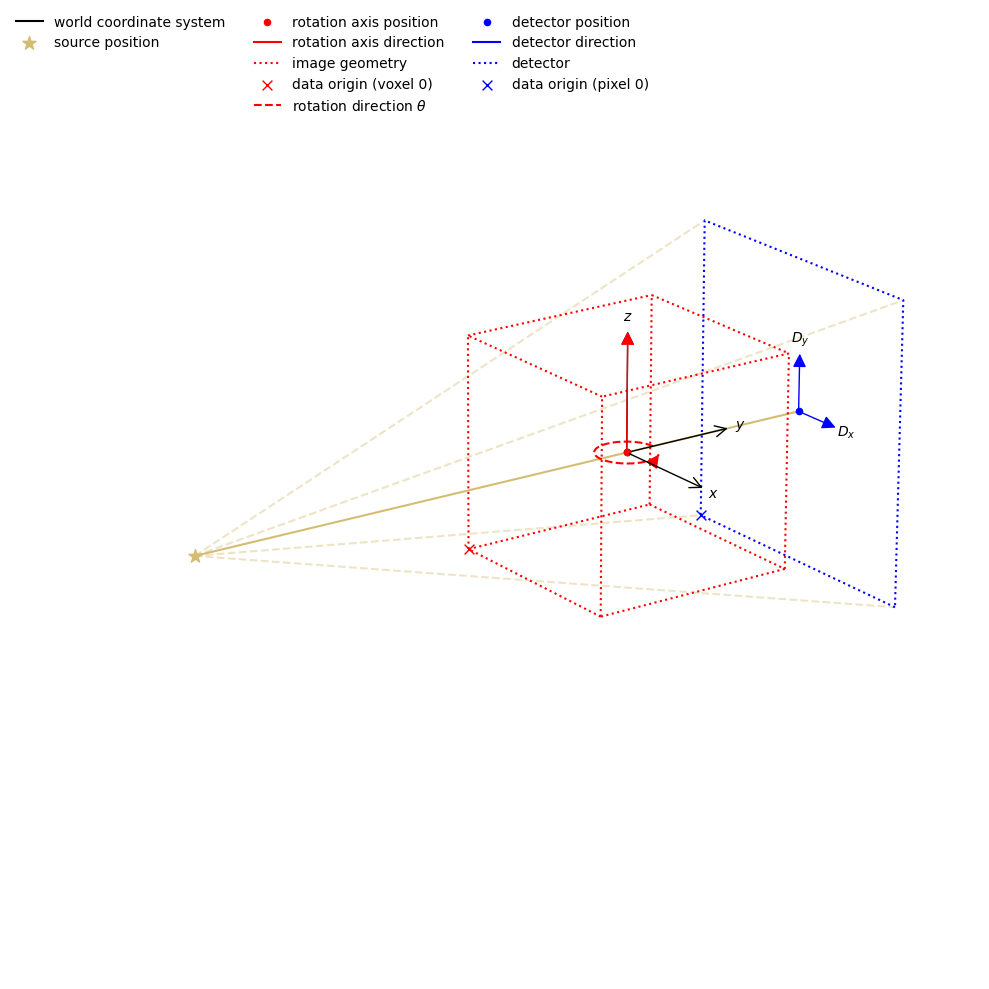

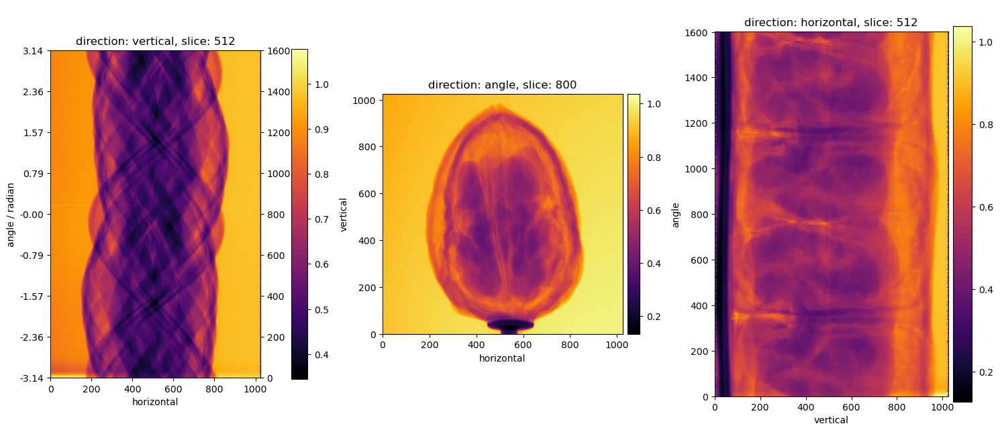

New geometry:  2D Cone-beam tomography
System configuration:
	Source position: [   0.        , -105.05081177]
	Rotation axis position: [0., 0.]
	Detector position: [ 0.        , 45.08757401]
	Detector direction x: [1., 0.]
Panel configuration:
	Number of pixels: [1024    1]
	Pixel size: [0.0658543 0.0658543]
	Pixel origin: bottom-left
Channel configuration:
	Number of channels: 1
Acquisition description:
	Number of positions: 160
	Angles 0-9 in radians: [-3.1415665, -3.1022923, -3.0630562, -3.0237632, -2.9845278, -2.945264 ,
 -2.9060063, -2.866688 , -2.8274012, -2.78817  ]
	Angles 150-159 in radians: [2.748842 , 2.7881632, 2.8274217, 2.866726 , 2.9059432, 2.9452505,
 2.9844823, 3.0237305, 3.0630383, 3.1023333]
	Full angular array can be accessed with acquisition_data.geometry.angles
Distances in units: units distance
Shape out:  (160, 1024)
New geometry shape:  (160, 1024)
New geometry:  2D Cone-beam tomography
System configuration:
	Source position: [   0.        , -105.05081177]
	Rot

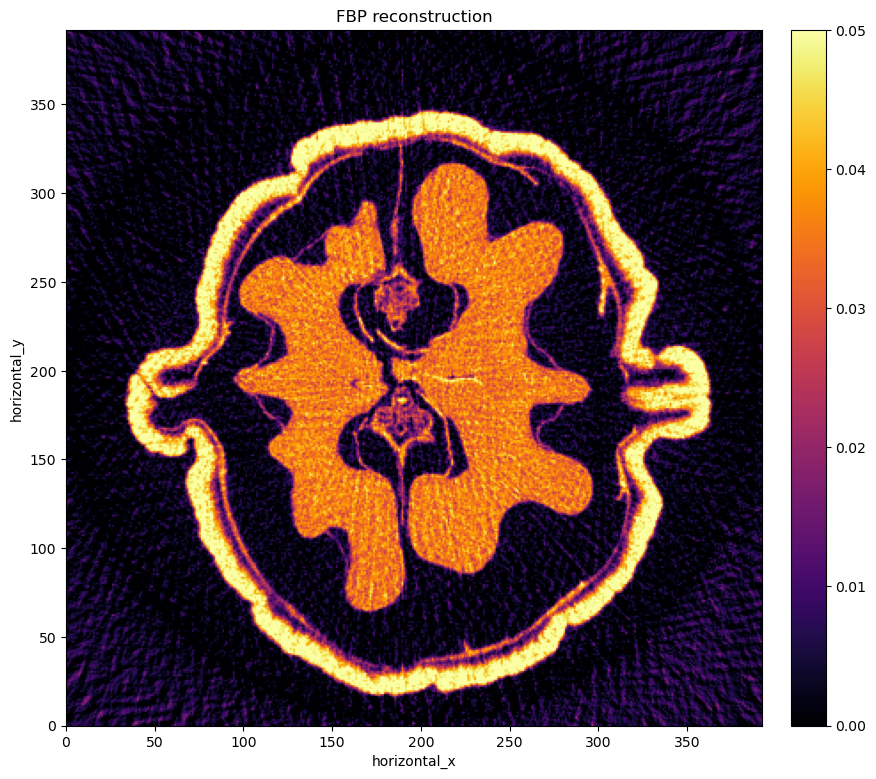

gamma =  100
Initial step sizes: tau = 0.0004336136484029827, sigma = 4.336136484029827


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.893489
x norm =  0.893489
self.x, self.x_old =  0.893489 0.0
cross_term =  6.834975954716123 x_change_norm =  0.893489 y_change_norm =  95.17051
1.027792240912203
Multiplying step sizes by beta/b, beta = 0.75, b = 1.027792240912203
tau = 0.00031641631777021506, sigma = 3.1641631777021506
x_tmp norm =  0.6096776
x norm =  0.6096776
self.x, self.x_old =  0.6096776 0.0
cross_term =  2.322281997053275 x_change_norm =  0.6096776 y_change_norm =  88.99334
0.7007723026216099
After possible reduction 0.00031641631777021506 3.1641631777021506
2*self.d_norm < self.p_norm
After adaptive 0.006328326355404296 0.15820815888510767 0.9025
x_tmp norm =  12.790696
x norm =  12.181027
self.x, self.x_old =  12.790696 0.6096776
cross_term =  0.04474182192234211 x_change_norm =  12.181027 y_change_norm =  1.1819459
0.002116951511609309
After possible reduction 0.006328326355404296 0.15820815888510767
2*self.p_norm < self.d_norm
After adaptive 0.000617011819651919 1.6226477834370012 0.8573749

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.10747593
x norm =  0.10747593
self.x, self.x_old =  0.10747593 0.0
cross_term =  0.9889654028014632 x_change_norm =  0.10747593 y_change_norm =  114.47863
1.0277924293025822
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0277924293025822
tau = 3.164162597723271e-05, sigma = 31.641625977232714
x_tmp norm =  0.07777788
x norm =  0.07777788
self.x, self.x_old =  0.07777788 0.0
cross_term =  0.37794320036216733 x_change_norm =  0.07777788 y_change_norm =  113.53072
0.7007721370802892
After possible reduction 3.164162597723271e-05 31.641625977232714
2*self.d_norm < self.p_norm
After adaptive 0.0006328325195446537 1.582081298861637 0.9025
x_tmp norm =  1.6326127
x norm =  1.554835
self.x, self.x_old =  1.6326127 0.07777788
cross_term =  0.0033248937759511724 x_change_norm =  1.554835 y_change_norm =  0.6763476
0.0009658395904493023
After possible reduction 0.0006328325195446537 1.582081298861637
2*self.d_norm < self.p_norm
After adaptive 0.006490589944047728 0.154252926

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.7587414
x norm =  4.7587414
self.x, self.x_old =  4.7587414 0.0
cross_term =  0.08492009634121318 x_change_norm =  4.7587414 y_change_norm =  0.22201025
1.027792131862999
Multiplying step sizes by beta/b, beta = 0.75, b = 1.027792131862999
tau = 0.7224223429830386, sigma = 0.00138588331838202
x_tmp norm =  2.535284
x norm =  2.535284
self.x, self.x_old =  2.535284 0.0
cross_term =  0.017588773574674147 x_change_norm =  2.535284 y_change_norm =  0.16208827
0.7007724574374248
After possible reduction 0.7224223429830386 0.00138588331838202
2*self.p_norm < self.d_norm
After adaptive 0.03612111714915196 0.027717666367640375 0.9025
x_tmp norm =  2.621614
x norm =  0.3231955
self.x, self.x_old =  2.621614 2.535284
cross_term =  0.005212844511581721 x_change_norm =  0.3231955 y_change_norm =  0.9704305
0.1569159716001952
After possible reduction 0.03612111714915196 0.027717666367640375
2*self.p_norm < self.d_norm
After adaptive 0.0035218089220423175 0.2842837576168243 0.8573749

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.7657127
x norm =  4.7657127
self.x, self.x_old =  4.7657127 0.0
cross_term =  0.019445282883257607 x_change_norm =  4.7657127 y_change_norm =  0.05076227
1.027792212013261
Multiplying step sizes by beta/b, beta = 0.75, b = 1.027792212013261
tau = 3.1641632666704913, sigma = 0.0003164163266670492
x_tmp norm =  2.5379941
x norm =  2.5379941
self.x, self.x_old =  2.5379941 0.0
cross_term =  0.004024350090734106 x_change_norm =  2.5379941 y_change_norm =  0.03704656
0.7007723732469667
After possible reduction 3.1641632666704913 0.0003164163266670492
2*self.p_norm < self.d_norm
After adaptive 0.1582081633335247 0.006328326533340978 0.9025
x_tmp norm =  2.6239789
x norm =  0.32986754
self.x, self.x_old =  2.6239789 2.5379941
cross_term =  0.0012459088389884295 x_change_norm =  0.32986754 y_change_norm =  0.2265139
0.1572039458496739
After possible reduction 0.1582081633335247 0.006328326533340978
2*self.p_norm < self.d_norm
After adaptive 0.015425295925018663 0.06490591316247

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.747195
x norm =  4.747195
self.x, self.x_old =  4.747195 0.0
cross_term =  0.19294460789254375 x_change_norm =  4.747195 y_change_norm =  0.5056503
1.0277921345076202
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0277921345076202
tau = 0.3164163505279538, sigma = 0.003164163505279539
x_tmp norm =  2.5307899
x norm =  2.5307899
self.x, self.x_old =  2.5307899 0.0
cross_term =  0.04001535844110486 x_change_norm =  2.5307899 y_change_norm =  0.36941394
0.7007724930738635
After possible reduction 0.3164163505279538 0.003164163505279539
2*self.p_norm < self.d_norm
After adaptive 0.015820817526397704 0.06328327010559072 0.9025
x_tmp norm =  2.61769
x norm =  0.31273866
self.x, self.x_old =  2.61769 2.5307899
cross_term =  0.011050378615242175 x_change_norm =  0.31273866 y_change_norm =  2.137721
0.1564336186726753
After possible reduction 0.015820817526397704 0.06328327010559072
2*self.p_norm < self.d_norm
After adaptive 0.0015425297088237767 0.649059180570161 0.857374

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.569634
x norm =  4.569634
self.x, self.x_old =  4.569634 0.0
cross_term =  1.787809923725506 x_change_norm =  4.569634 y_change_norm =  4.867373
1.0277920389526343
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0277920389526343
tau = 0.031641637994553905, sigma = 0.031641637994553905
x_tmp norm =  2.46093
x norm =  2.46093
self.x, self.x_old =  2.46093 0.0
cross_term =  0.37836696579206053 x_change_norm =  2.46093 y_change_norm =  3.5921667
0.7007726044810129
After possible reduction 0.031641637994553905 0.031641637994553905
2*self.p_norm < self.d_norm
After adaptive 0.0015820818997276966 0.6328327598910776 0.9025
x_tmp norm =  2.554896
x norm =  0.21168943
self.x, self.x_old =  2.554896 2.46093
cross_term =  0.04244518747660088 x_change_norm =  0.21168943 y_change_norm =  13.536347
0.1481905113512534
After possible reduction 0.0015820818997276966 0.6328327598910776
2*self.p_norm < self.d_norm
After adaptive 0.00015425298522345047 6.490592409139255 0.8573749999999

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  3.3257074
x norm =  3.3257074
self.x, self.x_old =  3.3257074 0.0
cross_term =  9.469490207070349 x_change_norm =  3.3257074 y_change_norm =  35.423965
1.0277922394590104
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0277922394590104
tau = 0.003164163182175952, sigma = 0.3164163182175952
x_tmp norm =  1.9285669
x norm =  1.9285669
self.x, self.x_old =  1.9285669 0.0
cross_term =  2.3237212183627047 x_change_norm =  1.9285669 y_change_norm =  28.150883
0.7007724157927623
After possible reduction 0.003164163182175952 0.3164163182175952
2*self.p_norm < self.d_norm
After adaptive 0.00015820815910879774 6.3283263643518985 0.9025
x_tmp norm =  2.0189228
x norm =  0.09618055
self.x, self.x_old =  2.0189228 1.9285669
cross_term =  0.007262933929737775 x_change_norm =  0.09618055 y_change_norm =  23.63599
0.05492510425123636
After possible reduction 0.00015820815910879774 6.3283263643518985
2*self.d_norm < self.p_norm
After adaptive 0.0016226477857312583 0.6170118205243103 

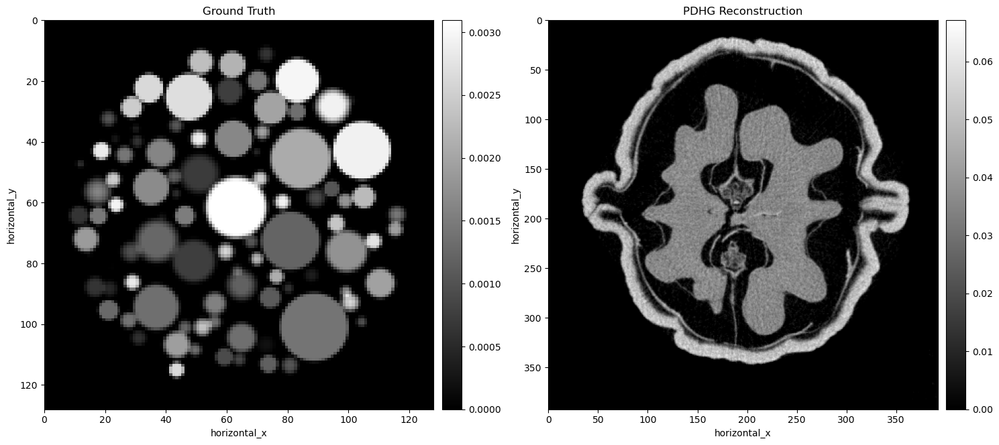

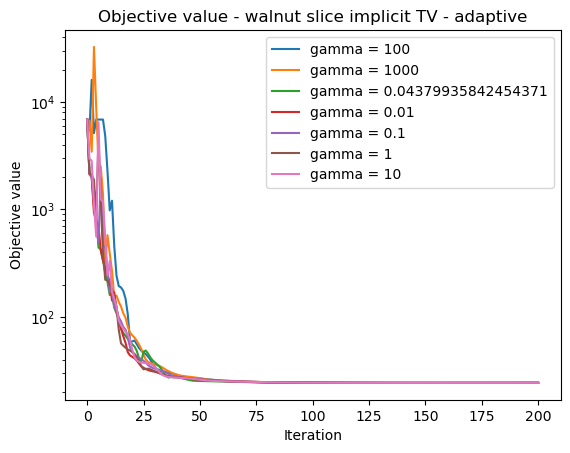

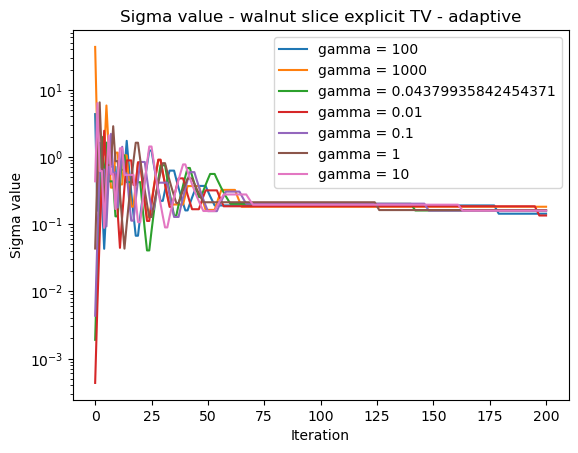

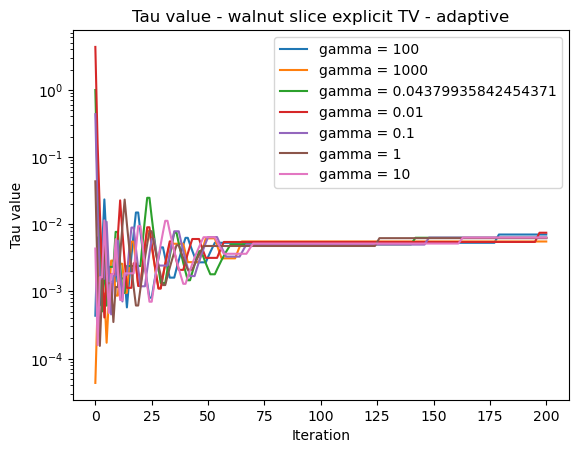

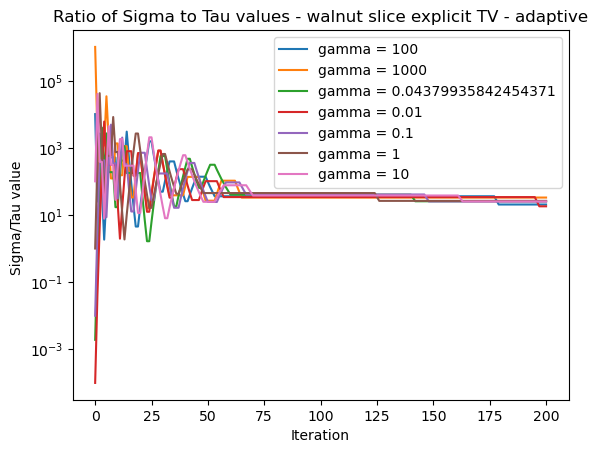

gamma =  0.01
Initial step sizes: tau = 4.336136484029827, sigma = 0.00043361364840298274


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.7657127
x norm =  4.7657127
x_tmp norm =  5.259557
x norm =  1.2038463
x_tmp norm =  5.7743855
x norm =  1.2578503
x_tmp norm =  6.4361677
x norm =  1.0082593
x_tmp norm =  6.8304815
x norm =  0.86730975
x_tmp norm =  7.1112313
x norm =  0.8714905
x_tmp norm =  7.4464087
x norm =  0.82056475
x_tmp norm =  7.8068304
x norm =  0.72745866
x_tmp norm =  8.128078
x norm =  0.6157005
x_tmp norm =  8.377588
x norm =  0.5110968
x_tmp norm =  8.555838
x norm =  0.42870262
x_tmp norm =  8.676099
x norm =  0.37651664
x_tmp norm =  8.75435
x norm =  0.35084596
x_tmp norm =  8.803527
x norm =  0.34115526
x_tmp norm =  8.831788
x norm =  0.3335219
x_tmp norm =  8.843666
x norm =  0.31962946
x_tmp norm =  8.842688
x norm =  0.2970814
x_tmp norm =  8.832635
x norm =  0.27095428
x_tmp norm =  8.818245
x norm =  0.24807242
x_tmp norm =  8.804701
x norm =  0.23234218
x_tmp norm =  8.795829
x norm =  0.22521846
x_tmp norm =  8.793121
x norm =  0.22472365
x_tmp norm =  8.795592
x norm =  0.

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.747195
x norm =  4.747195
x_tmp norm =  5.254773
x norm =  1.2002668
x_tmp norm =  5.765407
x norm =  1.2516587
x_tmp norm =  6.4214497
x norm =  1.0038146
x_tmp norm =  6.815356
x norm =  0.8599514
x_tmp norm =  7.0922103
x norm =  0.86280495
x_tmp norm =  7.421208
x norm =  0.8130792
x_tmp norm =  7.7765474
x norm =  0.72155726
x_tmp norm =  8.094301
x norm =  0.61039984
x_tmp norm =  8.341174
x norm =  0.5065391
x_tmp norm =  8.517441
x norm =  0.424348
x_tmp norm =  8.635993
x norm =  0.37157717
x_tmp norm =  8.712419
x norm =  0.34518853
x_tmp norm =  8.759659
x norm =  0.33452758
x_tmp norm =  8.785947
x norm =  0.32632273
x_tmp norm =  8.796068
x norm =  0.3125035
x_tmp norm =  8.793678
x norm =  0.29037222
x_tmp norm =  8.782654
x norm =  0.2645653
x_tmp norm =  8.767561
x norm =  0.24190257
x_tmp norm =  8.753237
x norm =  0.22593522
x_tmp norm =  8.743178
x norm =  0.21851385
x_tmp norm =  8.738659
x norm =  0.21760225
x_tmp norm =  8.73866
x norm =  0.2198876

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.569634
x norm =  4.569634
x_tmp norm =  5.2032924
x norm =  1.1778859
x_tmp norm =  5.6813912
x norm =  1.190023
x_tmp norm =  6.2822394
x norm =  0.9620953
x_tmp norm =  6.6729603
x norm =  0.7953759
x_tmp norm =  6.921157
x norm =  0.7809397
x_tmp norm =  7.1957407
x norm =  0.74423075
x_tmp norm =  7.505143
x norm =  0.66482127
x_tmp norm =  7.791052
x norm =  0.5625523
x_tmp norm =  8.018404
x norm =  0.46562693
x_tmp norm =  8.182772
x norm =  0.38636923
x_tmp norm =  8.294171
x norm =  0.33093116
x_tmp norm =  8.365285
x norm =  0.2976602
x_tmp norm =  8.407017
x norm =  0.27954054
x_tmp norm =  8.427945
x norm =  0.2655006
x_tmp norm =  8.43374
x norm =  0.2508408
x_tmp norm =  8.429219
x norm =  0.23196709
x_tmp norm =  8.418588
x norm =  0.21080951
x_tmp norm =  8.40556
x norm =  0.19028907
x_tmp norm =  8.3930025
x norm =  0.17426935
x_tmp norm =  8.382469
x norm =  0.16432686
x_tmp norm =  8.374176
x norm =  0.15925546
x_tmp norm =  8.366977
x norm =  0.15697

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  3.3257074
x norm =  3.3257074
x_tmp norm =  4.543936
x norm =  1.3088427
x_tmp norm =  5.0853734
x norm =  0.8075915
x_tmp norm =  5.4472833
x norm =  0.6642609
x_tmp norm =  5.737363
x norm =  0.53571403
x_tmp norm =  5.961083
x norm =  0.4305123
x_tmp norm =  6.124324
x norm =  0.36587223
x_tmp norm =  6.253965
x norm =  0.32478335
x_tmp norm =  6.368353
x norm =  0.2918378
x_tmp norm =  6.475271
x norm =  0.26122683
x_tmp norm =  6.576688
x norm =  0.23228799
x_tmp norm =  6.672118
x norm =  0.20564814
x_tmp norm =  6.7603602
x norm =  0.18200894
x_tmp norm =  6.8406286
x norm =  0.16164011
x_tmp norm =  6.9129887
x norm =  0.14430816
x_tmp norm =  6.977969
x norm =  0.12954226
x_tmp norm =  7.0361934
x norm =  0.116935305
x_tmp norm =  7.0883155
x norm =  0.1061548
x_tmp norm =  7.135093
x norm =  0.09688425
x_tmp norm =  7.1772537
x norm =  0.08882728
x_tmp norm =  7.215427
x norm =  0.08179981
x_tmp norm =  7.2501416
x norm =  0.075644664
x_tmp norm =  7.2818813
x n

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.893489
x norm =  0.893489
x_tmp norm =  1.632875
x norm =  0.7399865
x_tmp norm =  2.240846
x norm =  0.6090548
x_tmp norm =  2.7414427
x norm =  0.50235754
x_tmp norm =  3.15459
x norm =  0.415855
x_tmp norm =  3.4965672
x norm =  0.34592667
x_tmp norm =  3.7806342
x norm =  0.28955552
x_tmp norm =  4.017577
x norm =  0.24425685
x_tmp norm =  4.216167
x norm =  0.20798282
x_tmp norm =  4.3835306
x norm =  0.17903835
x_tmp norm =  4.525457
x norm =  0.15601395
x_tmp norm =  4.6466455
x norm =  0.13773406
x_tmp norm =  4.750913
x norm =  0.1232196
x_tmp norm =  4.8413515
x norm =  0.11166093
x_tmp norm =  4.9204707
x norm =  0.10239696
x_tmp norm =  4.9903054
x norm =  0.0948973
x_tmp norm =  5.0525064
x norm =  0.08874469
x_tmp norm =  5.108412
x norm =  0.08361718
x_tmp norm =  5.1591053
x norm =  0.07927066
x_tmp norm =  5.2054677
x norm =  0.07552254
x_tmp norm =  5.2482142
x norm =  0.07223772
x_tmp norm =  5.2879243
x norm =  0.06931672
x_tmp norm =  5.3250713
x no

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.10747593
x norm =  0.10747593
x_tmp norm =  0.21271573
x norm =  0.10524061
x_tmp norm =  0.31567696
x norm =  0.102962375
x_tmp norm =  0.4164095
x norm =  0.100734256
x_tmp norm =  0.51496285
x norm =  0.09855599
x_tmp norm =  0.6113857
x norm =  0.09642648
x_tmp norm =  0.7057253
x norm =  0.09434466
x_tmp norm =  0.7980283
x norm =  0.09230948
x_tmp norm =  0.8883399
x norm =  0.09031995
x_tmp norm =  0.9767044
x norm =  0.088375024
x_tmp norm =  1.0631654
x norm =  0.086473726
x_tmp norm =  1.1477652
x norm =  0.084615126
x_tmp norm =  1.2305454
x norm =  0.08279827
x_tmp norm =  1.3115466
x norm =  0.08102225
x_tmp norm =  1.390808
x norm =  0.07928615
x_tmp norm =  1.4683688
x norm =  0.07758912
x_tmp norm =  1.544267
x norm =  0.07593028
x_tmp norm =  1.6185397
x norm =  0.07430883
x_tmp norm =  1.6912229
x norm =  0.07272391
x_tmp norm =  1.762352
x norm =  0.07117475
x_tmp norm =  1.8319619
x norm =  0.069660544
x_tmp norm =  1.9000863
x norm =  0.06818053
x_t

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.3873005
x norm =  4.3873005
x_tmp norm =  5.139689
x norm =  1.1744001
x_tmp norm =  5.5979657
x norm =  1.1233834
x_tmp norm =  6.1435094
x norm =  0.92063594
x_tmp norm =  6.530293
x norm =  0.74144113
x_tmp norm =  6.7639
x norm =  0.7038628
x_tmp norm =  6.993474
x norm =  0.6744553
x_tmp norm =  7.255627
x norm =  0.6054515
x_tmp norm =  7.510367
x norm =  0.51904905
x_tmp norm =  7.723854
x norm =  0.42848036
x_tmp norm =  7.8838387
x norm =  0.35363528
x_tmp norm =  7.996368
x norm =  0.29838496
x_tmp norm =  8.072182
x norm =  0.26160783
x_tmp norm =  8.121125
x norm =  0.23753336
x_tmp norm =  8.1503725
x norm =  0.21980068
x_tmp norm =  8.165173
x norm =  0.20282628
x_tmp norm =  8.169646
x norm =  0.18509866
x_tmp norm =  8.16755
x norm =  0.16709453
x_tmp norm =  8.162219
x norm =  0.14993194
x_tmp norm =  8.156201
x norm =  0.1355592
x_tmp norm =  8.150737
x norm =  0.12484553
x_tmp norm =  8.1458435
x norm =  0.11736167
x_tmp norm =  8.140613
x norm =  0.1

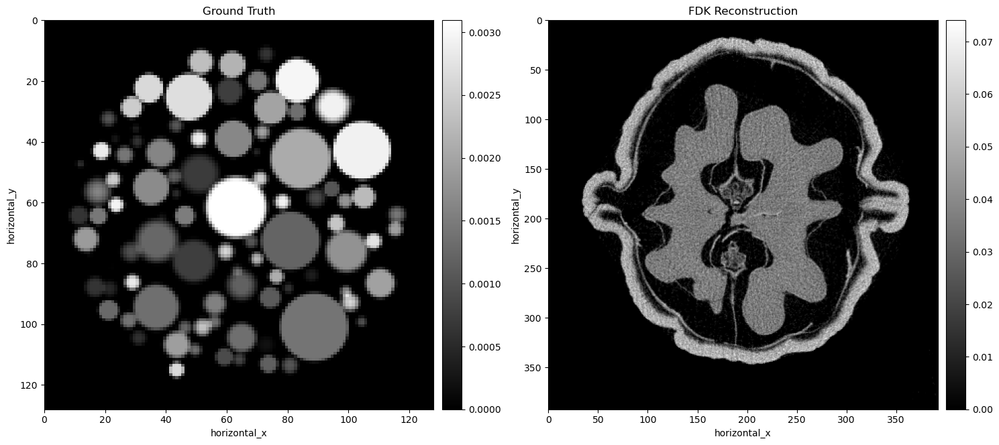

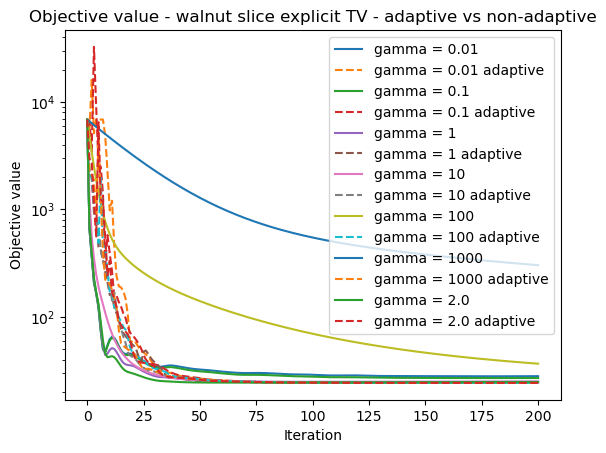

gamma =  0.01
Initial step sizes: tau = 4.336136484029827, sigma = 0.00043361364840298274


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.7657127
x norm =  4.7425623
x_tmp norm =  5.2447352
x norm =  1.1168458
x_tmp norm =  5.6983595
x norm =  1.1872232
x_tmp norm =  6.3020034
x norm =  0.9177716
x_tmp norm =  6.6519537
x norm =  0.7192328
x_tmp norm =  6.809096
x norm =  0.7864887
x_tmp norm =  7.0494027
x norm =  0.81966114
x_tmp norm =  7.4106073
x norm =  0.79308045
x_tmp norm =  7.8109846
x norm =  0.7078013
x_tmp norm =  8.150481
x norm =  0.59441257
x_tmp norm =  8.400308
x norm =  0.48292324
x_tmp norm =  8.556605
x norm =  0.4156655
x_tmp norm =  8.647335
x norm =  0.38440204
x_tmp norm =  8.699736
x norm =  0.37219405
x_tmp norm =  8.732575
x norm =  0.36262253
x_tmp norm =  8.75392
x norm =  0.3469366
x_tmp norm =  8.765964
x norm =  0.32573643
x_tmp norm =  8.769786
x norm =  0.29884115
x_tmp norm =  8.769121
x norm =  0.26827344
x_tmp norm =  8.768915
x norm =  0.24033536
x_tmp norm =  8.77353
x norm =  0.21703123
x_tmp norm =  8.7848215
x norm =  0.20058222
x_tmp norm =  8.801592
x norm =  0

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.747195
x norm =  4.7439313
x_tmp norm =  5.2524824
x norm =  1.1849027
x_tmp norm =  5.7517285
x norm =  1.244098
x_tmp norm =  6.4020624
x norm =  0.9942781
x_tmp norm =  6.7893014
x norm =  0.8431062
x_tmp norm =  7.046784
x norm =  0.8582074
x_tmp norm =  7.36769
x norm =  0.817742
x_tmp norm =  7.7300496
x norm =  0.73289627
x_tmp norm =  8.057702
x norm =  0.6195234
x_tmp norm =  8.312016
x norm =  0.51438534
x_tmp norm =  8.492973
x norm =  0.43044603
x_tmp norm =  8.613491
x norm =  0.37665704
x_tmp norm =  8.689887
x norm =  0.34877017
x_tmp norm =  8.736112
x norm =  0.33819374
x_tmp norm =  8.761857
x norm =  0.32723087
x_tmp norm =  8.771882
x norm =  0.31243303
x_tmp norm =  8.769716
x norm =  0.29037282
x_tmp norm =  8.759443
x norm =  0.26405427
x_tmp norm =  8.746288
x norm =  0.236739
x_tmp norm =  8.734244
x norm =  0.21673603
x_tmp norm =  8.725892
x norm =  0.20602249
x_tmp norm =  8.722101
x norm =  0.2017472
x_tmp norm =  8.720878
x norm =  0.201661

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.569634
x norm =  4.569278
x_tmp norm =  5.2030125
x norm =  1.1762022
x_tmp norm =  5.6798606
x norm =  1.1890472
x_tmp norm =  6.2799263
x norm =  0.96155477
x_tmp norm =  6.6706
x norm =  0.7933785
x_tmp norm =  6.9163775
x norm =  0.78012544
x_tmp norm =  7.1895823
x norm =  0.7445416
x_tmp norm =  7.4990706
x norm =  0.66531825
x_tmp norm =  7.7854166
x norm =  0.56322163
x_tmp norm =  8.013443
x norm =  0.46595323
x_tmp norm =  8.17813
x norm =  0.38654155
x_tmp norm =  8.289611
x norm =  0.33085307
x_tmp norm =  8.360558
x norm =  0.2972085
x_tmp norm =  8.401749
x norm =  0.27932203
x_tmp norm =  8.422002
x norm =  0.26503405
x_tmp norm =  8.427151
x norm =  0.24993746
x_tmp norm =  8.4218855
x norm =  0.23091985
x_tmp norm =  8.410458
x norm =  0.20963691
x_tmp norm =  8.396768
x norm =  0.18889208
x_tmp norm =  8.383678
x norm =  0.17247246
x_tmp norm =  8.372643
x norm =  0.1621699
x_tmp norm =  8.363715
x norm =  0.15690625
x_tmp norm =  8.355667
x norm =  0.

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  3.3257074
x norm =  3.3256707
x_tmp norm =  4.5439057
x norm =  1.3087487
x_tmp norm =  5.085252
x norm =  0.80739796
x_tmp norm =  5.4470277
x norm =  0.66407406
x_tmp norm =  5.7369723
x norm =  0.5355958
x_tmp norm =  5.9606533
x norm =  0.43041432
x_tmp norm =  6.123896
x norm =  0.36577153
x_tmp norm =  6.25352
x norm =  0.3246411
x_tmp norm =  6.367862
x norm =  0.2916748
x_tmp norm =  6.4746723
x norm =  0.2610488
x_tmp norm =  6.575922
x norm =  0.23212995
x_tmp norm =  6.671215
x norm =  0.20551798
x_tmp norm =  6.7593846
x norm =  0.18186107
x_tmp norm =  6.839596
x norm =  0.16146627
x_tmp norm =  6.91186
x norm =  0.14410739
x_tmp norm =  6.976711
x norm =  0.12936524
x_tmp norm =  7.0348635
x norm =  0.116749056
x_tmp norm =  7.086951
x norm =  0.10594516
x_tmp norm =  7.133692
x norm =  0.096658014
x_tmp norm =  7.1758084
x norm =  0.08860176
x_tmp norm =  7.2139387
x norm =  0.08154199
x_tmp norm =  7.248582
x norm =  0.07537472
x_tmp norm =  7.2802463
x no

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.893489
x norm =  0.89348537
x_tmp norm =  1.6328714
x norm =  0.7399826
x_tmp norm =  2.240838
x norm =  0.60905015
x_tmp norm =  2.7414305
x norm =  0.5023521
x_tmp norm =  3.1545725
x norm =  0.41584864
x_tmp norm =  3.4965446
x norm =  0.3459192
x_tmp norm =  3.7806048
x norm =  0.28954673
x_tmp norm =  4.017541
x norm =  0.24424665
x_tmp norm =  4.2161226
x norm =  0.20797104
x_tmp norm =  4.3834786
x norm =  0.17902496
x_tmp norm =  4.5253954
x norm =  0.15599893
x_tmp norm =  4.6465755
x norm =  0.1377174
x_tmp norm =  4.750832
x norm =  0.12320144
x_tmp norm =  4.841259
x norm =  0.11164133
x_tmp norm =  4.9203677
x norm =  0.10237607
x_tmp norm =  4.990191
x norm =  0.094875276
x_tmp norm =  5.05238
x norm =  0.08872167
x_tmp norm =  5.108272
x norm =  0.0835933
x_tmp norm =  5.158952
x norm =  0.079246
x_tmp norm =  5.2053013
x norm =  0.07549723
x_tmp norm =  5.2480335
x norm =  0.07221182
x_tmp norm =  5.287729
x norm =  0.06929029
x_tmp norm =  5.324861
x no

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.10747593
x norm =  0.10747558
x_tmp norm =  0.21271537
x norm =  0.10524024
x_tmp norm =  0.31567624
x norm =  0.102961995
x_tmp norm =  0.41640836
x norm =  0.10073389
x_tmp norm =  0.5149614
x norm =  0.09855561
x_tmp norm =  0.6113838
x norm =  0.0964261
x_tmp norm =  0.70572317
x norm =  0.09434428
x_tmp norm =  0.79802555
x norm =  0.09230912
x_tmp norm =  0.8883369
x norm =  0.09031956
x_tmp norm =  0.976701
x norm =  0.08837463
x_tmp norm =  1.0631617
x norm =  0.08647333
x_tmp norm =  1.1477612
x norm =  0.08461473
x_tmp norm =  1.2305409
x norm =  0.08279787
x_tmp norm =  1.3115414
x norm =  0.08102183
x_tmp norm =  1.3908026
x norm =  0.07928575
x_tmp norm =  1.4683632
x norm =  0.07758871
x_tmp norm =  1.5442611
x norm =  0.07592987
x_tmp norm =  1.618533
x norm =  0.07430841
x_tmp norm =  1.691216
x norm =  0.07272348
x_tmp norm =  1.7623446
x norm =  0.071174316
x_tmp norm =  1.8319541
x norm =  0.0696601
x_tmp norm =  1.9000783
x norm =  0.06818009
x_tmp n

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.3873005
x norm =  4.3871202
x_tmp norm =  5.139545
x norm =  1.1735979
x_tmp norm =  5.597208
x norm =  1.1227826
x_tmp norm =  6.1422567
x norm =  0.9205577
x_tmp norm =  6.529237
x norm =  0.7404119
x_tmp norm =  6.7617126
x norm =  0.70337963
x_tmp norm =  6.99039
x norm =  0.6742518
x_tmp norm =  7.252129
x norm =  0.6054554
x_tmp norm =  7.506939
x norm =  0.51927525
x_tmp norm =  7.72064
x norm =  0.42848626
x_tmp norm =  7.880708
x norm =  0.35341015
x_tmp norm =  7.9931316
x norm =  0.2980424
x_tmp norm =  8.068731
x norm =  0.26136735
x_tmp norm =  8.117491
x norm =  0.23711802
x_tmp norm =  8.146515
x norm =  0.21923015
x_tmp norm =  8.160967
x norm =  0.20220572
x_tmp norm =  8.16498
x norm =  0.18435396
x_tmp norm =  8.162343
x norm =  0.16614652
x_tmp norm =  8.156407
x norm =  0.14880858
x_tmp norm =  8.149761
x norm =  0.13427304
x_tmp norm =  8.143674
x norm =  0.12340614
x_tmp norm =  8.138186
x norm =  0.11582992
x_tmp norm =  8.132388
x norm =  0.1104

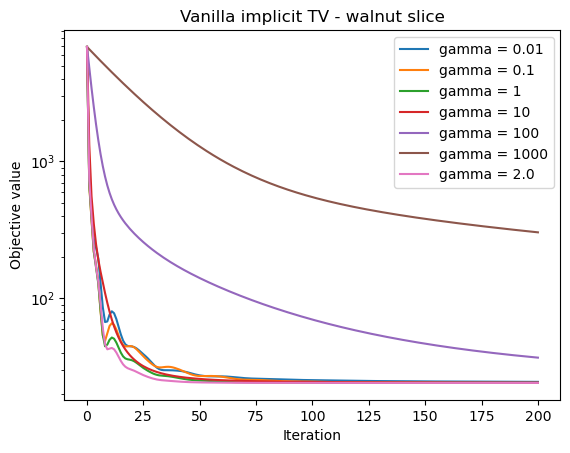

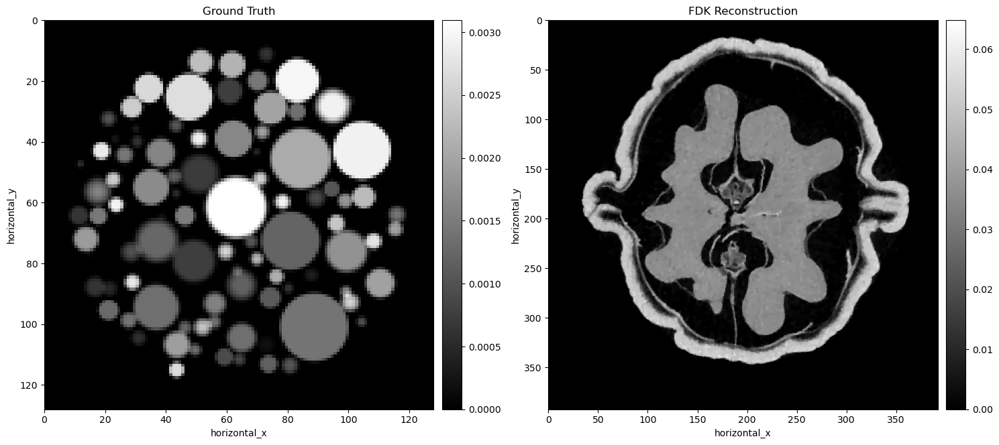

23.211261749267578
1.9196743965148926
gamma =  100
Initial step sizes: tau = 0.0004336136484029827, sigma = 4.336136484029827


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.893489
x norm =  0.89348537
self.x, self.x_old =  0.89348537 0.0
cross_term =  6.834947035501883 x_change_norm =  0.89348537 y_change_norm =  95.17051
1.0277918110053066
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0277918110053066
tau = 0.0003164164501214905, sigma = 3.164164501214905
x_tmp norm =  0.6096779
x norm =  0.6096752
self.x, self.x_old =  0.6096752 0.0
cross_term =  2.322275140237572 x_change_norm =  0.6096752 y_change_norm =  88.993355
0.7007715275293073
After possible reduction 0.0003164164501214905 3.164164501214905
2*self.d_norm < self.p_norm
After adaptive 0.006328329002429804 0.1582082250607454 0.9025
x_tmp norm =  12.790702
x norm =  12.180981
self.x, self.x_old =  12.790646 0.6096752
cross_term =  0.04474431894569593 x_change_norm =  12.180981 y_change_norm =  1.1819727
0.002117084973516941
After possible reduction 0.006328329002429804 0.1582082250607454
2*self.p_norm < self.d_norm
After adaptive 0.0006170120777369061 1.6226484621614907 0.857

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.10747593
x norm =  0.10747558
self.x, self.x_old =  0.10747558 0.0
cross_term =  0.9889618452790764 x_change_norm =  0.10747558 y_change_norm =  114.47863
1.0277918697531843
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0277918697531843
tau = 3.164164320353435e-05, sigma = 31.641643203534347
x_tmp norm =  0.07777792
x norm =  0.07777765
self.x, self.x_old =  0.07777765 0.0
cross_term =  0.3779425119370564 x_change_norm =  0.07777765 y_change_norm =  113.53072
0.7007718085381432
After possible reduction 3.164164320353435e-05 31.641643203534347
2*self.d_norm < self.p_norm
After adaptive 0.0006328328640706865 1.5820821601767188 0.9025
x_tmp norm =  1.6326133
x norm =  1.5548303
self.x, self.x_old =  1.6326078 0.07777765
cross_term =  0.0033252380250410967 x_change_norm =  1.5548303 y_change_norm =  0.6763591
0.0009659448382535875
After possible reduction 0.0006328328640706865 1.5820821601767188
2*self.d_norm < self.p_norm
After adaptive 0.0064905934776480646 0.15425

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.7587414
x norm =  4.751749
self.x, self.x_old =  4.751749 0.0
cross_term =  0.08478201283115161 x_change_norm =  4.751749 y_change_norm =  0.22201025
1.0275345112010272
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0275345112010272
tau = 0.7226034667508475, sigma = 0.00138623078328369
x_tmp norm =  2.5365546
x norm =  2.5316193
self.x, self.x_old =  2.5316193 0.0
cross_term =  0.017572546570500055 x_change_norm =  2.5316193 y_change_norm =  0.16212885
0.7003580527318627
After possible reduction 0.7226034667508475 0.00138623078328369
2*self.p_norm < self.d_norm
After adaptive 0.036130173337542405 0.027724615665673778 0.9025
x_tmp norm =  2.6177616
x norm =  0.32407582
self.x, self.x_old =  2.617353 2.5316193
cross_term =  0.005261049045668583 x_change_norm =  0.32407582 y_change_norm =  0.97941613
0.15559305188108258
After possible reduction 0.036130173337542405 0.027724615665673778
2*self.p_norm < self.d_norm
After adaptive 0.0035226919004103857 0.284355032468448

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.7657127
x norm =  4.7425623
self.x, self.x_old =  4.7425623 0.0
cross_term =  0.019333240652240086 x_change_norm =  4.7425623 y_change_norm =  0.05076227
1.0265310506576475
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0265310506576475
tau = 3.1680506507220696, sigma = 0.000316805065072207
x_tmp norm =  2.5442333
x norm =  2.5298738
self.x, self.x_old =  2.5298738 0.0
cross_term =  0.0040212151921533235 x_change_norm =  2.5298738 y_change_norm =  0.037092056
0.6996247519971341
After possible reduction 3.1680506507220696 0.000316805065072207
2*self.p_norm < self.d_norm
After adaptive 0.15840253253610362 0.006336101301444134 0.9025
x_tmp norm =  2.6102993
x norm =  0.33478516
self.x, self.x_old =  2.60884 2.5298738
cross_term =  0.0013059346791338153 x_change_norm =  0.33478516 y_change_norm =  0.23460647
0.15389651542812122
After possible reduction 0.15840253253610362 0.006336101301444134
2*self.p_norm < self.d_norm
After adaptive 0.015444246922270108 0.0649856543

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.747195
x norm =  4.7439313
self.x, self.x_old =  4.7439313 0.0
cross_term =  0.192801446306172 x_change_norm =  4.7439313 y_change_norm =  0.5056503
1.027691256989218
Multiplying step sizes by beta/b, beta = 0.75, b = 1.027691256989218
tau = 0.3164474097551352, sigma = 0.0031644740975513524
x_tmp norm =  2.5312858
x norm =  2.5289538
self.x, self.x_old =  2.5289538 0.0
cross_term =  0.03999480908351969 x_change_norm =  2.5289538 y_change_norm =  0.36945006
0.7005752110896687
After possible reduction 0.3164474097551352 0.0031644740975513524
2*self.p_norm < self.d_norm
After adaptive 0.015822370487756775 0.06328948195102699 0.9025
x_tmp norm =  2.615657
x norm =  0.31302586
self.x, self.x_old =  2.6154723 2.5289538
cross_term =  0.011090189426926265 x_change_norm =  0.31302586 y_change_norm =  2.147639
0.1556259703561075
After possible reduction 0.015822370487756775 0.06328948195102699
2*self.p_norm < self.d_norm
After adaptive 0.001542681122556286 0.6491228918054048 0.85

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  4.569634
x norm =  4.569278
self.x, self.x_old =  4.569278 0.0
cross_term =  1.7876653276543009 x_change_norm =  4.569278 y_change_norm =  4.867373
1.0277839736304264
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0277839736304264
tau = 0.031641886295765205, sigma = 0.031641886295765205
x_tmp norm =  2.4609683
x norm =  2.4607105
self.x, self.x_old =  2.4607105 0.0
cross_term =  0.37834033306028764 x_change_norm =  2.4607105 y_change_norm =  3.5921938
0.700750505026728
After possible reduction 0.031641886295765205 0.031641886295765205
2*self.p_norm < self.d_norm
After adaptive 0.0015820943147882617 0.6328377259153035 0.9025
x_tmp norm =  2.5546618
x norm =  0.21168639
self.x, self.x_old =  2.5546443 2.4607105
cross_term =  0.042454943599924716 x_change_norm =  0.21168639 y_change_norm =  13.543431
0.14808257291651697
After possible reduction 0.0015820943147882617 0.6328377259153035
2*self.p_norm < self.d_norm
After adaptive 0.00015425419569185556 6.49064334272106 0.

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  3.3257074
x norm =  3.3256707
self.x, self.x_old =  3.3256707 0.0
cross_term =  9.469382792846025 x_change_norm =  3.3256707 y_change_norm =  35.423965
1.0277912126879836
Multiplying step sizes by beta/b, beta = 0.75, b = 1.0277912126879836
tau = 0.003164166343198385, sigma = 0.31641663431983846
x_tmp norm =  1.9285703
x norm =  1.9285434
self.x, self.x_old =  1.9285434 0.0
cross_term =  2.323698484772325 x_change_norm =  1.9285434 y_change_norm =  28.150904
0.7007696003677862
After possible reduction 0.003164166343198385 0.31641663431983846
2*self.p_norm < self.d_norm
After adaptive 0.00015820831715991938 6.328332686396764 0.9025
x_tmp norm =  2.018899
x norm =  0.09617888
self.x, self.x_old =  2.0188978 1.9285434
cross_term =  0.007262697812624414 x_change_norm =  0.09617888 y_change_norm =  23.637653
0.05491937350610699
After possible reduction 0.00015820831715991938 6.328332686396764
2*self.d_norm < self.p_norm
After adaptive 0.0016226494067684033 0.6170124369236847 0

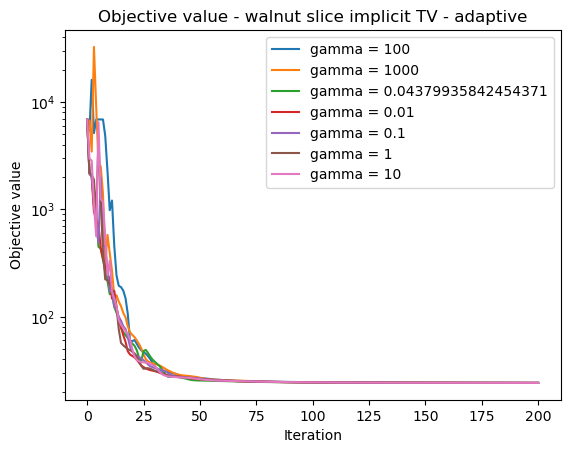

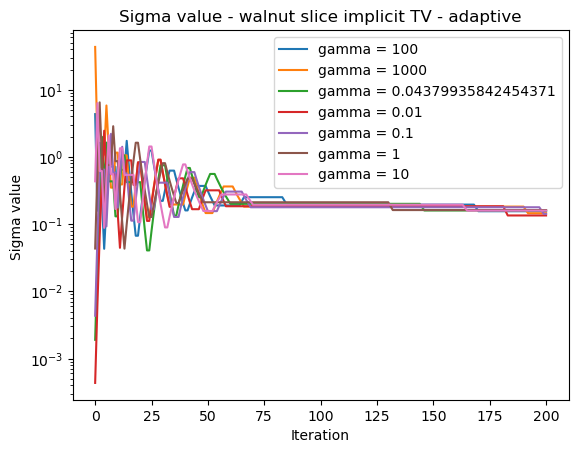

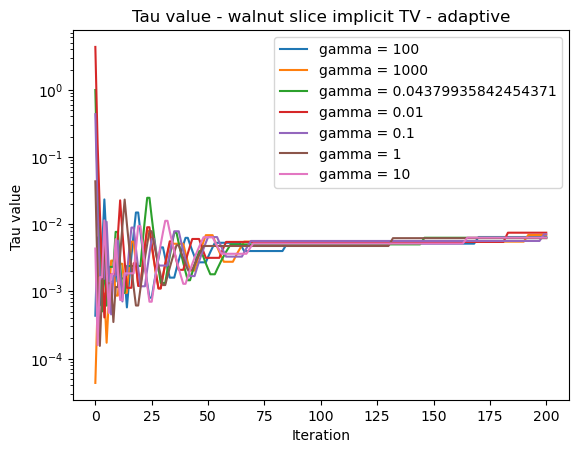

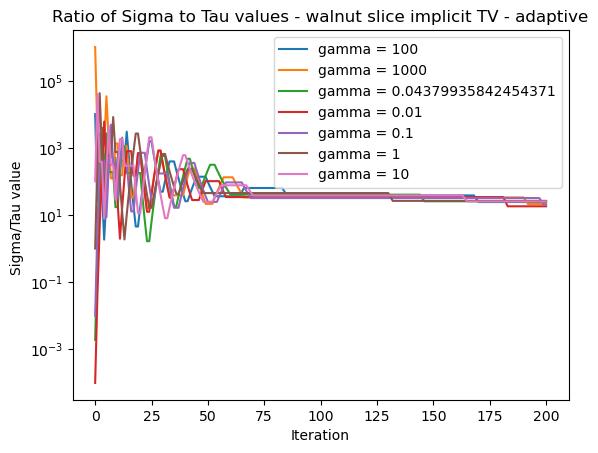

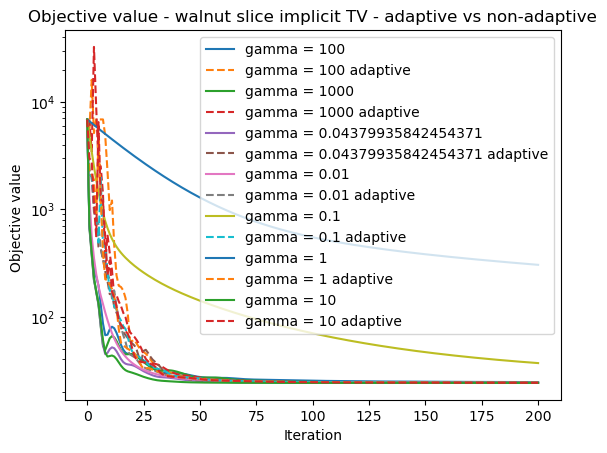

In [25]:
from cil.io import ZEISSDataReader
from cil.utilities.display import show2D, show1D, show_geometry
from cil.processors import Binner
from cil.plugins.astra.processors import FBP

filename = "/mnt/share-private/notebooks/valnut/valnut_2014-03-21_643_28/tomo-A/valnut_tomo-A.txrm"
data3D = ZEISSDataReader(file_name=filename).read()
# Get Image and Acquisition geometries
ag3D = data3D.geometry
ig3D = ag3D.get_ImageGeometry()
### Acquisition and Image geometry information
print(ag3D)
print(ig3D)
### Show Acquisition geometry and full 3D sinogram.
show_geometry(ag3D)
show2D(data3D, slice_list = [('vertical',512), ('angle',800), ('horizontal',512)], cmap="inferno", num_cols=3, size=(15,15))


# Extract vertical slice
data2D = data3D.get_slice(vertical='centre')

# delete the 3D data to save memory
del data3D

# reorder data to match default order for Astra/Tigre operator
data2D.reorder('astra')

# Select every 10 angles
sliced_data = Slicer(roi={'angle':(0,1600,10)})(data2D)

# Reduce background regions
binned_data = Binner(roi={'horizontal':(120,-120,2)})(sliced_data)

# Create absorption data 
absorption_data = TransmissionAbsorptionConverter()(binned_data) 

# Remove circular artifacts
absorption_data -= np.mean(absorption_data.as_array()[80:100,0:30])
# Get Image and Acquisition geometries for one slice
ag2D = absorption_data.geometry
ag2D.set_angles(ag2D.angles, initial_angle=0.2, angle_unit='radian')
ig2D = ag2D.get_ImageGeometry()
print(" Acquisition Geometry 2D: {} with labels {}".format(ag2D.shape, ag2D.dimension_labels))
print(" Image Geometry 2D: {} with labels {}".format(ig2D.shape, ig2D.dimension_labels))
#

# Setup and run the FBP algorithm
fbp_recon = FBP(ig2D, ag2D,  device = 'gpu')(absorption_data)



# Show reconstructions
show2D([fbp_recon], 
       title = ['FBP reconstruction'], 
       cmap = 'inferno', fix_range=(0,0.05))

A = ProjectionOperator(ig2D, ag2D, device = "gpu")
alpha_tv = 0.0003
f1 =  MixedL21Norm()
f2 = 0.5 * L2NormSquared(b=absorption_data)
F = BlockFunction(f1, f2)

# Define BlockOperator K
Grad = alpha_tv * GradientOperator(ig2D)
K = BlockOperator(Grad, A)

# Define Function G
G = IndicatorBox(lower=0)



gamma_list =  [ 100, 1000,  1/A.norm(), 0.01, 0.1, 1, 10]
rho=0.99
results_adaptive = []
objective_adaptive = []
sigma_values = []
tau_values = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/A.norm()
    tau =(rho/gamma)/A.norm() 
    pdhg_tv_explicit = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau, adaptive=True)#, eta=.95, initial=[recon, None]) 
    callback=SaveStepSizes()
    pdhg_tv_explicit.run(200, verbose=1, callbacks=[ProgressCallback(), callback])
    results_adaptive.append(pdhg_tv_explicit.solution)
    objective_adaptive.append(pdhg_tv_explicit.objective)
    sigma_values.append(callback.sigma)
    tau_values.append(callback.tau)
    

show2D([ground_truth, pdhg_tv_explicit.solution], title = ['Ground Truth', 'PDHG Reconstruction'], origin = 'upper', num_cols = 2);
plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective value - walnut slice implicit TV - adaptive')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), sigma_values[i], label='gamma = ' + str(gamma))
plt.title('Sigma value - walnut slice explicit TV - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Sigma value')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), tau_values[i], label='gamma = ' + str(gamma))
plt.title('Tau value - walnut slice explicit TV - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Tau value')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    #plt the ratio of sigma to tau
    plt.plot(range(0, 201, 1), np.array(sigma_values[i])/np.array(tau_values[i]), label='gamma = ' + str(gamma))
plt.title('Ratio of Sigma to Tau values - walnut slice explicit TV - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Sigma/Tau value ')
plt.yscale('log')
plt.legend()
plt.show()



gamma_list = [0.01, 0.1, 1, 10, 100, 1000, 1/alpha]
results_vanilla = []
objective_vanilla = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/A.norm()
    tau =(rho/gamma)/A.norm() 
    pdhg_tv_explicit = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau)
    pdhg_tv_explicit.run(200, verbose=1)
    results_vanilla.append(pdhg_tv_explicit.solution)
    objective_vanilla.append(pdhg_tv_explicit.objective)
    
show2D([ground_truth, pdhg_tv_explicit.solution], title = ['Ground Truth', 'FDK Reconstruction'], origin = 'upper', num_cols = 2);
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma)+' adaptive', linestyle='dashed')
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective value - walnut slice explicit TV - adaptive vs non-adaptive')
plt.legend()
plt.show()




# PDHG with Implicit TV - adaptive vs non-adaptive
# Vanilla TV with reg parameter in front of Mixed L21 Norm

F = 0.5 * L2NormSquared(b=absorption_data)
G = (alpha_tv/ig2D.voxel_size_y) * FGP_TV(max_iteration=100, device='gpu', nonnegativity=True)
K = A



gamma_list = [0.01, 0.1, 1, 10, 100, 1000, 1/alpha]
results_vanilla = []
objective_vanilla = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/K.norm()
    tau =(rho/gamma)/K.norm() 
    pdhg_tv_implicit = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau)
    pdhg_tv_implicit.run(200, verbose=1)
    results_vanilla.append(pdhg_tv_implicit.solution)
    objective_vanilla.append(pdhg_tv_implicit.objective)



    
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.legend()
plt.title('Vanilla implicit TV - walnut slice')
plt.show()

show2D([ground_truth, pdhg_tv_implicit.solution], title = ['Ground Truth', 'FDK Reconstruction'], origin = 'upper', num_cols = 2);

print( F(K.direct(pdhg_tv_implicit.solution)) )
print( G(pdhg_tv_explicit.solution) )



gamma_list =  [ 100, 1000,  1/A.norm(), 0.01, 0.1, 1, 10]
results_adaptive = []
objective_adaptive = []
sigma_values = []
tau_values = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/A.norm()
    tau =(rho/gamma)/A.norm() 
    pdhg_tv_implicit_adaptive = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau, adaptive=True)#, eta=.95, initial=[recon, None]) 
    callback=SaveStepSizes()
    pdhg_tv_implicit_adaptive.run(200, verbose=1, callbacks=[ProgressCallback(), callback])
    results_adaptive.append(pdhg_tv_implicit_adaptive.solution)
    objective_adaptive.append(pdhg_tv_implicit_adaptive.objective)
    sigma_values.append(callback.sigma)
    tau_values.append(callback.tau)
    
plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective value - walnut slice implicit TV - adaptive')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), sigma_values[i], label='gamma = ' + str(gamma))
plt.title('Sigma value - walnut slice implicit TV - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Sigma value ')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), tau_values[i], label='gamma = ' + str(gamma))
plt.title('Tau value - walnut slice implicit TV - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Tau value ')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    #plt the ratio of sigma to tau
    plt.plot(range(0, 201, 1), np.array(sigma_values[i])/np.array(tau_values[i]), label='gamma = ' + str(gamma))
plt.title('Ratio of Sigma to Tau values - walnut slice implicit TV - adaptive')
plt.xlabel('Iteration')
plt.ylabel('Sigma/Tau value ')
plt.yscale('log')
plt.legend()
plt.show()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma)+' adaptive', linestyle='dashed')
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value ')
plt.title('Objective value - walnut slice implicit TV - adaptive vs non-adaptive')
plt.legend()
plt.show()

3D Cone-beam tomography
System configuration:
	Source position: [   0.        , -105.05081177,    0.        ]
	Rotation axis position: [0., 0., 0.]
	Rotation axis direction: [0., 0., 1.]
	Detector position: [ 0.        , 45.08757401,  0.        ]
	Detector direction x: [1., 0., 0.]
	Detector direction y: [0., 0., 1.]
Panel configuration:
	Number of pixels: [1024 1024]
	Pixel size: [0.0658543 0.0658543]
	Pixel origin: bottom-left
Channel configuration:
	Number of channels: 1
Acquisition description:
	Number of positions: 1601
	Angles 0-9 in radians: [-3.1415665, -3.1377017, -3.1337626, -3.1298182, -3.125836 , -3.1219127,
 -3.1180956, -3.1140666, -3.1101887, -3.1062822]
	Angles 1591-1600 in radians: [3.106215 , 3.1101599, 3.1141102, 3.117992 , 3.12194  , 3.1258695,
 3.1298053, 3.1337383, 3.1376445, 3.1415997]
	Full angular array can be accessed with acquisition_data.geometry.angles
Distances in units: units distance
Number of channels: 1
channel_spacing: 1.0
voxel_num : x1024,y1024,z1024

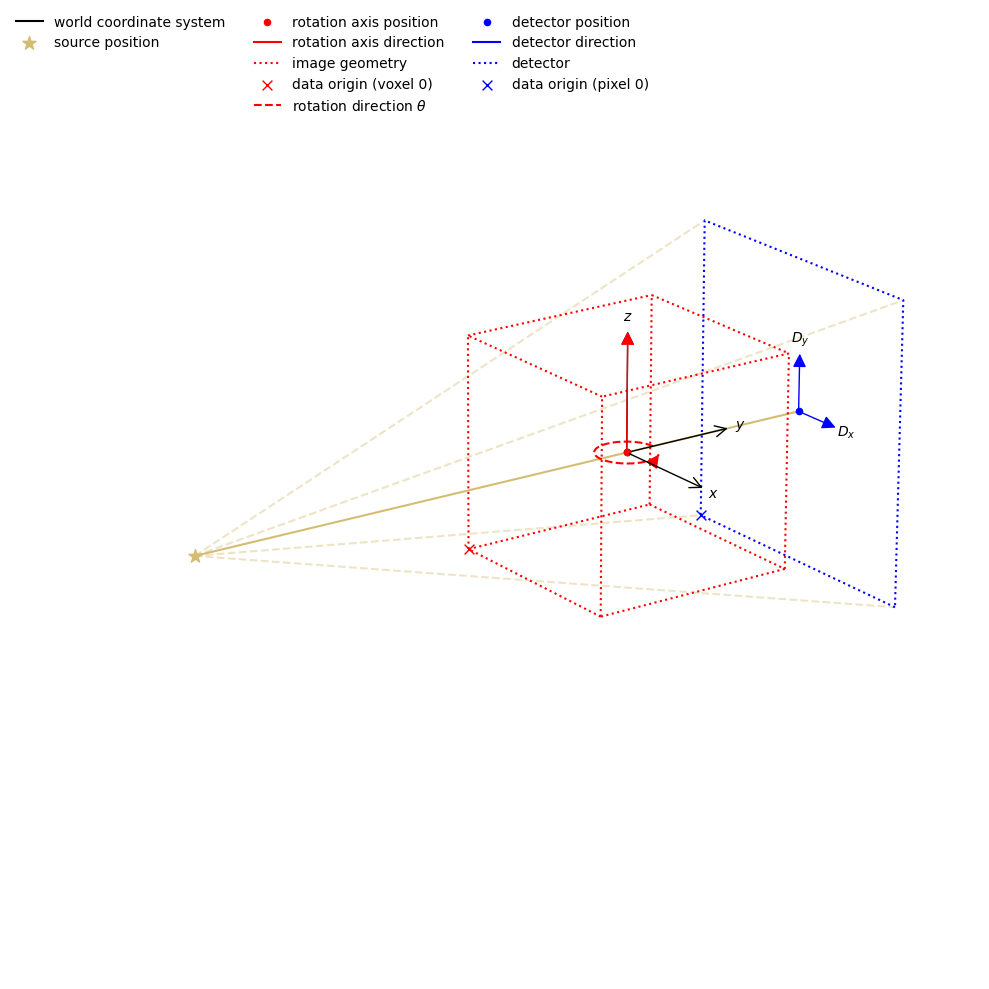

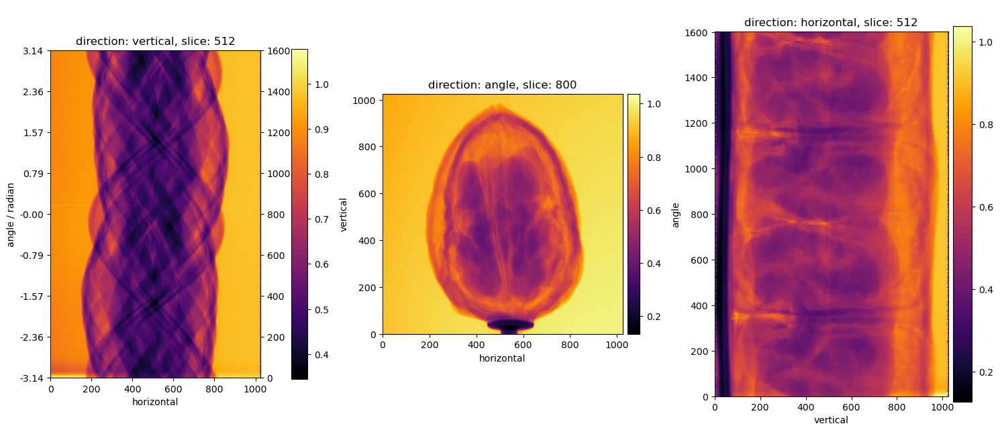

New geometry:  2D Cone-beam tomography
System configuration:
	Source position: [   0.        , -105.05081177]
	Rotation axis position: [0., 0.]
	Detector position: [ 0.        , 45.08757401]
	Detector direction x: [1., 0.]
Panel configuration:
	Number of pixels: [1024    1]
	Pixel size: [0.0658543 0.0658543]
	Pixel origin: bottom-left
Channel configuration:
	Number of channels: 1
Acquisition description:
	Number of positions: 160
	Angles 0-9 in radians: [-3.1415665, -3.1022923, -3.0630562, -3.0237632, -2.9845278, -2.945264 ,
 -2.9060063, -2.866688 , -2.8274012, -2.78817  ]
	Angles 150-159 in radians: [2.748842 , 2.7881632, 2.8274217, 2.866726 , 2.9059432, 2.9452505,
 2.9844823, 3.0237305, 3.0630383, 3.1023333]
	Full angular array can be accessed with acquisition_data.geometry.angles
Distances in units: units distance
Shape out:  (160, 1024)
New geometry shape:  (160, 1024)
New geometry:  2D Cone-beam tomography
System configuration:
	Source position: [   0.        , -105.05081177]
	Rot

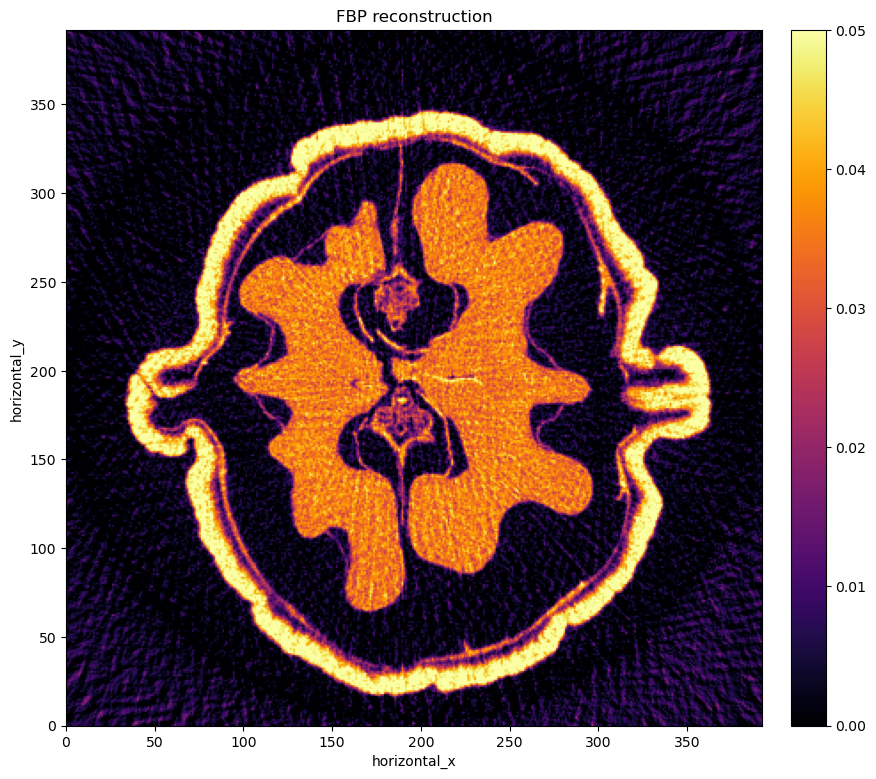

gamma =  0.01
Initial step sizes: tau = 21.899681041785364, sigma = 0.0021899681041785365


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  121.34888
x norm =  121.34888
self.x, self.x_old =  121.34888 0.0
cross_term =  63.67441109814488 x_change_norm =  121.34888 y_change_norm =  0.2559258
2.100454767945285
Multiplying step sizes by beta/b, beta = 0.75, b = 2.100454767945285
tau = 7.819621270590899, sigma = 0.0007819621270590899
x_tmp norm =  15.493238
x norm =  15.493238
self.x, self.x_old =  15.493238 0.0
cross_term =  0.370617360180128 x_change_norm =  15.493238 y_change_norm =  0.09151086
1.6264612960485647
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6264612960485647
tau = 3.6058134104951116, sigma = 0.0003605813410495112
x_tmp norm =  3.2957952
x norm =  3.2957952
self.x, self.x_old =  3.2957952 0.0
cross_term =  0.00773355656031823 x_change_norm =  3.2957952 y_change_norm =  0.04221561
0.8307993405148589
After possible reduction 3.6058134104951116 0.0003605813410495112
2*self.p_norm < self.d_norm
After adaptive 0.18029067052475575 0.007211626820990217 0.9025
x_tmp norm =  2.442258
x norm =  1.

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  119.008385
x norm =  119.008385
self.x, self.x_old =  119.008385 0.0
cross_term =  612.4188387707984 x_change_norm =  119.008385 y_change_norm =  2.509897
2.1004547894956027
Multiplying step sizes by beta/b, beta = 0.75, b = 2.1004547894956027
tau = 0.7819621190362882, sigma = 0.007819621190362882
x_tmp norm =  15.385046
x norm =  15.385046
self.x, self.x_old =  15.385046 0.0
cross_term =  3.6545931763194925 x_change_norm =  15.385046 y_change_norm =  0.90871835
1.6264615495876462
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6264615495876462
tau = 0.3605812811412008, sigma = 0.003605812811412008
x_tmp norm =  3.2851362
x norm =  3.2851362
self.x, self.x_old =  3.2851362 0.0
cross_term =  0.07683616975355582 x_change_norm =  3.2851362 y_change_norm =  0.42079097
0.8307993113959619
After possible reduction 0.3605812811412008 0.003605812811412008
2*self.p_norm < self.d_norm
After adaptive 0.018029064057060055 0.0721162562282401 0.9025
x_tmp norm =  2.4909883
x norm =

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  99.76616
x norm =  99.76616
self.x, self.x_old =  99.76616 0.0
cross_term =  4303.877910016448 x_change_norm =  99.76616 y_change_norm =  21.04077
2.1004548622499386
Multiplying step sizes by beta/b, beta = 0.75, b = 2.1004548622499386
tau = 0.07819620919511384, sigma = 0.07819620919511384
x_tmp norm =  14.380827
x norm =  14.380827
self.x, self.x_old =  14.380827 0.0
cross_term =  31.93075002486038 x_change_norm =  14.380827 y_change_norm =  8.49404
1.6264616060115422
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6264616060115422
tau = 0.036058125614260084, sigma = 0.036058125614260084
x_tmp norm =  3.1822362
x norm =  3.1822362
self.x, self.x_old =  3.1822362 0.0
cross_term =  0.7209805096129909 x_change_norm =  3.1822362 y_change_norm =  4.0761056
0.8307989441685791
After possible reduction 0.036058125614260084 0.036058125614260084
2*self.p_norm < self.d_norm
After adaptive 0.0018029062807130057 0.721162512285201 0.9025
x_tmp norm =  2.7485008
x norm =  0.545972

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  38.124092
x norm =  38.124092
self.x, self.x_old =  38.124092 0.0
cross_term =  6284.814090490766 x_change_norm =  38.124092 y_change_norm =  80.40404
2.100454760442543
Multiplying step sizes by beta/b, beta = 0.75, b = 2.100454760442543
tau = 0.00781962129852228, sigma = 0.781962129852228
x_tmp norm =  8.701282
x norm =  8.701282
self.x, self.x_old =  8.701282 0.0
cross_term =  116.8981871223087 x_change_norm =  8.701282 y_change_norm =  51.394142
1.6264613147831994
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6264613147831994
tau = 0.0036058133818408417, sigma = 0.36058133818408417
x_tmp norm =  2.4232166
x norm =  2.4232166
self.x, self.x_old =  2.4232166 0.0
cross_term =  4.180645406164875 x_change_norm =  2.4232166 y_change_norm =  31.038815
0.8307993619160621
After possible reduction 0.0036058133818408417 0.36058133818408417
2*self.p_norm < self.d_norm
After adaptive 0.00018029066909204224 7.211626763681677 0.9025
x_tmp norm =  2.44749
x norm =  0.054564405


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  5.3107567
x norm =  5.3107567
self.x, self.x_old =  5.3107567 0.0
cross_term =  1219.5686781915144 x_change_norm =  5.3107567 y_change_norm =  112.00432
2.1004549380380313
Multiplying step sizes by beta/b, beta = 0.75, b = 2.1004549380380313
tau = 0.0007819620637365768, sigma = 7.819620637365767
x_tmp norm =  1.7580519
x norm =  1.7580519
self.x, self.x_old =  1.7580519 0.0
cross_term =  47.72047029343106 x_change_norm =  1.7580519 y_change_norm =  103.83939
1.6264613830276857
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6264613830276857
tau = 0.0003605812925669995, sigma = 3.6058129256699947
x_tmp norm =  0.7158308
x norm =  0.7158308
self.x, self.x_old =  0.7158308 0.0
cross_term =  3.6482072413748803 x_change_norm =  0.7158308 y_change_norm =  91.69028
0.8307991917594947
After possible reduction 0.0003605812925669995 3.6058129256699947
2*self.d_norm < self.p_norm
After adaptive 0.007211625851339984 0.1802906462834999 0.9025
x_tmp norm =  14.832651
x norm =  14.

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.5528018
x norm =  0.5528018
self.x, self.x_old =  0.5528018 0.0
cross_term =  132.13938469649713 x_change_norm =  0.5528018 y_change_norm =  116.58637
2.1004546961714454
Multiplying step sizes by beta/b, beta = 0.75, b = 2.1004546961714454
tau = 7.819621537792208e-05, sigma = 78.19621537792209
x_tmp norm =  0.19578403
x norm =  0.19578403
self.x, self.x_old =  0.19578403 0.0
cross_term =  5.918284446017579 x_change_norm =  0.19578403 y_change_norm =  115.6399
1.6264610512862885
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6264610512862885
tau = 3.605814076338341e-05, sigma = 36.05814076338341
x_tmp norm =  0.08896788
x norm =  0.08896788
self.x, self.x_old =  0.08896788 0.0
cross_term =  0.5635408940269852 x_change_norm =  0.08896788 y_change_norm =  113.95833
0.8307995049456033
After possible reduction 3.605814076338341e-05 36.05814076338341
2*self.d_norm < self.p_norm
After adaptive 0.0007211628152676676 1.8029070381691723 0.9025
x_tmp norm =  1.8578588
x norm

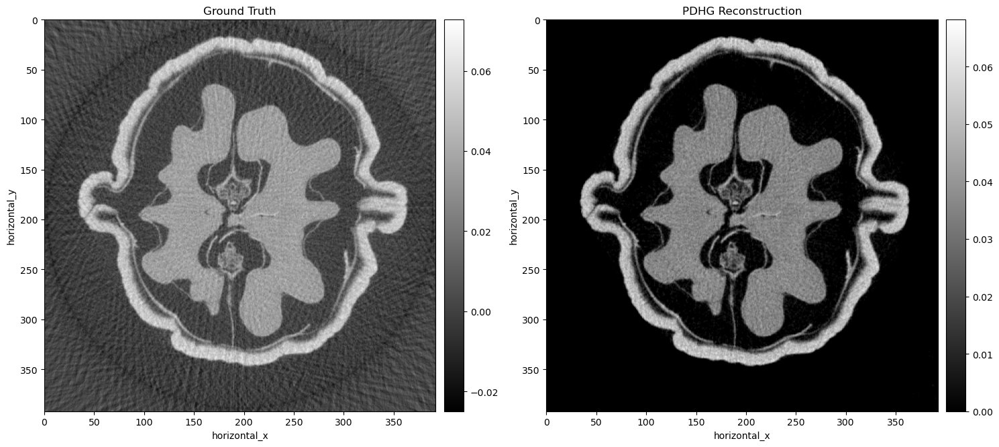

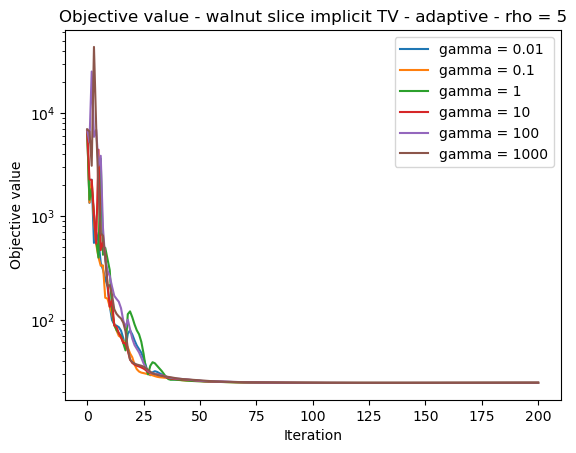

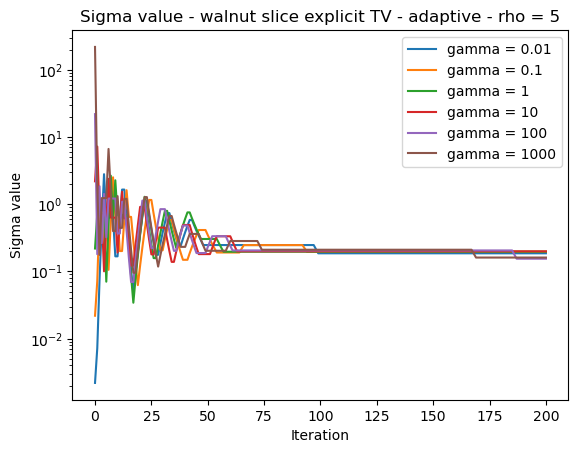

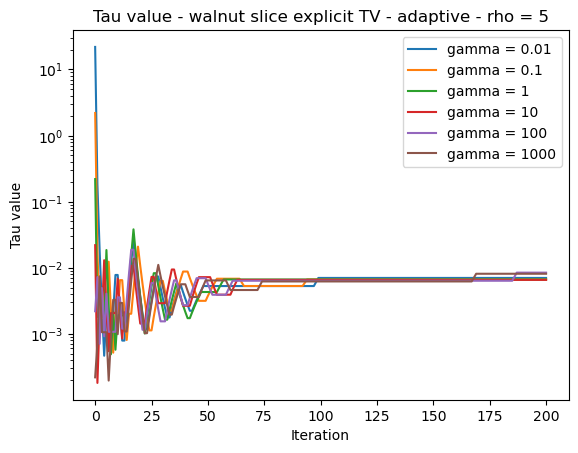

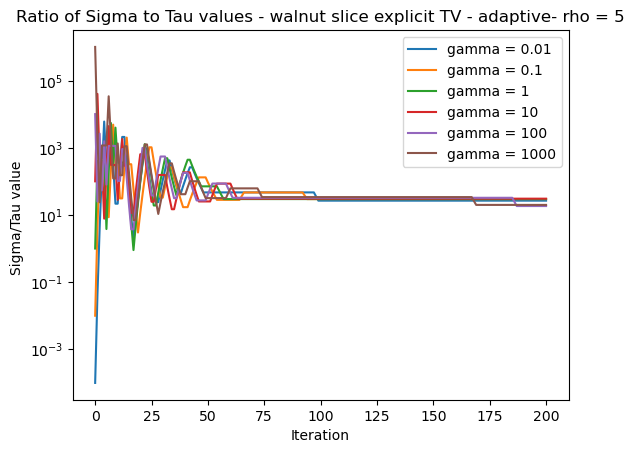

gamma =  0.01
Initial step sizes: tau = 21.899681041785364, sigma = 0.0021899681041785365


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  121.34888
x norm =  121.34888
x_tmp norm =  5625.7915
x norm =  121.34888
x_tmp norm =  2620.1543
x norm =  0.0
x_tmp norm =  2494.3545
x norm =  0.0
x_tmp norm =  2368.9602
x norm =  0.0
x_tmp norm =  2243.9905
x norm =  0.0
x_tmp norm =  2119.4705
x norm =  0.0
x_tmp norm =  1995.4318
x norm =  0.0
x_tmp norm =  1871.9135
x norm =  0.0
x_tmp norm =  1748.9658
x norm =  0.0
x_tmp norm =  1626.6549
x norm =  0.0
x_tmp norm =  1505.0663
x norm =  0.0
x_tmp norm =  1384.3162
x norm =  0.0
x_tmp norm =  1264.5636
x norm =  0.0
x_tmp norm =  1146.0317
x norm =  0.0
x_tmp norm =  1029.0444
x norm =  0.0
x_tmp norm =  914.0838
x norm =  0.0
x_tmp norm =  801.8966
x norm =  0.0
x_tmp norm =  693.68524
x norm =  0.0
x_tmp norm =  591.467
x norm =  0.0
x_tmp norm =  498.7404
x norm =  16.999617
x_tmp norm =  569.68085
x norm =  16.999617
x_tmp norm =  404.7386
x norm =  44.038074
x_tmp norm =  1077.5405
x norm =  44.038074
x_tmp norm =  547.22577
x norm =  0.0
x_tmp norm =  449.46

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  119.008385
x norm =  119.008385
x_tmp norm =  5406.3223
x norm =  119.008385
x_tmp norm =  2409.21
x norm =  0.0
x_tmp norm =  2239.841
x norm =  0.0
x_tmp norm =  2074.2454
x norm =  0.0
x_tmp norm =  1912.3715
x norm =  0.0
x_tmp norm =  1754.1776
x norm =  0.0
x_tmp norm =  1599.6372
x norm =  0.0
x_tmp norm =  1448.7404
x norm =  0.0
x_tmp norm =  1301.5059
x norm =  0.0
x_tmp norm =  1157.9935
x norm =  0.0
x_tmp norm =  1018.3295
x norm =  0.0
x_tmp norm =  882.74945
x norm =  0.0
x_tmp norm =  751.68536
x norm =  0.0
x_tmp norm =  625.942
x norm =  0.0
x_tmp norm =  507.09195
x norm =  0.0
x_tmp norm =  398.426
x norm =  0.08840672
x_tmp norm =  307.30325
x norm =  36.755142
x_tmp norm =  791.70087
x norm =  36.761925
x_tmp norm =  347.38016
x norm =  0.9219658
x_tmp norm =  253.63004
x norm =  23.043133
x_tmp norm =  446.7304
x norm =  23.342087
x_tmp norm =  217.38281
x norm =  47.277466
x_tmp norm =  1234.3296
x norm =  47.277466
x_tmp norm =  494.83292
x norm =

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  99.76616
x norm =  99.76616
x_tmp norm =  3767.4084
x norm =  99.76616
x_tmp norm =  1049.8958
x norm =  0.0
x_tmp norm =  762.8448
x norm =  0.0
x_tmp norm =  527.8192
x norm =  0.0
x_tmp norm =  335.97598
x norm =  0.0
x_tmp norm =  181.33232
x norm =  0.0
x_tmp norm =  70.02454
x norm =  12.682842
x_tmp norm =  161.19347
x norm =  12.682842
x_tmp norm =  89.7291
x norm =  89.71101
x_tmp norm =  2981.8242
x norm =  89.71101
x_tmp norm =  799.023
x norm =  0.0
x_tmp norm =  556.3047
x norm =  0.0
x_tmp norm =  357.493
x norm =  0.0
x_tmp norm =  195.2304
x norm =  0.0
x_tmp norm =  66.9408
x norm =  0.0037103621
x_tmp norm =  61.383793
x norm =  61.380257
x_tmp norm =  1836.1897
x norm =  61.380302
x_tmp norm =  434.4104
x norm =  0.0
x_tmp norm =  257.22287
x norm =  0.0
x_tmp norm =  112.86966
x norm =  0.0
x_tmp norm =  24.8159
x norm =  22.485636
x_tmp norm =  442.7755
x norm =  22.485636
x_tmp norm =  29.076702
x norm =  24.65349
x_tmp norm =  531.51135
x norm =  24

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  38.124092
x norm =  38.124092
x_tmp norm =  503.49136
x norm =  38.124092
x_tmp norm =  163.7528
x norm =  163.7528
x_tmp norm =  2308.243
x norm =  163.7528
x_tmp norm =  543.28424
x norm =  543.28424
x_tmp norm =  7761.858
x norm =  543.28424
x_tmp norm =  1690.6743
x norm =  1690.6743
x_tmp norm =  24241.832
x norm =  1690.6743
x_tmp norm =  5158.2993
x norm =  5158.2993
x_tmp norm =  74040.945
x norm =  5158.2993
x_tmp norm =  15636.9795
x norm =  15636.9795
x_tmp norm =  224522.77
x norm =  15636.9795
x_tmp norm =  47301.332
x norm =  47301.332
x_tmp norm =  679244.56
x norm =  47301.332
x_tmp norm =  142983.83
x norm =  142983.83
x_tmp norm =  2053309.1
x norm =  142983.83
x_tmp norm =  432114.44
x norm =  432114.44
x_tmp norm =  6205416.5
x norm =  432114.44
x_tmp norm =  1305800.8
x norm =  1305800.8
x_tmp norm =  18752132.0
x norm =  1305800.8
x_tmp norm =  3945879.5
x norm =  3945879.5
x_tmp norm =  56665412.0
x norm =  3945879.5
x_tmp norm =  11923590.0
x norm 

/home/bih17925/miniconda3/envs/margaret_dev/lib/python3.12/site-packages/cil/framework/data_container.py:497: RuntimeWarning: overflow encountered in multiply
  out = pwop(self.as_array() , x2.as_array() , *args, **kwargs )
/home/bih17925/miniconda3/envs/margaret_dev/lib/python3.12/site-packages/cil/framework/data_container.py:497: RuntimeWarning: overflow encountered in add
  out = pwop(self.as_array() , x2.as_array() , *args, **kwargs )


x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp no

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  5.3107567
x norm =  5.3107567
x_tmp norm =  1.5170356
x norm =  5.0292416
x_tmp norm =  10.488249
x norm =  10.205442
x_tmp norm =  6.583428
x norm =  10.488249
x_tmp norm =  15.927505
x norm =  15.927505
x_tmp norm =  12.96479
x norm =  15.927505
x_tmp norm =  21.366598
x norm =  21.366598
x_tmp norm =  19.149666
x norm =  21.366598
x_tmp norm =  26.801487
x norm =  26.801487
x_tmp norm =  25.337923
x norm =  26.801487
x_tmp norm =  32.22934
x norm =  32.22934
x_tmp norm =  31.52106
x norm =  32.22934
x_tmp norm =  37.649128
x norm =  37.649128
x_tmp norm =  37.69632
x norm =  37.649128
x_tmp norm =  43.06037
x norm =  43.06037
x_tmp norm =  43.862534
x norm =  43.06037
x_tmp norm =  48.462826
x norm =  48.462826
x_tmp norm =  50.019127
x norm =  48.462826
x_tmp norm =  53.856346
x norm =  53.856346
x_tmp norm =  56.165783
x norm =  53.856346
x_tmp norm =  59.24084
x norm =  59.24084
x_tmp norm =  62.302326
x norm =  59.24084
x_tmp norm =  64.616264
x norm =  64.616264
x

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.5528018
x norm =  0.5528018
x_tmp norm =  0.9849632
x norm =  0.43231583
x_tmp norm =  1.3824615
x norm =  0.39764473
x_tmp norm =  1.739925
x norm =  0.3576999
x_tmp norm =  2.062522
x norm =  0.32295075
x_tmp norm =  2.3536868
x norm =  0.29167333
x_tmp norm =  2.6166515
x norm =  0.2636647
x_tmp norm =  2.8542995
x norm =  0.23857944
x_tmp norm =  3.0692239
x norm =  0.2161268
x_tmp norm =  3.2637503
x norm =  0.19604279
x_tmp norm =  3.43997
x norm =  0.1780902
x_tmp norm =  3.599757
x norm =  0.16205533
x_tmp norm =  3.744794
x norm =  0.14774571
x_tmp norm =  3.8765924
x norm =  0.13498752
x_tmp norm =  3.9965076
x norm =  0.12362385
x_tmp norm =  4.1057553
x norm =  0.113512695
x_tmp norm =  4.2054257
x norm =  0.104525454
x_tmp norm =  4.2964983
x norm =  0.09654537
x_tmp norm =  4.3798494
x norm =  0.08946642
x_tmp norm =  4.4562683
x norm =  0.08319223
x_tmp norm =  4.526458
x norm =  0.07763481
x_tmp norm =  4.591052
x norm =  0.07271441
x_tmp norm =  4.65061

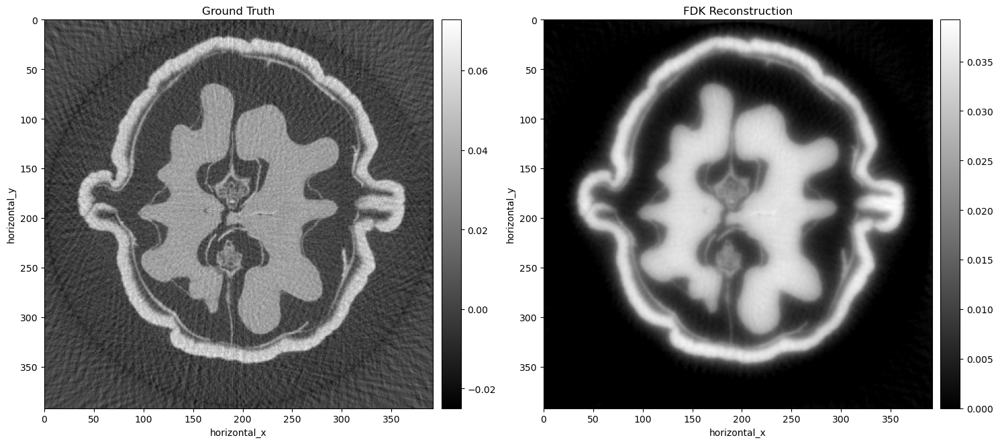

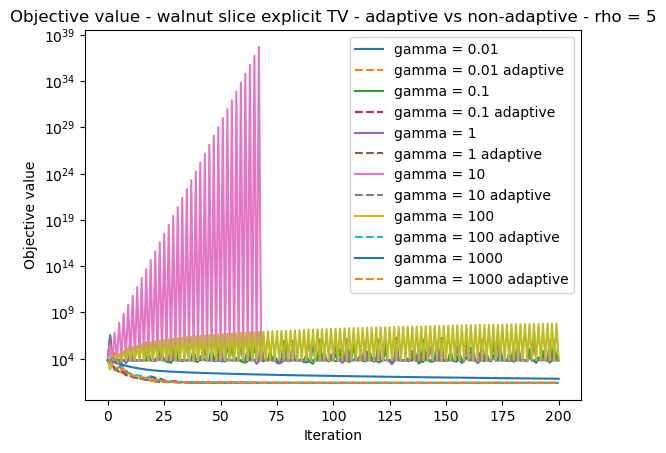

gamma =  0.01
Initial step sizes: tau = 21.899681041785364, sigma = 0.0021899681041785365


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  121.34888
x norm =  121.19213
x_tmp norm =  5621.6787
x norm =  121.19213
x_tmp norm =  2618.08
x norm =  0.0
x_tmp norm =  2492.2961
x norm =  0.0
x_tmp norm =  2366.9187
x norm =  0.0
x_tmp norm =  2241.9673
x norm =  0.0
x_tmp norm =  2117.4675
x norm =  0.0
x_tmp norm =  1993.4507
x norm =  0.0
x_tmp norm =  1869.9574
x norm =  0.0
x_tmp norm =  1747.0377
x norm =  0.0
x_tmp norm =  1624.7579
x norm =  0.0
x_tmp norm =  1503.2057
x norm =  0.0
x_tmp norm =  1382.4982
x norm =  0.0
x_tmp norm =  1262.796
x norm =  0.0
x_tmp norm =  1144.3256
x norm =  0.0
x_tmp norm =  1027.4144
x norm =  0.0
x_tmp norm =  912.551
x norm =  0.0
x_tmp norm =  800.4917
x norm =  0.0
x_tmp norm =  692.4544
x norm =  0.0
x_tmp norm =  590.4816
x norm =  0.0
x_tmp norm =  498.1118
x norm =  18.060343
x_tmp norm =  584.0485
x norm =  18.060343
x_tmp norm =  409.15747
x norm =  38.917107
x_tmp norm =  946.6591
x norm =  38.917107
x_tmp norm =  495.78467
x norm =  0.0
x_tmp norm =  405.87436
x

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  119.008385
x norm =  118.99072
x_tmp norm =  5405.9136
x norm =  118.99072
x_tmp norm =  2409.012
x norm =  0.0
x_tmp norm =  2239.6482
x norm =  0.0
x_tmp norm =  2074.0576
x norm =  0.0
x_tmp norm =  1912.189
x norm =  0.0
x_tmp norm =  1754.0011
x norm =  0.0
x_tmp norm =  1599.4658
x norm =  0.0
x_tmp norm =  1448.575
x norm =  0.0
x_tmp norm =  1301.3463
x norm =  0.0
x_tmp norm =  1157.8407
x norm =  0.0
x_tmp norm =  1018.1833
x norm =  0.0
x_tmp norm =  882.6114
x norm =  0.0
x_tmp norm =  751.5568
x norm =  0.0
x_tmp norm =  625.8257
x norm =  0.0
x_tmp norm =  506.9927
x norm =  0.0
x_tmp norm =  398.3525
x norm =  0.06511697
x_tmp norm =  307.262
x norm =  36.84529
x_tmp norm =  793.4392
x norm =  36.85002
x_tmp norm =  348.03076
x norm =  0.8512212
x_tmp norm =  253.98575
x norm =  22.901653
x_tmp norm =  443.79303
x norm =  23.176668
x_tmp norm =  216.78177
x norm =  47.99229
x_tmp norm =  1256.196
x norm =  47.99229
x_tmp norm =  504.39435
x norm =  0.0
x_tm

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  99.76616
x norm =  99.764305
x_tmp norm =  3767.3745
x norm =  99.764305
x_tmp norm =  1049.8848
x norm =  0.0
x_tmp norm =  762.836
x norm =  0.0
x_tmp norm =  527.8122
x norm =  0.0
x_tmp norm =  335.9705
x norm =  0.0
x_tmp norm =  181.32845
x norm =  0.0
x_tmp norm =  70.02411
x norm =  12.679391
x_tmp norm =  161.09317
x norm =  12.679391
x_tmp norm =  89.7641
x norm =  89.73937
x_tmp norm =  2983.142
x norm =  89.73937
x_tmp norm =  799.4416
x norm =  0.0
x_tmp norm =  556.64825
x norm =  0.0
x_tmp norm =  357.77484
x norm =  0.0
x_tmp norm =  195.4606
x norm =  0.0
x_tmp norm =  67.1127
x norm =  0.0
x_tmp norm =  61.26034
x norm =  61.247097
x_tmp norm =  1830.2198
x norm =  61.247097
x_tmp norm =  432.5111
x norm =  0.0
x_tmp norm =  255.66615
x norm =  0.0
x_tmp norm =  111.60758
x norm =  0.0
x_tmp norm =  25.170319
x norm =  23.117939
x_tmp norm =  465.5112
x norm =  23.117939
x_tmp norm =  28.336277
x norm =  20.257143
x_tmp norm =  393.65527
x norm =  20.257

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  38.124092
x norm =  38.123905
x_tmp norm =  503.49014
x norm =  38.123905
x_tmp norm =  163.75255
x norm =  163.75244
x_tmp norm =  2308.2378
x norm =  163.75244
x_tmp norm =  543.28326
x norm =  543.28314
x_tmp norm =  7761.842
x norm =  543.28314
x_tmp norm =  1690.6709
x norm =  1690.6709
x_tmp norm =  24241.785
x norm =  1690.6709
x_tmp norm =  5158.289
x norm =  5158.289
x_tmp norm =  74040.805
x norm =  5158.289
x_tmp norm =  15636.947
x norm =  15636.947
x_tmp norm =  224522.31
x norm =  15636.947
x_tmp norm =  47301.234
x norm =  47301.24
x_tmp norm =  679243.2
x norm =  47301.24
x_tmp norm =  142983.55
x norm =  142983.55
x_tmp norm =  2053305.0
x norm =  142983.55
x_tmp norm =  432113.6
x norm =  432113.6
x_tmp norm =  6205404.0
x norm =  432113.6
x_tmp norm =  1305798.1
x norm =  1305798.1
x_tmp norm =  18752094.0
x norm =  1305798.1
x_tmp norm =  3945871.5
x norm =  3945871.5
x_tmp norm =  56665304.0
x norm =  3945871.5
x_tmp norm =  11923566.0
x norm =  11923

/home/bih17925/miniconda3/envs/margaret_dev/lib/python3.12/site-packages/cil/optimisation/functions/L2NormSquared.py:95: RuntimeWarning: invalid value encountered in scalar add
  return 0.25 * x.squared_norm() + tmp


x_tmp norm =  inf
x norm =  inf
x_tmp norm =  inf
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp norm =  nan
x norm =  nan
x_tmp no

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  5.3107567
x norm =  5.310738
x_tmp norm =  1.5169686
x norm =  5.0293384
x_tmp norm =  10.48835
x norm =  10.205645
x_tmp norm =  6.5836015
x norm =  10.488333
x_tmp norm =  15.927604
x norm =  15.927591
x_tmp norm =  12.964886
x norm =  15.927591
x_tmp norm =  21.366686
x norm =  21.366674
x_tmp norm =  19.149752
x norm =  21.366674
x_tmp norm =  26.801567
x norm =  26.801554
x_tmp norm =  25.338001
x norm =  26.801554
x_tmp norm =  32.22941
x norm =  32.229393
x_tmp norm =  31.521126
x norm =  32.229393
x_tmp norm =  37.64919
x norm =  37.649174
x_tmp norm =  37.696373
x norm =  37.649174
x_tmp norm =  43.06042
x norm =  43.06041
x_tmp norm =  43.862576
x norm =  43.06041
x_tmp norm =  48.462864
x norm =  48.462856
x_tmp norm =  50.01916
x norm =  48.462856
x_tmp norm =  53.856373
x norm =  53.85636
x_tmp norm =  56.165802
x norm =  53.85636
x_tmp norm =  59.240856
x norm =  59.240845
x_tmp norm =  62.302338
x norm =  59.240845
x_tmp norm =  64.61627
x norm =  64.61626


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.5528018
x norm =  0.55279994
x_tmp norm =  0.98496133
x norm =  0.4323139
x_tmp norm =  1.3824575
x norm =  0.39764264
x_tmp norm =  1.7399192
x norm =  0.35769773
x_tmp norm =  2.062514
x norm =  0.32294843
x_tmp norm =  2.3536768
x norm =  0.2916709
x_tmp norm =  2.616639
x norm =  0.263662
x_tmp norm =  2.8542843
x norm =  0.2385765
x_tmp norm =  3.0692062
x norm =  0.21612361
x_tmp norm =  3.2637305
x norm =  0.19603932
x_tmp norm =  3.439947
x norm =  0.17808647
x_tmp norm =  3.5997305
x norm =  0.16205129
x_tmp norm =  3.7447646
x norm =  0.1477413
x_tmp norm =  3.8765593
x norm =  0.13498276
x_tmp norm =  3.9964705
x norm =  0.12361868
x_tmp norm =  4.105715
x norm =  0.11350716
x_tmp norm =  4.2053814
x norm =  0.104519464
x_tmp norm =  4.2964497
x norm =  0.096538976
x_tmp norm =  4.3797975
x norm =  0.08945964
x_tmp norm =  4.456211
x norm =  0.08318491
x_tmp norm =  4.5263963
x norm =  0.07762715
x_tmp norm =  4.590985
x norm =  0.07270629
x_tmp norm =  4.650

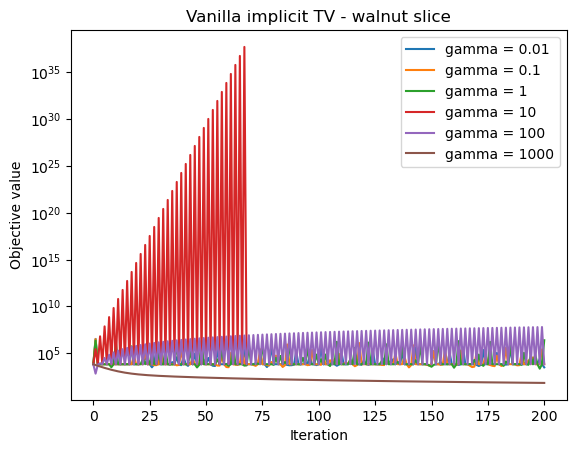

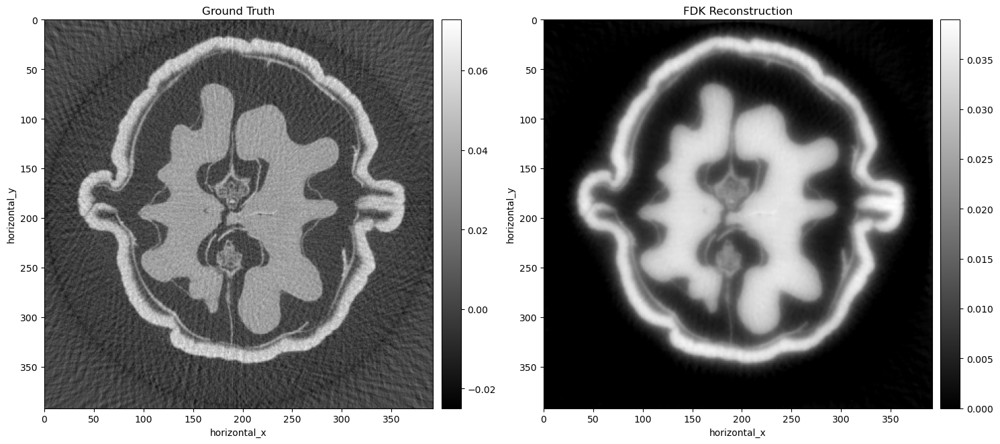

68.63774108886719
0.39487624168395996
gamma =  0.01
Initial step sizes: tau = 21.899681041785364, sigma = 0.0021899681041785365


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  121.34888
x norm =  121.19213
self.x, self.x_old =  121.19213 0.0
cross_term =  63.583842853760686 x_change_norm =  121.19213 y_change_norm =  0.2559258
2.1026644822642733
Multiplying step sizes by beta/b, beta = 0.75, b = 2.1026644822642733
tau = 7.811403540545789, sigma = 0.000781140354054579
x_tmp norm =  15.460705
x norm =  15.411726
self.x, self.x_old =  15.411726 0.0
cross_term =  0.3673448802004584 x_change_norm =  15.411726 y_change_norm =  0.091414765
1.6273406817936282
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6273406817936282
tau = 3.6000775504193387, sigma = 0.00036000775504193395
x_tmp norm =  3.2853196
x norm =  3.2676854
self.x, self.x_old =  3.2676854 0.0
cross_term =  0.00762248079783068 x_change_norm =  3.2676854 y_change_norm =  0.04214848
0.8271247127640113
After possible reduction 3.6000775504193387 0.00036000775504193395
2*self.p_norm < self.d_norm
After adaptive 0.1800038775209671 0.007200155100838672 0.9025
x_tmp norm =  2.4283955
x norm

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  119.008385
x norm =  118.99072
self.x, self.x_old =  118.99072 0.0
cross_term =  612.323762604748 x_change_norm =  118.99072 y_change_norm =  2.509897
2.100725640467483
Multiplying step sizes by beta/b, beta = 0.75, b = 2.100725640467483
tau = 0.7818612990168462, sigma = 0.007818612990168462
x_tmp norm =  15.381098
x norm =  15.375022
self.x, self.x_old =  15.375022 0.0
cross_term =  3.650711096989576 x_change_norm =  15.375022 y_change_norm =  0.9086021
1.6266218758273994
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6266218758273994
tau = 0.3604992549140271, sigma = 0.0036049925491402715
x_tmp norm =  3.283645
x norm =  3.2809634
self.x, self.x_old =  3.2809634 0.0
cross_term =  0.0766809501544746 x_change_norm =  3.2809634 y_change_norm =  0.4206956
0.8303417600890618
After possible reduction 0.3604992549140271 0.0036049925491402715
2*self.p_norm < self.d_norm
After adaptive 0.01802496274570137 0.07209985098280537 0.9025
x_tmp norm =  2.488836
x norm =  0.985023

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  99.76616
x norm =  99.764305
self.x, self.x_old =  99.764305 0.0
cross_term =  4303.795854133236 x_change_norm =  99.764305 y_change_norm =  21.04077
2.100489557035371
Multiplying step sizes by beta/b, beta = 0.75, b = 2.100489557035371
tau = 0.07819491759112057, sigma = 0.07819491759112057
x_tmp norm =  14.380368
x norm =  14.379719
self.x, self.x_old =  14.379719 0.0
cross_term =  31.926691720462053 x_change_norm =  14.379719 y_change_norm =  8.49391
1.6264804259808054
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6264804259808054
tau = 0.03605711280415528, sigma = 0.03605711280415528
x_tmp norm =  3.182061
x norm =  3.1817663
self.x, self.x_old =  3.1817663 0.0
cross_term =  0.7208114565540361 x_change_norm =  3.1817663 y_change_norm =  4.0759954
0.8307482741334434
After possible reduction 0.03605711280415528 0.03605711280415528
2*self.p_norm < self.d_norm
After adaptive 0.0018028556402077656 0.7211422560831049 0.9025
x_tmp norm =  2.7481747
x norm =  0.5457234


  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  38.124092
x norm =  38.123905
self.x, self.x_old =  38.123905 0.0
cross_term =  6284.782242316916 x_change_norm =  38.123905 y_change_norm =  80.40404
2.1004638361604484
Multiplying step sizes by beta/b, beta = 0.75, b = 2.1004638361604484
tau = 0.007819587511376883, sigma = 0.7819587511376883
x_tmp norm =  8.701223
x norm =  8.701157
self.x, self.x_old =  8.701157 0.0
cross_term =  116.89520640961713 x_change_norm =  8.701157 y_change_norm =  51.39402
1.6264634934910172
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6264634934910172
tau = 0.0036057929716853203, sigma = 0.36057929716853204
x_tmp norm =  2.423193
x norm =  2.4231622
self.x, self.x_old =  2.4231622 0.0
cross_term =  4.180485709910903 x_change_norm =  2.4231622 y_change_norm =  31.038687
0.8307906941624632
After possible reduction 0.0036057929716853203 0.36057929716853204
2*self.p_norm < self.d_norm
After adaptive 0.0001802896485842662 7.211585943370634 0.9025
x_tmp norm =  2.4474392
x norm =  0.054560

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  5.3107567
x norm =  5.310738
self.x, self.x_old =  5.310738 0.0
cross_term =  1219.5641819787359 x_change_norm =  5.310738 y_change_norm =  112.00432
2.1004612781244605
Multiplying step sizes by beta/b, beta = 0.75, b = 2.1004612781244605
tau = 0.0007819597034421404, sigma = 7.819597034421404
x_tmp norm =  1.7580459
x norm =  1.7580394
self.x, self.x_old =  1.7580394 0.0
cross_term =  47.71982393455556 x_change_norm =  1.7580394 y_change_norm =  103.83937
1.6264616178734348
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6264616178734348
tau = 0.0003605801521147499, sigma = 3.6058015211474985
x_tmp norm =  0.715828
x norm =  0.71582496
self.x, self.x_old =  0.71582496 0.0
cross_term =  3.6481514692279027 x_change_norm =  0.71582496 y_change_norm =  91.690216
0.8307949402512635
After possible reduction 0.0003605801521147499 3.6058015211474985
2*self.d_norm < self.p_norm
After adaptive 0.007211603042294991 0.1802900760573751 0.9025
x_tmp norm =  14.832598
x norm =  14.

  0%|          | 0/200 [00:00<?, ?it/s]

x_tmp norm =  0.5528018
x norm =  0.55279994
self.x, self.x_old =  0.55279994 0.0
cross_term =  132.1389280498868 x_change_norm =  0.55279994 y_change_norm =  116.58637
2.1004608810574634
Multiplying step sizes by beta/b, beta = 0.75, b = 2.1004608810574634
tau = 7.81959851262266e-05, sigma = 78.1959851262266
x_tmp norm =  0.19578345
x norm =  0.19578278
self.x, self.x_old =  0.19578278 0.0
cross_term =  5.9182122722164365 x_change_norm =  0.19578278 y_change_norm =  115.6399
1.6264614235328432
Multiplying step sizes by beta/b, beta = 0.75, b = 1.6264614235328432
tau = 3.605802633626723e-05, sigma = 36.05802633626723
x_tmp norm =  0.0889676
x norm =  0.08896729
self.x, self.x_old =  0.08896729 0.0
cross_term =  0.563533508219884 x_change_norm =  0.08896729 y_change_norm =  113.95832
0.8307954848222637
After possible reduction 3.605802633626723e-05 36.05802633626723
2*self.d_norm < self.p_norm
After adaptive 0.000721160526725344 1.8029013168133632 0.9025
x_tmp norm =  1.8578527
x norm =

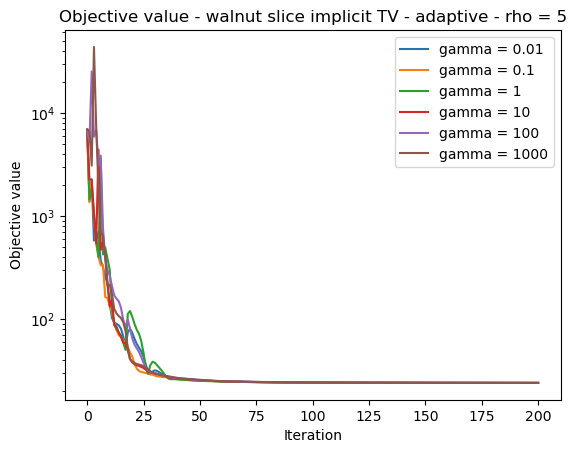

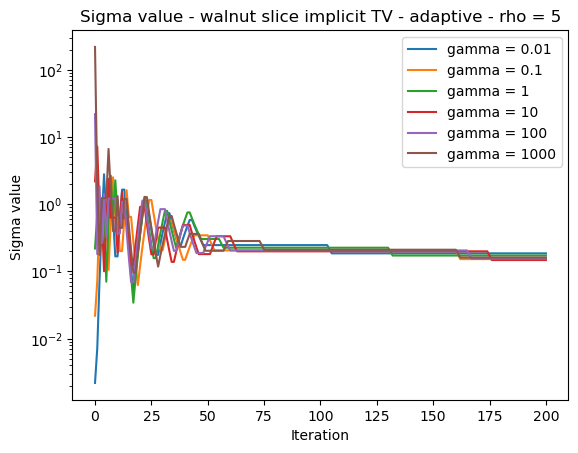

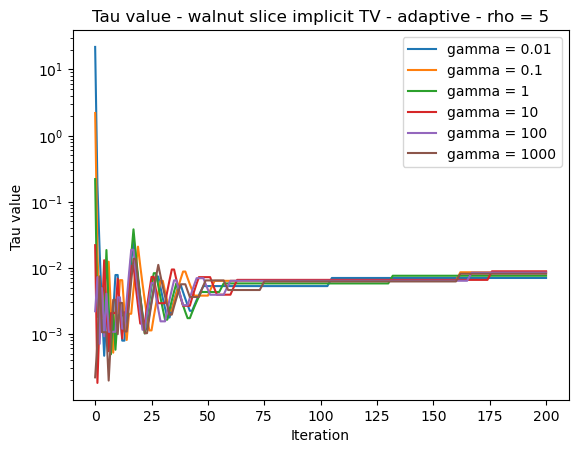

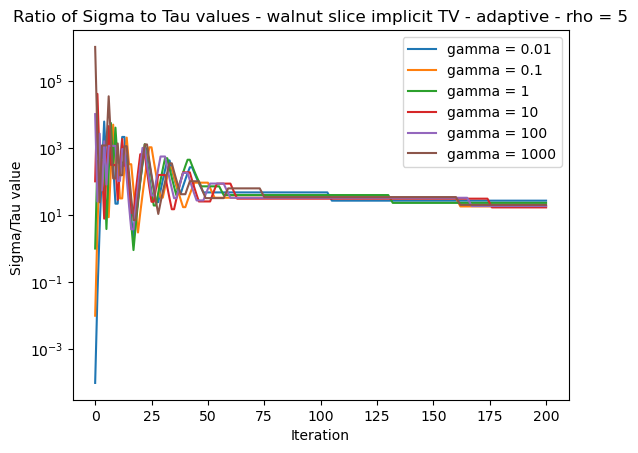

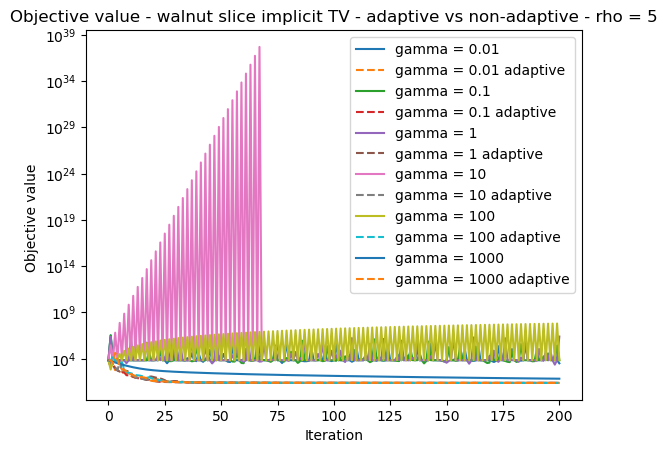

In [26]:
from cil.io import ZEISSDataReader
from cil.utilities.display import show2D, show1D, show_geometry
from cil.processors import Binner, Slicer, TransmissionAbsorptionConverter
from cil.plugins.astra.processors import FBP

filename = "/mnt/share-private/notebooks/valnut/valnut_2014-03-21_643_28/tomo-A/valnut_tomo-A.txrm"
data3D = ZEISSDataReader(file_name=filename).read()
# Get Image and Acquisition geometries
ag3D = data3D.geometry
ig3D = ag3D.get_ImageGeometry()
### Acquisition and Image geometry information
print(ag3D)
print(ig3D)
### Show Acquisition geometry and full 3D sinogram.
show_geometry(ag3D)
show2D(data3D, slice_list = [('vertical',512), ('angle',800), ('horizontal',512)], cmap="inferno", num_cols=3, size=(15,15))


# Extract vertical slice
data2D = data3D.get_slice(vertical='centre')

# delete the 3D data to save memory
del data3D

# reorder data to match default order for Astra/Tigre operator
data2D.reorder('astra')

# Select every 10 angles
sliced_data = Slicer(roi={'angle':(0,1600,10)})(data2D)

# Reduce background regions
binned_data = Binner(roi={'horizontal':(120,-120,2)})(sliced_data)

# Create absorption data 
absorption_data = TransmissionAbsorptionConverter()(binned_data) 

# Remove circular artifacts
absorption_data -= np.mean(absorption_data.as_array()[80:100,0:30])
# Get Image and Acquisition geometries for one slice
ag2D = absorption_data.geometry
ag2D.set_angles(ag2D.angles, initial_angle=0.2, angle_unit='radian')
ig2D = ag2D.get_ImageGeometry()
print(" Acquisition Geometry 2D: {} with labels {}".format(ag2D.shape, ag2D.dimension_labels))
print(" Image Geometry 2D: {} with labels {}".format(ig2D.shape, ig2D.dimension_labels))
#

# Setup and run the FBP algorithm
fbp_recon = FBP(ig2D, ag2D,  device = 'gpu')(absorption_data)



# Show reconstructions
show2D([fbp_recon], 
       title = ['FBP reconstruction'], 
       cmap = 'inferno', fix_range=(0,0.05))

A = ProjectionOperator(ig2D, ag2D, device = "gpu")
alpha_tv = 0.0003
f1 =  MixedL21Norm()
f2 = 0.5 * L2NormSquared(b=absorption_data)
F = BlockFunction(f1, f2)

# Define BlockOperator K
Grad = alpha_tv * GradientOperator(ig2D)
K = BlockOperator(Grad, A)

# Define Function G
G = IndicatorBox(lower=0)


gamma_list = [0.01, 0.1, 1, 10, 100, 1000 ]
rho=5
results_adaptive = []
objective_adaptive = []
sigma_values = []
tau_values = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/A.norm()
    tau =(rho/gamma)/A.norm() 
    pdhg_tv_explicit = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau, adaptive=True)#, eta=.95, initial=[recon, None]) 
    callback=SaveStepSizes()
    pdhg_tv_explicit.run(200, verbose=1, callbacks=[ProgressCallback(), callback])
    results_adaptive.append(pdhg_tv_explicit.solution)
    objective_adaptive.append(pdhg_tv_explicit.objective)
    sigma_values.append(callback.sigma)
    tau_values.append(callback.tau)
    

show2D([fbp_recon, pdhg_tv_explicit.solution], title = ['Ground Truth', 'PDHG Reconstruction'], origin = 'upper', num_cols = 2);
plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective value - walnut slice implicit TV - adaptive - rho = {}'.format(rho))
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), sigma_values[i], label='gamma = ' + str(gamma))
plt.title('Sigma value - walnut slice explicit TV - adaptive - rho = {}'.format(rho))
plt.xlabel('Iteration')
plt.ylabel('Sigma value')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), tau_values[i], label='gamma = ' + str(gamma))
plt.title('Tau value - walnut slice explicit TV - adaptive - rho = {}'.format(rho))
plt.xlabel('Iteration')
plt.ylabel('Tau value')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    #plt the ratio of sigma to tau
    plt.plot(range(0, 201, 1), np.array(sigma_values[i])/np.array(tau_values[i]), label='gamma = ' + str(gamma))
plt.title('Ratio of Sigma to Tau values - walnut slice explicit TV - adaptive- rho = {}'.format(rho))
plt.xlabel('Iteration')
plt.ylabel('Sigma/Tau value ')
plt.yscale('log')
plt.legend()
plt.show()



gamma_list = [0.01, 0.1, 1, 10, 100, 1000 ]
results_vanilla = []
objective_vanilla = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/A.norm()
    tau =(rho/gamma)/A.norm() 
    pdhg_tv_explicit = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau)
    pdhg_tv_explicit.run(200, verbose=1)
    results_vanilla.append(pdhg_tv_explicit.solution)
    objective_vanilla.append(pdhg_tv_explicit.objective)
    
show2D([fbp_recon, pdhg_tv_explicit.solution], title = ['Ground Truth', 'FDK Reconstruction'], origin = 'upper', num_cols = 2);
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma)+' adaptive', linestyle='dashed')
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective value - walnut slice explicit TV - adaptive vs non-adaptive - rho = {}'.format(rho))
plt.legend()
plt.show()




# PDHG with Implicit TV - adaptive vs non-adaptive
# Vanilla TV with reg parameter in front of Mixed L21 Norm

F = 0.5 * L2NormSquared(b=absorption_data)
G = (alpha_tv/ig2D.voxel_size_y) * FGP_TV(max_iteration=100, device='gpu', nonnegativity=True)
K = A



gamma_list = [0.01, 0.1, 1, 10, 100, 1000]
results_vanilla = []
objective_vanilla = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/K.norm()
    tau =(rho/gamma)/K.norm() 
    pdhg_tv_implicit = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau)
    pdhg_tv_implicit.run(200, verbose=1)
    results_vanilla.append(pdhg_tv_implicit.solution)
    objective_vanilla.append(pdhg_tv_implicit.objective)



    
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.legend()
plt.title('Vanilla implicit TV - walnut slice')
plt.show()

show2D([fbp_recon, pdhg_tv_implicit.solution], title = ['Ground Truth', 'FDK Reconstruction'], origin = 'upper', num_cols = 2);

print( F(K.direct(pdhg_tv_implicit.solution)) )
print( G(pdhg_tv_explicit.solution) )



results_adaptive = []
objective_adaptive = []
sigma_values = []
tau_values = []
for gamma in gamma_list:
    print("gamma = ", gamma)
    sigma = gamma*rho/A.norm()
    tau =(rho/gamma)/A.norm() 
    pdhg_tv_implicit_adaptive = PDHG(f = F, g = G, operator = K,
                update_objective_interval = 1, check_convergence=False, sigma=sigma, tau=tau, adaptive=True)#, eta=.95, initial=[recon, None]) 
    callback=SaveStepSizes()
    pdhg_tv_implicit_adaptive.run(200, verbose=1, callbacks=[ProgressCallback(), callback])
    results_adaptive.append(pdhg_tv_implicit_adaptive.solution)
    objective_adaptive.append(pdhg_tv_implicit_adaptive.objective)
    sigma_values.append(callback.sigma)
    tau_values.append(callback.tau)
    
plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma))
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value')
plt.title('Objective value - walnut slice implicit TV - adaptive - rho = {}'.format(rho))
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), sigma_values[i], label='gamma = ' + str(gamma))
plt.title('Sigma value - walnut slice implicit TV - adaptive - rho = {}'.format(rho))
plt.xlabel('Iteration')
plt.ylabel('Sigma value ')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), tau_values[i], label='gamma = ' + str(gamma))
plt.title('Tau value - walnut slice implicit TV - adaptive - rho = {}'.format(rho))
plt.xlabel('Iteration')
plt.ylabel('Tau value ')
plt.yscale('log')
plt.legend()
plt.show()

plt.figure()
for i, gamma in enumerate(gamma_list):
    #plt the ratio of sigma to tau
    plt.plot(range(0, 201, 1), np.array(sigma_values[i])/np.array(tau_values[i]), label='gamma = ' + str(gamma))
plt.title('Ratio of Sigma to Tau values - walnut slice implicit TV - adaptive - rho = {}'.format(rho))
plt.xlabel('Iteration')
plt.ylabel('Sigma/Tau value ')
plt.yscale('log')
plt.legend()
plt.show()
for i, gamma in enumerate(gamma_list):
    plt.plot(range(0, 201, 1), objective_vanilla[i], label='gamma = ' + str(gamma))
    plt.plot(range(0, 201, 1), objective_adaptive[i], label='gamma = ' + str(gamma)+' adaptive', linestyle='dashed')
plt.yscale('log')
plt.xlabel('Iteration')
plt.ylabel('Objective value ')
plt.title('Objective value - walnut slice implicit TV - adaptive vs non-adaptive - rho = {}'.format(rho))
plt.legend()
plt.show()